# Housekeeping

In [1]:
# %pip install ipympl mplcursors ipywidgets
%matplotlib widget


In [2]:
import sys
import os
sys.path.append('/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/')

In [3]:
import albumentations as A
from albumentations.pytorch import ToTensorV2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats 
from scipy.stats import shapiro , kstest, mannwhitneyu, ttest_rel
import torch
from torch import nn
from datasets.datasets import MRIDataset, STAREDataset

from helper_func.analyis_helper import clean_df, plot_boxplots, visualize, generate_batch_views, visualize_views, visualize_class_centroids, visualize_feats, prod_feats
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA


# Main Section

## Loading

In [4]:
ssa_na = pd.read_csv("/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/results/F_NA_SSA/boxes/SSA_boxes.csv")
ssa_a = pd.read_csv("/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/results/F_A_SSA/boxes/SSA_boxes.csv")

FileNotFoundError: [Errno 2] No such file or directory: '/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/results/F_NA_SSA/boxes/SSA_boxes.csv'

## Analysis

### Cleaning

In [ ]:
na_ssa = clean_df(ssa_na, True, 'brats')
na_ssa.describe()

,dice_NCR,dice_ED,dice_ET,hausdorff_NCR,hausdorff_ED,hausdorff_ET,recall_NCR,recall_ED,recall_ET,precision_NCR,precision_ED,precision_ET
count,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000
mean,0.639214,0.713265,0.702905,13.762640,34.237908,36.271840,0.683469,0.794991,0.680281,0.690367,0.687769,0.761637
std,0.265168,0.195719,0.121839,16.099888,18.770788,25.655919,0.280846,0.178098,0.174107,0.251359,0.208245,0.129517
min,0.187597,0.277826,0.466156,2.236068,12.727922,5.830952,0.108287,0.465294,0.358483,0.262109,0.173377,0.538134
25%,0.405971,0.636064,0.654525,4.582576,15.305222,13.003844,0.603735,0.698824,0.584101,0.655361,0.649660,0.666278
50%,0.769110,0.769786,0.703247,6.082763,42.673176,41.478298,0.772703,0.821422,0.663676,0.758884,0.764914,0.807738
75%,0.860987,0.873246,0.728138,10.246951,46.043457,58.019814,0.860924,0.952150,0.803699,0.855543,0.804762,0.845351
max,0.883937,0.884531,0.885934,45.822964,64.293076,72.367813,0.994836,0.975542,0.898385,0.948401,0.868561,0.931247


In [ ]:
a_ssa = clean_df(ssa_a, True, 'brats')
a_ssa.describe()

,dice_NCR,dice_ED,dice_ET,hausdorff_NCR,hausdorff_ED,hausdorff_ET,recall_NCR,recall_ED,recall_ET,precision_NCR,precision_ED,precision_ET
count,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000
mean,0.632602,0.683839,0.679092,15.463085,39.113440,23.005866,0.708117,0.692250,0.581104,0.625018,0.705351,0.846525
std,0.232285,0.229314,0.130217,15.796107,9.515104,19.497170,0.283863,0.229055,0.167351,0.203352,0.213682,0.083121
min,0.206508,0.293888,0.465432,2.828427,21.931713,5.477226,0.127797,0.243873,0.335299,0.282686,0.212272,0.729896
25%,0.559861,0.566196,0.610933,5.196152,31.968735,8.062258,0.730590,0.506962,0.491596,0.528884,0.641105,0.760647
50%,0.733171,0.776794,0.668171,8.306623,41.243183,16.991165,0.767973,0.783389,0.526743,0.724292,0.766144,0.867540
75%,0.814352,0.856466,0.742876,20.518284,44.944408,39.971199,0.879401,0.857654,0.726652,0.742220,0.851117,0.913422
max,0.850239,0.901463,0.859619,47.508942,50.576675,58.403767,0.991178,0.906123,0.827033,0.923219,0.934781,0.939584


### Best in df

In [ ]:
best_in_a_ssa = a_ssa[(a_ssa['dice_ED'] > 0.7) & (a_ssa['dice_ET'] > 0.7) & (a_ssa['dice_NCR'] > 0.7)]
best_in_a_ssa

,name,dice_NCR,dice_ED,dice_ET,hausdorff_NCR,hausdorff_ED,hausdorff_ET,recall_NCR,recall_ED,recall_ET,precision_NCR,precision_ED,precision_ET
1,BraTS-SSA-00012-000.npy,0.836975,0.856466,0.718226,5.196152,43.688663,39.971199,0.991178,0.857654,0.581281,0.724292,0.855282,0.939584
2,BraTS-SSA-00049-000.npy,0.850239,0.802582,0.846802,2.828427,48.768845,58.403767,0.787952,0.842660,0.827033,0.923219,0.766144,0.867540
7,BraTS-SSA-00152-000.npy,0.814352,0.734277,0.859619,3.162278,29.427877,5.477226,0.879401,0.741681,0.792666,0.758263,0.727019,0.938925


In [ ]:
worst_in_a_ssa = a_ssa[(a_ssa['dice_ED'] < 0.6) & (a_ssa['dice_ET'] < 0.6) & (a_ssa['dice_NCR'] < 0.6)]
worst_in_a_ssa

,name,dice_NCR,dice_ED,dice_ET,hausdorff_NCR,hausdorff_ED,hausdorff_ET,recall_NCR,recall_ED,recall_ET,precision_NCR,precision_ED,precision_ET
6,BraTS-SSA-00119-000.npy,0.320641,0.566196,0.543444,8.306623,39.470863,44.26963,0.37037,0.506962,0.432868,0.282686,0.641105,0.729896


In [ ]:
mid_in_a_ssa = a_ssa[
    ((a_ssa['dice_ED'] >= 0.6) & (a_ssa['dice_ET'] < 0.7) & (a_ssa['dice_NCR'] < 0.7)) |
    ((a_ssa['dice_ET'] >= 0.6) & (a_ssa['dice_ED'] < 0.7) & (a_ssa['dice_NCR'] < 0.7)) |
    ((a_ssa['dice_NCR'] >= 0.6) & (a_ssa['dice_ED'] < 0.7) & (a_ssa['dice_ET'] < 0.7))
]['name'].to_list()
mid_in_a_ssa

['BraTS-SSA-00002-000.npy',
 'BraTS-SSA-00115-000.npy',
 'BraTS-SSA-00223-000.npy']

In [ ]:
best_in_na_ssa = na_ssa[(na_ssa['dice_ED'] > 0.7) & (na_ssa['dice_ET'] > 0.7) & (na_ssa['dice_NCR'] > 0.7)]
best_in_na_ssa

,name,dice_NCR,dice_ED,dice_ET,hausdorff_NCR,hausdorff_ED,hausdorff_ET,recall_NCR,recall_ED,recall_ET,precision_NCR,precision_ED,precision_ET
1,BraTS-SSA-00012-000.npy,0.860987,0.873246,0.703247,3.605551,48.228622,62.331203,0.994836,0.975542,0.752940,0.758884,0.790367,0.659708
2,BraTS-SSA-00049-000.npy,0.872155,0.769786,0.850653,2.236068,42.673176,58.019814,0.860924,0.952150,0.898385,0.883683,0.646050,0.807738
7,BraTS-SSA-00152-000.npy,0.769110,0.725514,0.885934,5.385165,43.692104,8.602325,0.698904,0.821422,0.880896,0.854995,0.649660,0.891029


In [ ]:
worst_in_na_ssa = na_ssa[(na_ssa['dice_ED'] < 0.7) & (na_ssa['dice_ET'] < 0.7) & (na_ssa['dice_NCR'] < 0.7)]
worst_in_na_ssa

,name,dice_NCR,dice_ED,dice_ET,hausdorff_NCR,hausdorff_ED,hausdorff_ET,recall_NCR,recall_ED,recall_ET,precision_NCR,precision_ED,precision_ET
5,BraTS-SSA-00115-000.npy,0.628489,0.277826,0.466156,6.082763,46.043457,41.478298,0.603735,0.698824,0.358483,0.655361,0.173377,0.666278
6,BraTS-SSA-00119-000.npy,0.332665,0.636064,0.674947,45.822964,64.293076,48.533493,0.384259,0.599577,0.663676,0.293286,0.677280,0.686608


In [ ]:
mid_in_na_ssa = na_ssa[
    ((na_ssa['dice_ED'] >= 0.6) & (na_ssa['dice_ET'] < 0.7) & (na_ssa['dice_NCR'] < 0.7)) |
    ((na_ssa['dice_ET'] >= 0.6) & (na_ssa['dice_ED'] < 0.7) & (na_ssa['dice_NCR'] < 0.7)) |
    ((na_ssa['dice_NCR'] >= 0.6) & (na_ssa['dice_ED'] < 0.7) & (na_ssa['dice_ET'] < 0.7))
]
mid_in_na_ssa

,name,dice_NCR,dice_ED,dice_ET,hausdorff_NCR,hausdorff_ED,hausdorff_ET,recall_NCR,recall_ED,recall_ET,precision_NCR,precision_ED,precision_ET
3,BraTS-SSA-00096-000.npy,0.812015,0.578618,0.654525,10.246951,15.305222,13.003844,0.772703,0.465294,0.540876,0.855543,0.764914,0.828637
5,BraTS-SSA-00115-000.npy,0.628489,0.277826,0.466156,6.082763,46.043457,41.478298,0.603735,0.698824,0.358483,0.655361,0.173377,0.666278
6,BraTS-SSA-00119-000.npy,0.332665,0.636064,0.674947,45.822964,64.293076,48.533493,0.384259,0.599577,0.663676,0.293286,0.677280,0.686608


In [ ]:
na_ssa

,name,dice_NCR,dice_ED,dice_ET,hausdorff_NCR,hausdorff_ED,hausdorff_ET,recall_NCR,recall_ED,recall_ET,precision_NCR,precision_ED,precision_ET
0,BraTS-SSA-00002-000.npy,0.405971,0.881098,0.728138,37.357723,12.884099,72.367813,0.899894,0.894002,0.639472,0.262109,0.868561,0.845351
1,BraTS-SSA-00012-000.npy,0.860987,0.873246,0.703247,3.605551,48.228622,62.331203,0.994836,0.975542,0.752940,0.758884,0.790367,0.659708
2,BraTS-SSA-00049-000.npy,0.872155,0.769786,0.850653,2.236068,42.673176,58.019814,0.860924,0.952150,0.898385,0.883683,0.646050,0.807738
3,BraTS-SSA-00096-000.npy,0.812015,0.578618,0.654525,10.246951,15.305222,13.003844,0.772703,0.465294,0.540876,0.855543,0.764914,0.828637
4,BraTS-SSA-00113-000.npy,0.883937,0.792705,0.644637,4.582576,22.293497,16.278820,0.827678,0.781004,0.803699,0.948401,0.804762,0.538134
5,BraTS-SSA-00115-000.npy,0.628489,0.277826,0.466156,6.082763,46.043457,41.478298,0.603735,0.698824,0.358483,0.655361,0.173377,0.666278
6,BraTS-SSA-00119-000.npy,0.332665,0.636064,0.674947,45.822964,64.293076,48.533493,0.384259,0.599577,0.663676,0.293286,0.677280,0.686608
7,BraTS-SSA-00152-000.npy,0.769110,0.725514,0.885934,5.385165,43.692104,8.602325,0.698904,0.821422,0.880896,0.854995,0.649660,0.891029
8,BraTS-SSA-00223-000.npy,0.187597,0.884531,0.717911,8.544003,12.727922,5.830952,0.108287,0.967102,0.584101,0.701043,0.814951,0.931247


In [ ]:
a_ssa

,name,dice_NCR,dice_ED,dice_ET,hausdorff_NCR,hausdorff_ED,hausdorff_ET,recall_NCR,recall_ED,recall_ET,precision_NCR,precision_ED,precision_ET
0,BraTS-SSA-00002-000.npy,0.559861,0.901463,0.656321,8.544003,21.931713,5.744563,0.978040,0.870438,0.515796,0.392178,0.934781,0.902088
1,BraTS-SSA-00012-000.npy,0.836975,0.856466,0.718226,5.196152,43.688663,39.971199,0.991178,0.857654,0.581281,0.724292,0.855282,0.939584
2,BraTS-SSA-00049-000.npy,0.850239,0.802582,0.846802,2.828427,48.768845,58.403767,0.787952,0.842660,0.827033,0.923219,0.766144,0.867540
3,BraTS-SSA-00096-000.npy,0.733171,0.345124,0.742876,20.518284,41.243183,10.630146,0.730590,0.243873,0.726652,0.735770,0.590136,0.759841
4,BraTS-SSA-00113-000.npy,0.754877,0.776794,0.610933,47.508942,50.576675,16.991165,0.767973,0.783389,0.491596,0.742220,0.770308,0.806784
5,BraTS-SSA-00115-000.npy,0.616792,0.293888,0.465432,8.246211,44.944408,17.502840,0.739748,0.477467,0.335299,0.528884,0.212272,0.760647
6,BraTS-SSA-00119-000.npy,0.320641,0.566196,0.543444,8.306623,39.470863,44.269630,0.370370,0.506962,0.432868,0.282686,0.641105,0.729896
7,BraTS-SSA-00152-000.npy,0.814352,0.734277,0.859619,3.162278,29.427877,5.477226,0.879401,0.741681,0.792666,0.758263,0.727019,0.938925
8,BraTS-SSA-00223-000.npy,0.206508,0.877759,0.668171,34.856842,31.968735,8.062258,0.127797,0.906123,0.526743,0.537651,0.851117,0.913422


### Best in DF Validation


In [ ]:
# gli_na = pd.read_csv('/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/results/F_GLI/boxes/SSA_boxes.csv')
# gli_a = pd.read_csv("/scratch-second/FYP/F_A_GLI/F_A_GLI.csv")

FileNotFoundError: [Errno 2] No such file or directory: '/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/results/F_GLI/boxes/SSA_boxes.csv'

In [ ]:
gli_na = clean_df(gli_na, True, 'brats')
gli_na.describe()

,dice_NCR,dice_ED,dice_ET,hausdorff_NCR,hausdorff_ED,hausdorff_ET,recall_NCR,recall_ED,recall_ET,precision_NCR,precision_ED,precision_ET
count,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000
mean,0.784404,0.792907,0.855671,8.355458,33.512135,15.815604,0.885914,0.923773,0.894456,0.730077,0.707405,0.838063
std,0.209732,0.099858,0.111929,15.188998,26.158594,27.760044,0.211397,0.117164,0.128950,0.216175,0.111495,0.098485
min,0.000000,0.356736,0.214783,1.000000,2.449490,1.000000,0.000000,0.263033,0.121631,0.000000,0.425386,0.409636
25%,0.745294,0.740883,0.844587,1.866025,5.954488,1.414214,0.875710,0.925150,0.893714,0.653262,0.628367,0.810528
50%,0.858811,0.813792,0.887044,3.605551,30.096491,2.828427,0.966644,0.967253,0.930352,0.805959,0.732958,0.859545
75%,0.913391,0.874663,0.911391,6.242944,54.980488,11.131089,0.989691,0.988695,0.954685,0.869467,0.796746,0.900515
max,0.969861,0.910319,0.953241,95.106255,96.179520,112.628815,0.999508,0.998685,0.991166,1.000000,0.878381,0.976171


In [ ]:
gli_a = clean_df(gli_a, True, 'brats')
gli_a.describe()

,dice_NCR,dice_ED,dice_ET,hausdorff_NCR,hausdorff_ED,hausdorff_ET,recall_NCR,recall_ED,recall_ET,precision_NCR,precision_ED,precision_ET
count,173.000000,173.000000,173.000000,173.000000,173.000000,173.000000,173.000000,173.000000,173.000000,173.000000,173.000000,173.000000
mean,0.755348,0.777396,0.826226,16.587943,26.893294,8.792202,0.805546,0.760458,0.853230,0.754477,0.824873,0.828042
std,0.228651,0.167748,0.154011,24.939504,26.318354,18.797517,0.250978,0.189888,0.179822,0.202209,0.148302,0.137310
min,0.005626,0.101208,0.000000,1.000000,1.000000,1.000000,0.003125,0.053564,0.000000,0.013171,0.308161,0.000000
25%,0.718375,0.710838,0.810651,3.000000,4.123106,1.414214,0.750838,0.662067,0.836539,0.712942,0.776857,0.793534
50%,0.844576,0.844045,0.875635,4.898980,15.132746,2.000000,0.919042,0.817094,0.915447,0.821301,0.883119,0.854506
75%,0.903561,0.897178,0.907598,12.124355,48.093658,4.690416,0.971081,0.896370,0.950860,0.884063,0.928801,0.909149
max,0.978188,0.960232,0.955813,98.840019,122.511635,94.206161,0.996989,0.980493,0.995463,0.991015,0.975763,0.990601


In [ ]:
best_in_gli_na = gli_na[(gli_na['dice_ED'] > 0.85) & (gli_na['dice_ET'] > 0.9) & (gli_na['dice_NCR'] > 0.9)][['name','dice_NCR', 'dice_ET', 'dice_ED']]
best_in_gli_na

,name,dice_NCR,dice_ET,dice_ED
12,BraTS-GLI-00095-001.npy,0.961787,0.932466,0.893610
25,BraTS-GLI-00259-000.npy,0.922818,0.932538,0.875604
33,BraTS-GLI-00336-000.npy,0.959188,0.922058,0.890866
58,BraTS-GLI-00548-001.npy,0.914358,0.936776,0.910319


In [ ]:
worst_in_gli_na = gli_na[(gli_na['dice_ED'] < 0.7) & (gli_na['dice_ET'] < 0.7) & (gli_na['dice_NCR'] < 0.7)]
worst_in_gli_na

,name,dice_NCR,dice_ED,dice_ET,hausdorff_NCR,hausdorff_ED,hausdorff_ET,recall_NCR,recall_ED,recall_ET,precision_NCR,precision_ED,precision_ET


In [ ]:
mid_in_gli_na = gli_na[
    ((gli_na['dice_ED'] >= 0.6) & (gli_na['dice_ET'] < 0.7) & (gli_na['dice_NCR'] < 0.7)) |
    ((gli_na['dice_ET'] >= 0.6) & (gli_na['dice_ED'] < 0.7) & (gli_na['dice_NCR'] < 0.7)) |
    ((gli_na['dice_NCR'] >= 0.6) & (gli_na['dice_ED'] < 0.7) & (gli_na['dice_ET'] < 0.7))
]
mid_in_gli_na

,name,dice_NCR,dice_ED,dice_ET,hausdorff_NCR,hausdorff_ED,hausdorff_ET,recall_NCR,recall_ED,recall_ET,precision_NCR,precision_ED,precision_ET
3,BraTS-GLI-00008-000.npy,0.000000,0.786636,0.615012,5.477226,51.980766,66.952591,0.000000,0.949710,0.816720,0.000000,0.671357,0.493204
7,BraTS-GLI-00043-000.npy,0.568419,0.844765,0.479423,21.679483,6.164414,10.440307,0.989967,0.899269,0.330580,0.398661,0.796490,0.872071
28,BraTS-GLI-00289-000.npy,0.501114,0.659612,0.828066,38.178520,20.814655,10.816654,0.933610,0.978986,0.867914,0.342466,0.497359,0.791717
50,BraTS-GLI-00523-000.npy,0.200000,0.863510,0.695652,3.464102,5.744563,11.445523,0.111111,0.849134,0.637813,1.000000,0.878381,0.765027
53,BraTS-GLI-00543-000.npy,0.000000,0.892116,0.214783,34.968548,5.385165,44.987221,0.000000,0.985036,0.121631,0.000000,0.815215,0.917311
69,BraTS-GLI-00615-000.npy,0.593445,0.681122,0.819950,37.107952,52.325901,2.000000,0.892970,0.888156,0.809288,0.444386,0.552363,0.830896


In [ ]:
best_in_gli_na = gli_na[(gli_na['dice_ED'] >= 0.80) & (gli_na['dice_ET'] >= 0.8) & (gli_na['dice_NCR'] >= 0.8)][['name','dice_NCR', 'dice_ET', 'dice_ED']]
best_in_gli_na

,name,dice_NCR,dice_ET,dice_ED
1,BraTS-GLI-00005-000.npy,0.947200,0.877195,0.873164
2,BraTS-GLI-00006-000.npy,0.969861,0.901432,0.837368
6,BraTS-GLI-00036-001.npy,0.912424,0.887044,0.894482
9,BraTS-GLI-00070-000.npy,0.924751,0.909048,0.849143
11,BraTS-GLI-00095-000.npy,0.963869,0.883910,0.875784
12,BraTS-GLI-00095-001.npy,0.961787,0.932466,0.893610
17,BraTS-GLI-00165-000.npy,0.874204,0.873823,0.901191
18,BraTS-GLI-00172-000.npy,0.837560,0.843757,0.876693
19,BraTS-GLI-00187-000.npy,0.871415,0.939825,0.896281
23,BraTS-GLI-00235-000.npy,0.946273,0.909054,0.815366


### Selection for Analysis
Worst - ['BraTS-SSA-00115-000.npy','BraTS-SSA-00119-000.npy']
Best - ['BraTS-SSA-00012-000.npy','BraTS-SSA-00049-000.npy']

BraTS-GLI-00008-000-stk.npy
[[ 78. 151.  80. 152.]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


label.shape (3, 192, 224, 160)


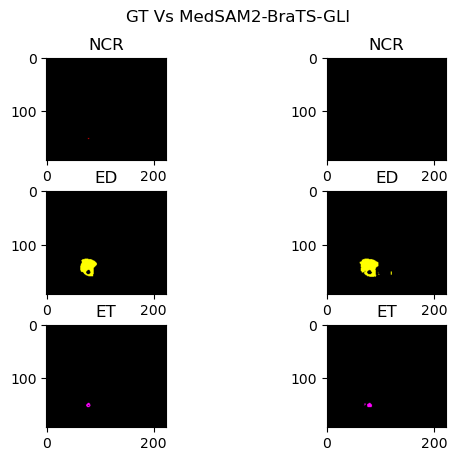

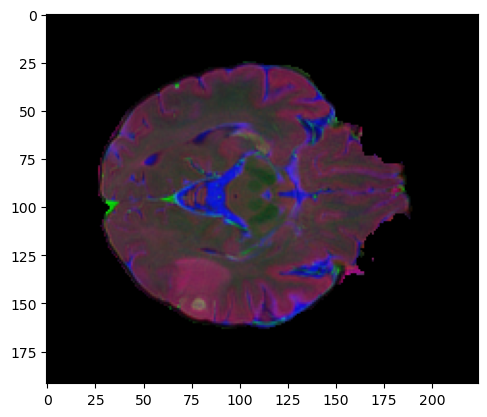

BraTS-GLI-00043-000-stk.npy
[[108.  43. 131.  60.]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


label.shape (3, 192, 224, 160)


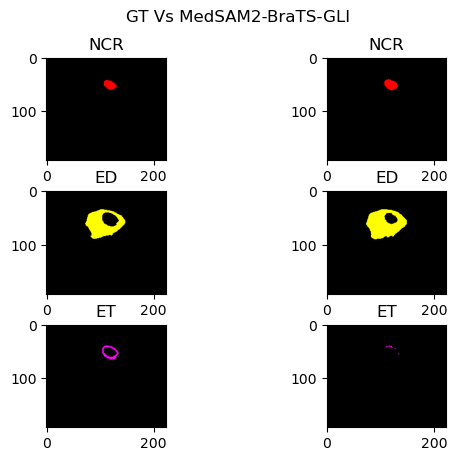

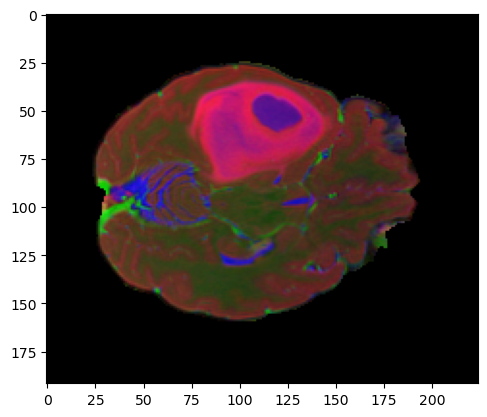

BraTS-GLI-00095-001-stk.npy
[[113.  89. 172. 142.]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


label.shape (3, 192, 224, 160)


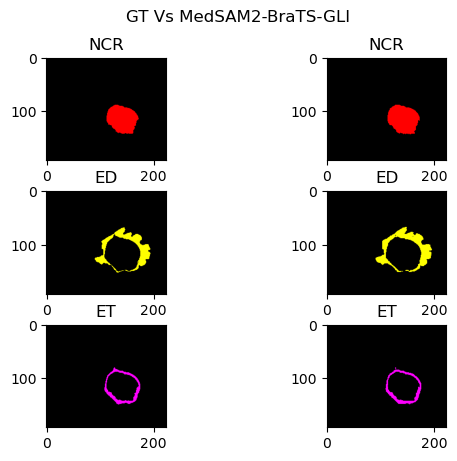

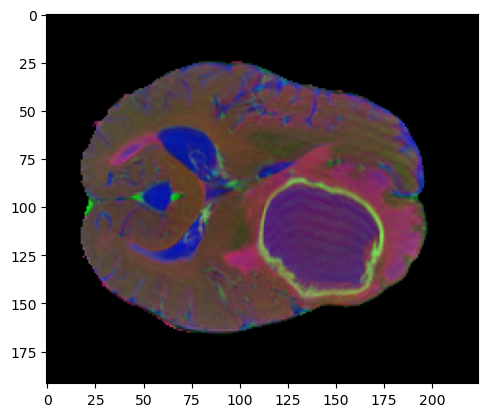

BraTS-GLI-00172-000-stk.npy
[[ 62.  33. 110.  59.]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


label.shape (3, 192, 224, 160)


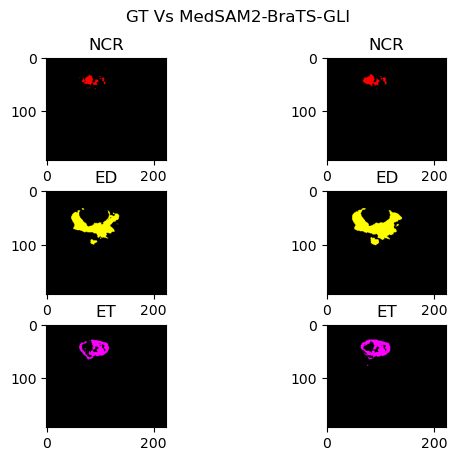

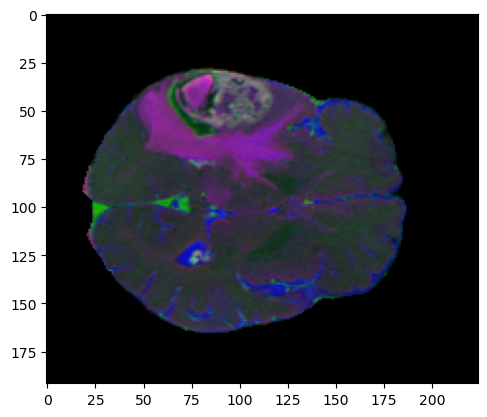

BraTS-GLI-00259-000-stk.npy
[[43. 69. 69. 90.]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


label.shape (3, 192, 224, 160)


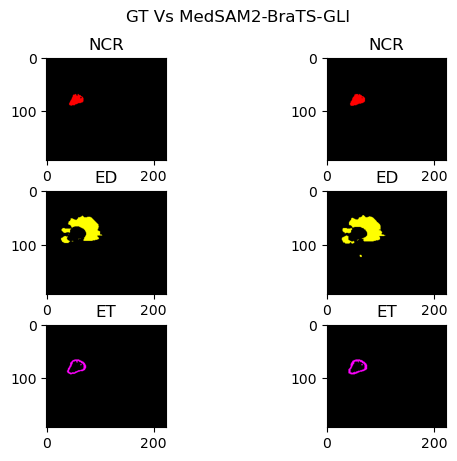

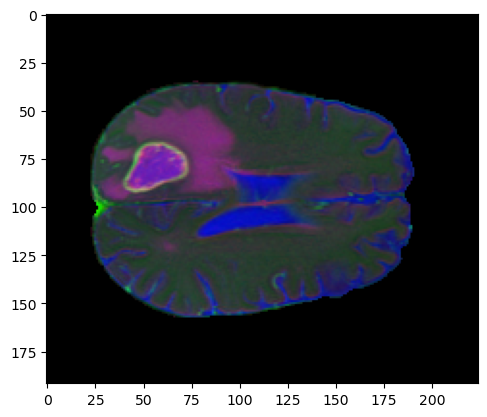

BraTS-GLI-00289-000-stk.npy
[[86. 63. 87. 65.]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


label.shape (3, 192, 224, 160)


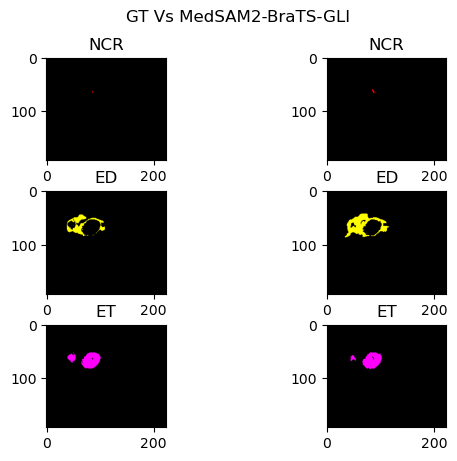

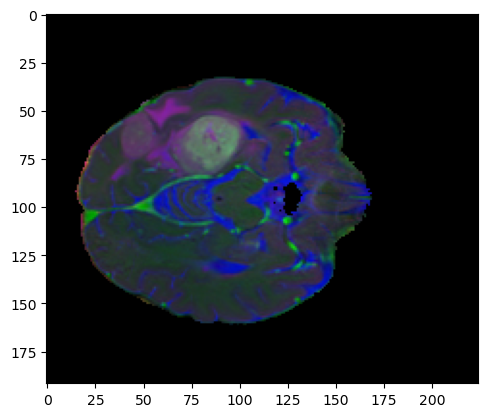

BraTS-GLI-00336-000-stk.npy
[[144.  56. 176.  81.]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


label.shape (3, 192, 224, 160)


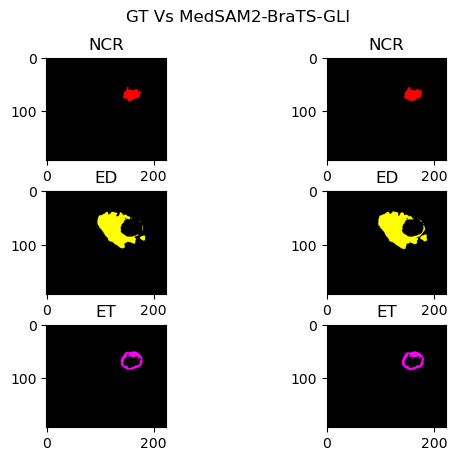

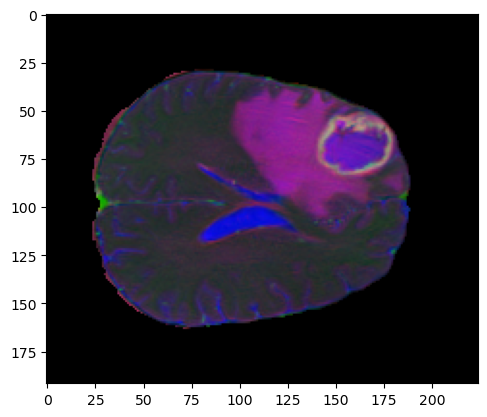

BraTS-GLI-00523-000-stk.npy
[[ 91. 126.  92. 129.]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


label.shape (3, 192, 224, 160)


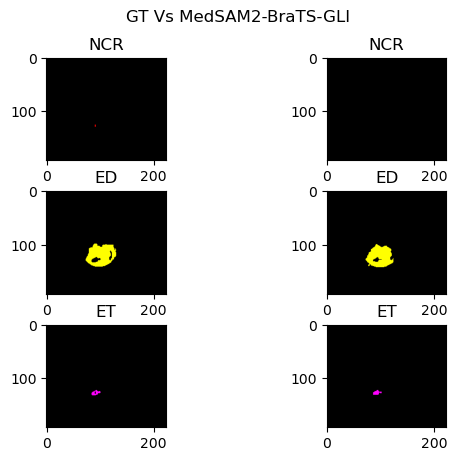

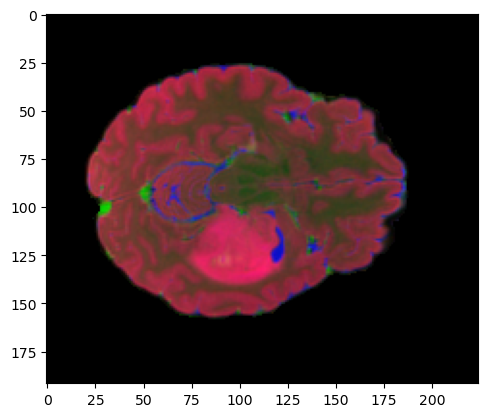

BraTS-GLI-00548-001-stk.npy
[[103. 117. 127. 143.]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


label.shape (3, 192, 224, 160)


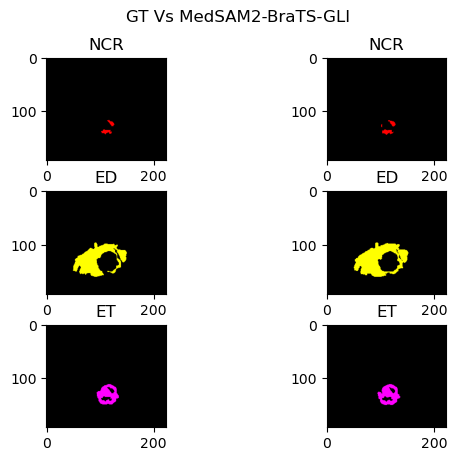

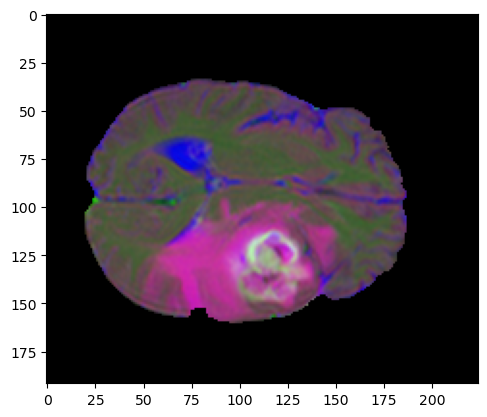

BraTS-GLI-00692-001-stk.npy
[[ 74. 108. 108. 120.]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


label.shape (3, 192, 224, 160)


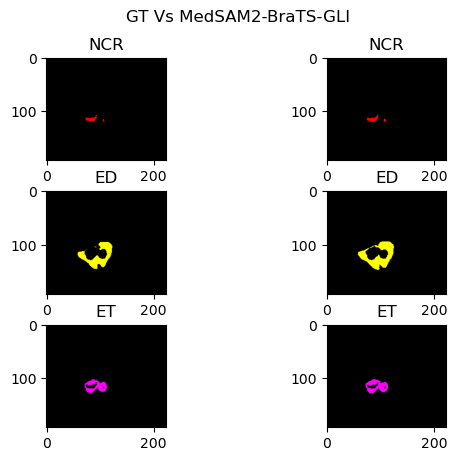

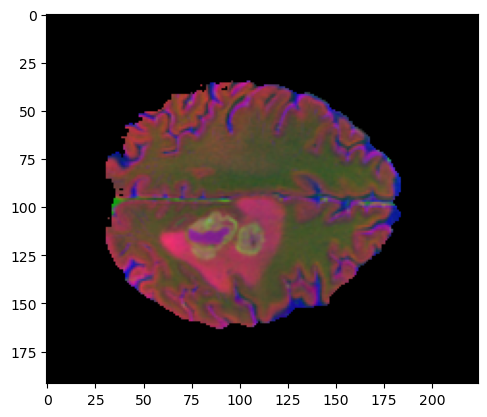

BraTS-SSA-00002-000-stk.npy
[[ 94. 116. 101. 125.]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


label.shape (3, 192, 224, 160)


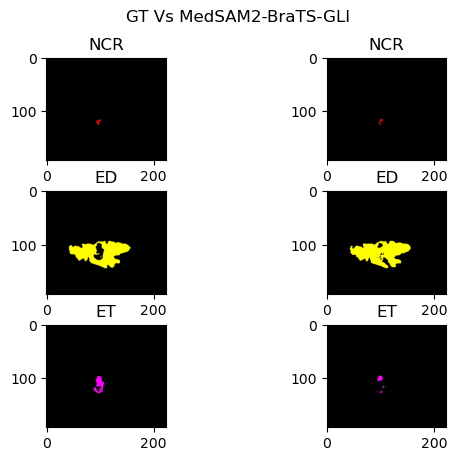

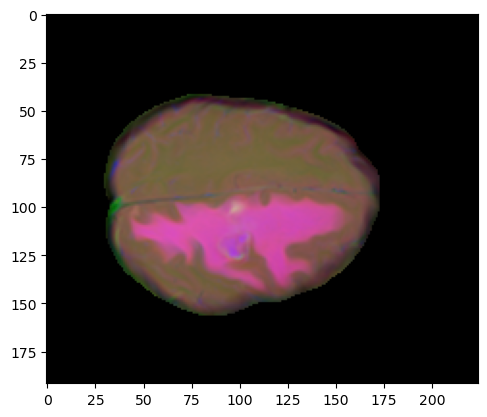

BraTS-SSA-00012-000-stk.npy
[[ 88. 114. 120. 138.]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


label.shape (3, 192, 224, 160)


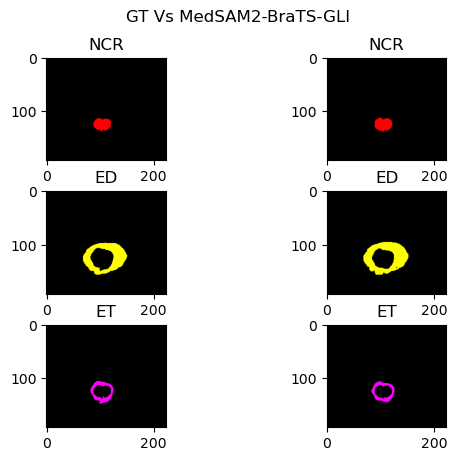

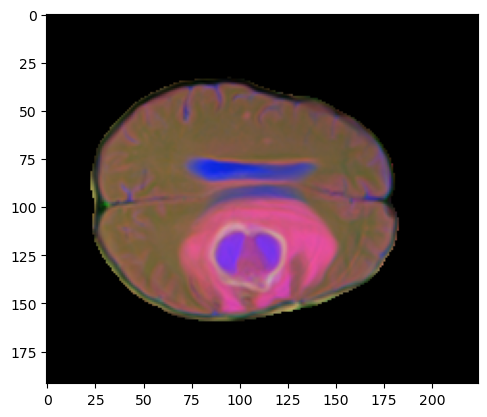

BraTS-SSA-00046-000-stk.npy
[[0. 0. 0. 0.]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


label.shape (3, 192, 224, 160)


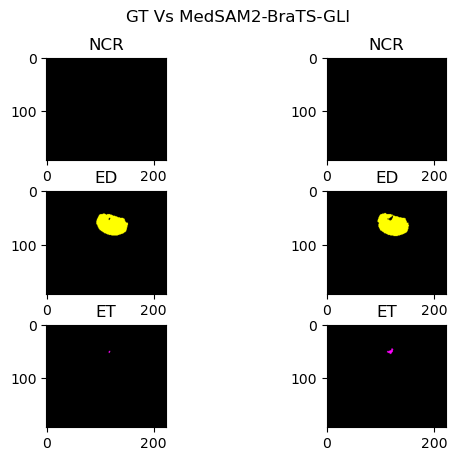

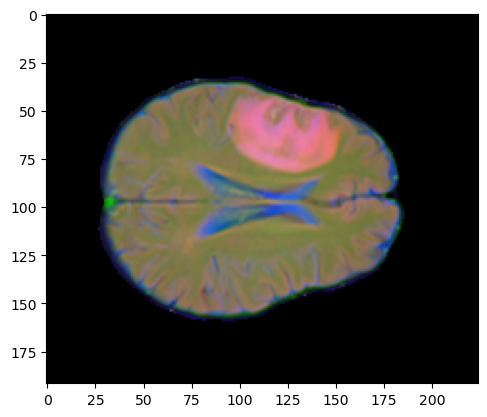

BraTS-SSA-00049-000-stk.npy
[[63. 52. 92. 80.]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


label.shape (3, 192, 224, 160)


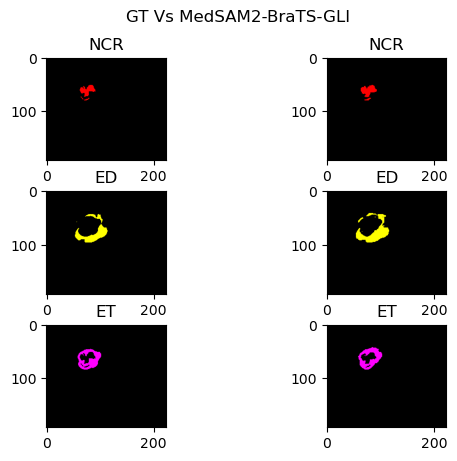

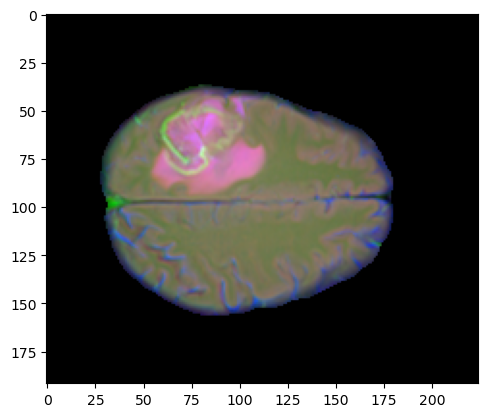

BraTS-SSA-00096-000-stk.npy
[[ 77.  39. 130. 110.]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


label.shape (3, 192, 224, 160)


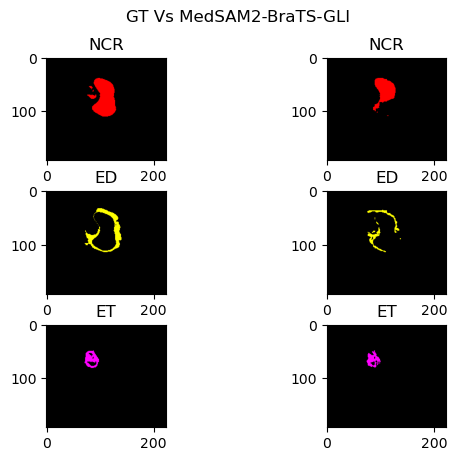

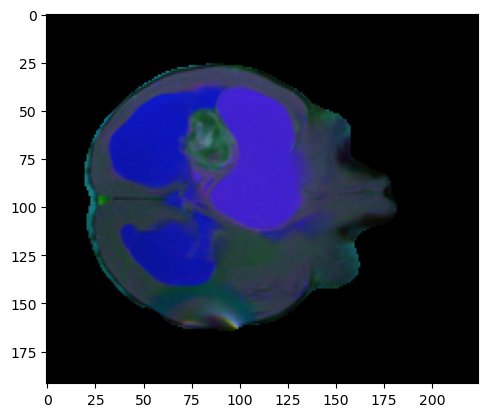

BraTS-SSA-00113-000-stk.npy
[[ 74. 100. 125. 159.]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


label.shape (3, 192, 224, 160)


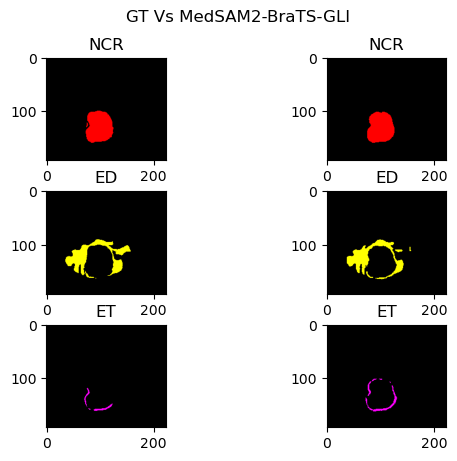

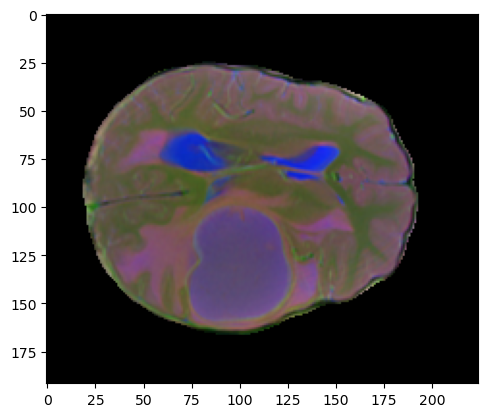

BraTS-SSA-00115-000-stk.npy
[[105.  41. 163. 122.]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


label.shape (3, 192, 224, 160)


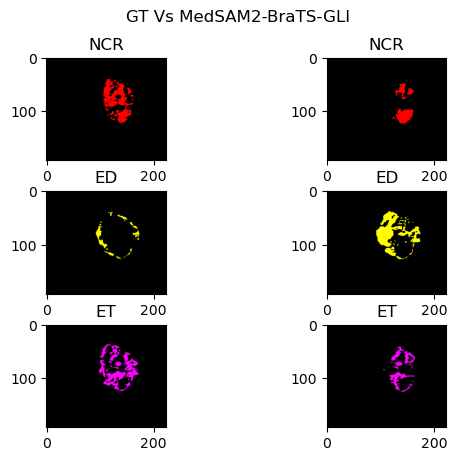

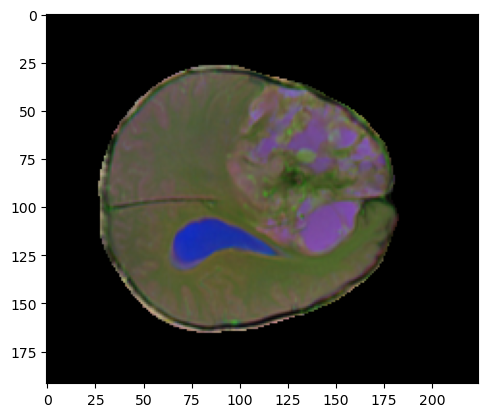

BraTS-SSA-00119-000-stk.npy
[[124. 106. 129. 111.]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


label.shape (3, 192, 224, 160)


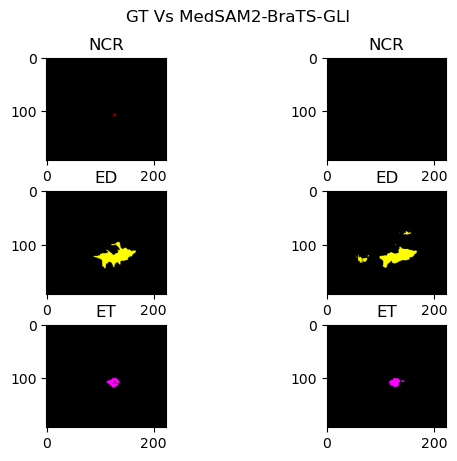

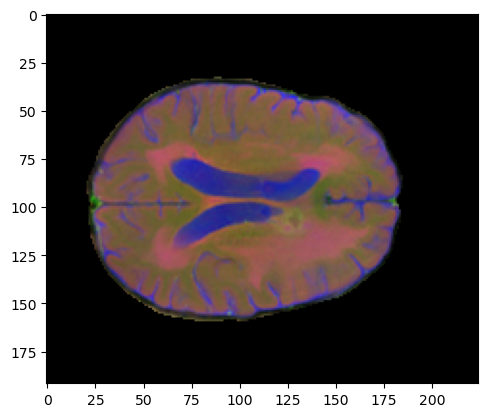

BraTS-SSA-00152-000-stk.npy
[[ 81.  95. 147. 145.]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


label.shape (3, 192, 224, 160)


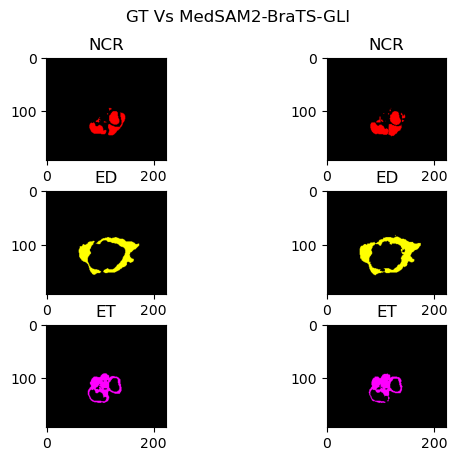

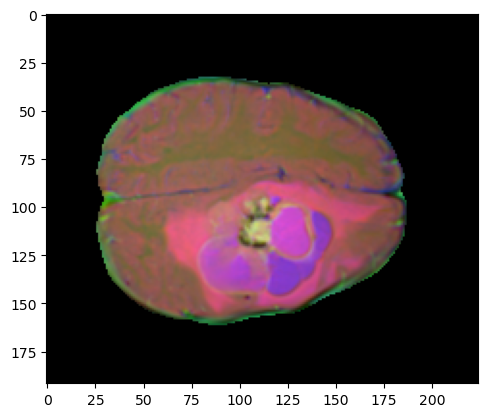

BraTS-SSA-00223-000-stk.npy
[[ 84.  63. 104.  95.]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


label.shape (3, 192, 224, 160)


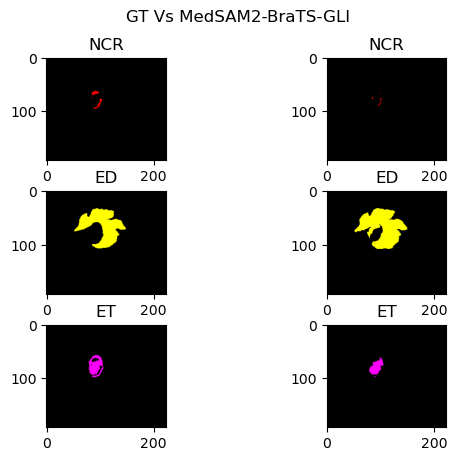

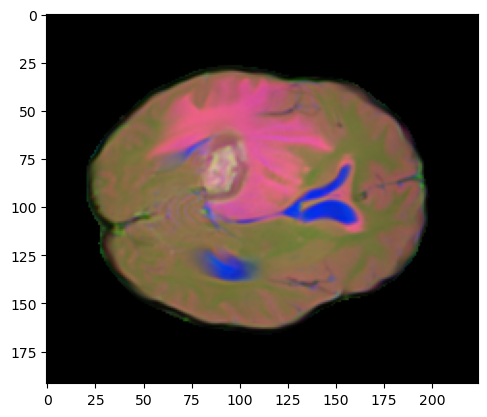

In [ ]:
SSA_video_path = "/scratch_net/ken/radjoe/BraTS_SSA/Feature_extraction/images_UNN"
SSA_label_path = "/scratch_net/ken/radjoe/BraTS_SSA/Feature_extraction/labels_UNN"
SSA_pred_path = "/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/results/Feat_extraction/boxes"
SSA_best_dataset = MRIDataset(SSA_video_path, SSA_label_path)
visualize(SSA_best_dataset, SSA_pred_path, 'GT Vs MedSAM2-BraTS-GLI', SSA_video_path)

[[ 94. 116. 101. 125.]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


label.shape (3, 192, 224, 160)


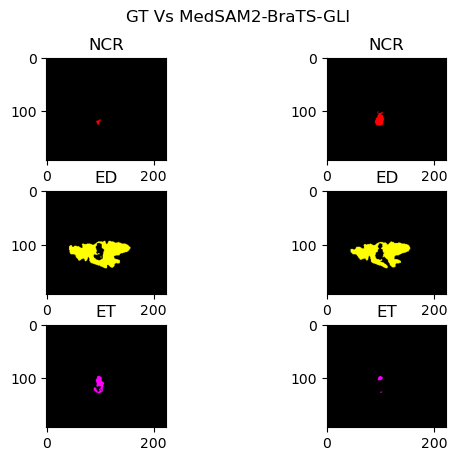

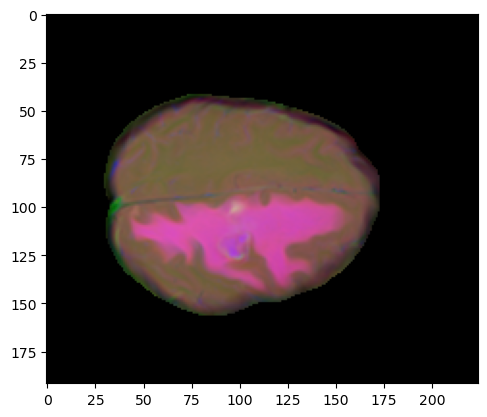

[[105.  41. 163. 122.]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


label.shape (3, 192, 224, 160)


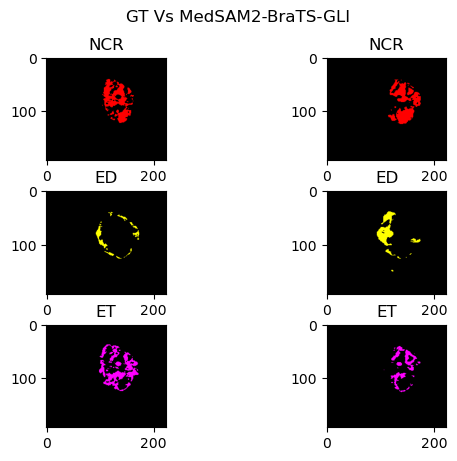

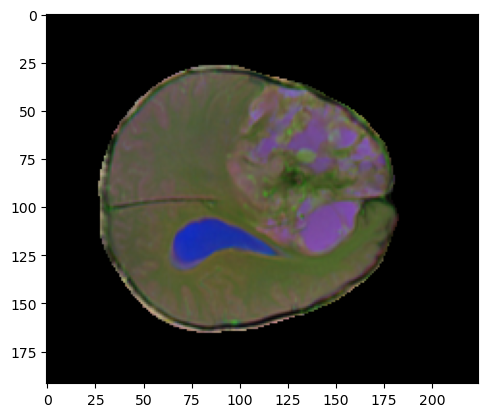

[[ 84.  63. 104.  95.]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..128.0].


label.shape (3, 192, 224, 160)


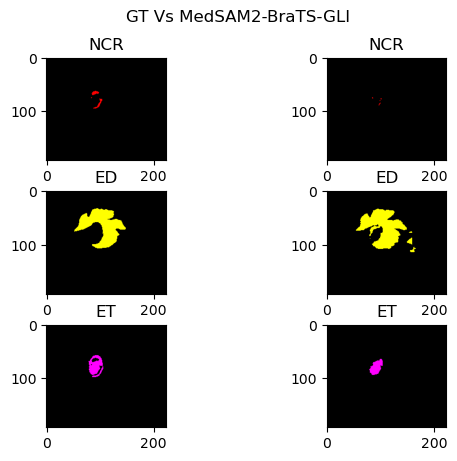

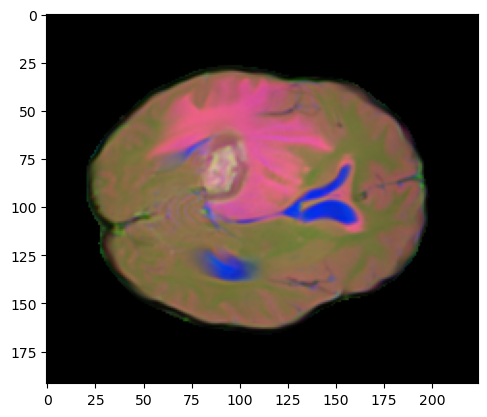

In [ ]:
SSA_video_path = "/scratch_net/ken/radjoe/BraTS_SSA/Test/images_UNN"
SSA_label_path = "/scratch_net/ken/radjoe/BraTS_SSA/Test/labels_UNN"
SSA_pred_path = "/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/results/F_A_SSA/boxes"
SSA_mid_dataset = MRIDataset(SSA_video_path, SSA_label_path, mid_in_a_ssa)
visualize(SSA_mid_dataset, SSA_pred_path, 'GT Vs MedSAM2-BraTS-GLI', SSA_video_path)

### Ploting Encoder Features

In [ ]:
pca_encoder_fit = np.load("/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/extracted_feats/vision_feats/BraTS-GLI-00118-000.npy", allow_pickle=True).squeeze(0)
pca_encoder_fit = pca_encoder_fit.reshape(-1, pca_encoder_fit.shape[0])
print(pca_encoder_fit.shape)

FileNotFoundError: [Errno 2] No such file or directory: '/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/extracted_feats/vision_feats/BraTS-GLI-00118-000.npy'

In [ ]:
print(pca_encoder_fit.shape)

(1024, 256)


In [ ]:

from sklearn.decomposition import PCA

pca_encoder = PCA(n_components=3, random_state=42).fit(pca_encoder_fit) 
pca_decoder = PCA(n_components=3, random_state=42)

NameError: name 'pca_encoder_fit' is not defined

In [ ]:
SSA_video_path = "/scratch_net/ken/radjoe/BraTS_SSA/Feature_extraction/images_UNN"
SSA_label_path = "/scratch_net/ken/radjoe/BraTS_SSA/Feature_extraction/labels_UNN"
dataset = MRIDataset(SSA_video_path, SSA_label_path)
pred_path = "/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/extracted_feats/vision_feats"
title = 'GT Vs MedSAM2-BraTS-GLI'
path_img = SSA_video_path


visualize_feats(dataset, pred_path, pca_encoder, title, path_img, pred_path2 = None )

NameError: name 'pca_encoder' is not defined

### Ploting Decoder Features

In [ ]:
observe = pd.read_csv("/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/results/Feat_extraction/boxes/SSA_boxes.csv")
df_observe = clean_df(observe, True, 'brats')
(df_observe.head(10))

,name,dice_NCR,dice_ED,dice_ET,hausdorff_NCR,hausdorff_ED,hausdorff_ET,recall_NCR,recall_ED,recall_ET,precision_NCR,precision_ED,precision_ET
0,BraTS-GLI-00008-000.npy,0.000000,0.786636,0.615012,5.477226,51.980766,66.952591,0.000000,0.949710,0.816720,0.000000,0.671357,0.493204
1,BraTS-GLI-00043-000.npy,0.568419,0.844765,0.479423,21.679483,6.164414,10.440307,0.989967,0.899269,0.330580,0.398661,0.796490,0.872071
2,BraTS-GLI-00095-001.npy,0.961787,0.893610,0.932466,2.236068,27.256157,1.414214,0.998970,0.976036,0.940488,0.927272,0.824022,0.924581
3,BraTS-GLI-00172-000.npy,0.837560,0.876693,0.843757,2.449490,4.289189,2.449490,0.943063,0.990316,0.927136,0.753288,0.786460,0.774138
4,BraTS-GLI-00259-000.npy,0.922818,0.875604,0.932538,2.449490,28.301943,1.000000,0.993851,0.993270,0.960016,0.861262,0.782863,0.906589
5,BraTS-GLI-00289-000.npy,0.501114,0.659612,0.828066,38.178520,20.814655,10.816654,0.933610,0.978986,0.867914,0.342466,0.497359,0.791717
6,BraTS-GLI-00336-000.npy,0.959188,0.890866,0.922058,1.000000,4.242640,1.000000,0.992207,0.996086,0.972623,0.928296,0.805752,0.876489
7,BraTS-GLI-00523-000.npy,0.200000,0.863510,0.695652,3.464102,5.744563,11.445523,0.111111,0.849134,0.637813,1.000000,0.878381,0.765027
8,BraTS-GLI-00548-001.npy,0.914358,0.910319,0.936776,1.732051,2.449490,1.414214,0.981562,0.993727,0.967423,0.855768,0.839829,0.908011
9,BraTS-GLI-00692-001.npy,0.880565,0.811831,0.890133,1.414214,61.554855,72.413742,0.970391,0.988697,0.968085,0.805959,0.688641,0.823799


In [5]:
(df_observe.tail(9))

NameError: name 'df_observe' is not defined

In [6]:
def to_numpy_mask(m):
    # torch -> numpy, squeeze channel if present
    if isinstance(m, torch.Tensor):
        m = m.detach().cpu().numpy()
    # drop singleton dims to get [H, W]
    if m.ndim == 3 and (m.shape[0] == 1 or m.shape[-1] == 1):
        m = np.squeeze(m)
    # ensure integer type for masks
    if not np.issubdtype(m.dtype, np.integer):
        m = m.astype(np.int32)
    return m

def to_numpy_image(x):
    # expects HWC for Albumentations
    if isinstance(x, torch.Tensor):
        x = x.detach().cpu().numpy()
    # if CHW -> HWC
    if x.ndim == 3 and x.shape[0] in (1,2,3,4):   # likely CHW
        x = np.transpose(x, (1, 2, 0))
    return x.astype(np.float32)

def visualize_feats(dataset, pred_path, pca_temp, title, path_img, pred_path2 = None ):
    colors = [
        [255, 0, 0],       
        [255, 255, 0],     
        [128, 0, 128],     
    ]
    # graph_num = len(pred_path)
    for i in range(len(dataset)):
        fig1, ax1 = plt.subplots(1, 3)
        fig2, ax2 = plt.subplots(1, 3)
        # print(len(ax))
        idx, img, label_name, box, points, frames, label = dataset[i]
        print(img)
        # b1 = preprocess_bbox(bbox=box[0])
        # # b2 = preprocess_bbox(bbox=box[1])
        # # b3 = preprocess_bbox(bbox=box[2])
        # b = [b1,b1, b1]
        
        read_path = os.path.join(pred_path, f'{img[:-8]}.npy')
        # print(read_path)
        pred = np.load(read_path).squeeze(0)
        pred_fit = pred.reshape(-1, pred.shape[0])

        print(f"pred.shape {pred_fit.shape}")


        # Reduce dimensions with PCA


        # pred = np.transpose(pred, (3,0,1,2))
        pred_label = os.path.join(pred_path2, f'{img[:-8]}.npy')
        pred_label = np.load(pred_label)[1:, :, :, frames]
        torch_pred_label = torch.from_numpy(pred_label)
        torch_pred_label = torch.nn.functional.interpolate(torch_pred_label.unsqueeze(0).float(), size=pred.shape[1:], mode='nearest').squeeze(0).long()
        pred_label = to_numpy_mask(torch_pred_label)
        pred_label_map = np.zeros((pred_label.shape[1], pred_label.shape[2]), dtype=np.uint8)
        for c in range(pred_label.shape[0]):
            pred_label_map[pred_label[c] > 0] = c + 1   # <-- +1 so class 0 channel becomes id 1 (not 0)
        print(f"pred_label.shape {pred_label.shape}")

        pred_keep = pred_label_map.flatten() != 0
        pred_lb = pred_label_map.flatten()[pred_keep]
        print(f"pred_keep:{pred_keep.shape}")
        label = np.array(label[1:, :, :, frames])
        torch_label = torch.from_numpy(label)
        torch_label = torch.nn.functional.interpolate(torch_label.unsqueeze(0).float(), size=pred.shape[1:], mode='nearest').squeeze(0).long()

        label = to_numpy_mask(torch_label)
        label_map = np.zeros((label.shape[1], label.shape[2]), dtype=np.uint8)
        for c in range(label.shape[0]):
            label_map[label[c] > 0] = c + 1   # <-- +1 so class 0 channel becomes id 1 (not 0)
        print(f"label.shape {label.shape}")
        print(f'label_map.shape {label_map.shape}')

        keep = label_map.flatten() != 0
        lb = label_map.flatten()[keep]
        print(f"Keep:{keep}")
        X = pred_fit[keep]
        Xp = pred_fit[pred_keep]

        mu = X.mean(axis=0, keepdims=True)
        sigma = X.std(axis=0, keepdims=True) + 1e-8
        Xz = (X - mu) / sigma
        Xn = Xz / (np.linalg.norm(Xz, axis=1, keepdims=True) + 1e-8)

        mu_p = Xp.mean(axis=0, keepdims=True)
        sigma_p = Xp.std(axis=0, keepdims=True) + 1e-8
        Xz_p = (Xp - mu_p) / sigma_p
        Xn_p = Xz_p / (np.linalg.norm(Xz_p, axis=1, keepdims=True) + 1e-8)
        Xn = pca_temp.transform(Xn)
        if len(Xn_p) > 0:
            Xn_p = pca_temp.transform(Xn_p)
        # Z2_tsne = TSNE(n_components=3, perplexity=50, learning_rate='auto', init='pca', n_iter=500, random_state=0).fit_transform(Xn)
        print(f"pred.shape {pred_fit.shape}")



        ax1[0].scatter(
            Xn[:, 0],
            Xn[:, 1],
            c=lb,
            cmap='viridis',
            alpha=0.8,
            s=12
        )
        ax1[0].set_title('t-SNE of Decoder Features (2D)')

        ax1[1].scatter(
            Xn[:, 0],
            Xn[:, 2],
            c=lb,
            cmap='viridis',
            alpha=0.8,
            s=12
        )
        ax1[1].set_title('t-SNE of Decoder Features (2D)')

        ax1[2].scatter(
            Xn[:, 1],
            Xn[:, 2],
            c=lb,
            cmap='viridis',
            alpha=0.8,
            s=12
        )
        ax1[2].set_title('t-SNE of Decoder Features (2D)')

        if len(Xn_p) > 0:
            ax2[0].scatter(
                Xn_p[:, 0],
                Xn_p[:, 1],
                c=pred_lb,
                cmap='viridis',
                alpha=0.8,
                s=12
            )
            ax2[0].set_title('PCA of Decoder Features (3D)')
            ax2[0].set_xlabel('PCA Component 1')
            ax2[0].set_ylabel('PCA Component 2')

            ax2[1].scatter(
                Xn_p[:, 0],
                Xn_p[:, 2],
                c=pred_lb,
                cmap='viridis',
                alpha=0.8,
                s=12
            )
            ax2[1].set_title('PCA of Decoder Features (3D)')
            ax2[1].set_xlabel('PCA Component 1')
            ax2[1].set_ylabel('PCA Component 2')


            ax2[2].scatter(
                Xn_p[:, 1],
                Xn_p[:, 2],
                c=pred_lb,
                cmap='viridis',
                alpha=0.8,
                s=12
            )
            ax2[2].set_title('PCA of Decoder Features (3D)')
            ax2[2].set_xlabel('PCA Component 1')
            ax2[2].set_ylabel('PCA Component 2')

            plt.tight_layout()
            plt.show()


In [7]:
def to_numpy_mask(m):
    # torch -> numpy, squeeze channel if present
    if isinstance(m, torch.Tensor):
        m = m.detach().cpu().numpy()
    # drop singleton dims to get [H, W]
    if m.ndim == 3 and (m.shape[0] == 1 or m.shape[-1] == 1):
        m = np.squeeze(m)
    # ensure integer type for masks
    if not np.issubdtype(m.dtype, np.integer):
        m = m.astype(np.int32)
    return m

def to_numpy_image(x):
    # expects HWC for Albumentations
    if isinstance(x, torch.Tensor):
        x = x.detach().cpu().numpy()
    # if CHW -> HWC
    if x.ndim == 3 and x.shape[0] in (1,2,3,4):   # likely CHW
        x = np.transpose(x, (1, 2, 0))
    return x.astype(np.float32)

import os
import numpy as np
import torch
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

def to_numpy_mask(m):
    if isinstance(m, torch.Tensor):
        m = m.detach().cpu().numpy()
    if m.ndim == 3 and (m.shape[0] == 1 or m.shape[-1] == 1):
        m = np.squeeze(m)
    if not np.issubdtype(m.dtype, np.integer):
        m = m.astype(np.int32)
    return m

def visualize_feats_singlemap(
    dataset,
    pred_path,
    pca_temp,                 # pre-fitted PCA (n_components >= 2). We'll use the first 2 dims.
    title="Decoder feature PCA: GT vs Pred",
    pred_path2=None,
    max_points=20000,         # downsample total points for speed/clarity
    class_names=None,
    rng_seed=0,
):
    """
    For each sample in `dataset`, loads decoder features and GT/Pred masks,
    normalizes features using GT stats, projects with `pca_temp`, and plots
    a single 2D scatter where:
      - color = class (discrete),
      - marker = source (circle=GT, square=Pred).
    """
    assert pred_path2 is not None, "pred_path2 is required for predicted label maps."

    rng = np.random.default_rng(rng_seed)

    # Collect all projected points + labels across the dataset
    Z_all = []
    y_cls_all = []
    y_src_all = []   # 0 = GT, 1 = Pred

    for i in range(len(dataset)):
        fig = None  # we only create one figure at the end; no per-sample plots

        # Unpack dataset item
        idx, img, label_name, box, points, frames, label = dataset[i]

        # ---- load per-pixel features: pred: [C_feat, H, W] -> (H*W, C_feat)
        read_path = os.path.join(pred_path, f"{img[:-8]}.npy")
        pred = np.load(read_path).squeeze(0)                     # [C_feat, H, W]
        pred_fit = pred.reshape(pred.shape[0], -1).T             # (H*W, C_feat)

        # ---- build Pred label map (collapse one-hot channels to id 1..K, 0=bg)
        pred_label_path = os.path.join(pred_path2, f"{img[:-8]}.npy")
        pred_label = np.load(pred_label_path)[1:, :, :, frames]  # drop bg channel
        torch_pred_label = torch.from_numpy(pred_label)
        torch_pred_label = torch.nn.functional.interpolate(
            torch_pred_label.unsqueeze(0).float(),
            size=pred.shape[1:],
            mode='nearest'
        ).squeeze(0).long()
        pred_label = to_numpy_mask(torch_pred_label)             # [K, H, W]
        pred_label_map = np.zeros((pred_label.shape[1], pred_label.shape[2]), dtype=np.uint8)
        for c in range(pred_label.shape[0]):
            pred_label_map[pred_label[c] > 0] = c + 1
        pred_flat = pred_label_map.flatten()
        pred_keep = pred_flat != 0
        pred_lb = pred_flat[pred_keep]                           # (N_pred_kept,)

        # ---- build GT label map (same collapse)
        gt = np.array(label[1:, :, :, frames])                   # drop bg
        torch_gt = torch.from_numpy(gt)
        torch_gt = torch.nn.functional.interpolate(
            torch_gt.unsqueeze(0).float(),
            size=pred.shape[1:],
            mode='nearest'
        ).squeeze(0).long()
        gt = to_numpy_mask(torch_gt)                             # [K, H, W]
        gt_label_map = np.zeros((gt.shape[1], gt.shape[2]), dtype=np.uint8)
        for c in range(gt.shape[0]):
            gt_label_map[gt[c] > 0] = c + 1
        gt_flat = gt_label_map.flatten()
        gt_keep = gt_flat != 0
        gt_lb = gt_flat[gt_keep]                                 # (N_gt_kept,)

        # ---- select corresponding features
        X_gt = pred_fit[gt_keep]                                 # (N_gt_kept, C_feat)
        X_pr = pred_fit[pred_keep]                               # (N_pred_kept, C_feat)

        # ---- normalize BOTH using GT stats only (comparable space)
        if X_gt.shape[0] == 0:
            continue
        mu = X_gt.mean(axis=0, keepdims=True)
        sigma = X_gt.std(axis=0, keepdims=True) + 1e-8

        X_gt_z = (X_gt - mu) / sigma
        X_pr_z = (X_pr - mu) / sigma

        # optional per-row L2 norm (can help PCA stability); keep it since your code had it
        X_gt_n = X_gt_z / (np.linalg.norm(X_gt_z, axis=1, keepdims=True) + 1e-8)
        X_pr_n = X_pr_z / (np.linalg.norm(X_pr_z, axis=1, keepdims=True) + 1e-8)

        # ---- project with given PCA (use first 2 components)
        Z_gt = pca_temp.transform(X_gt_n)[:, :2]
        Z_pr = pca_temp.transform(X_pr_n)[:, :2]

        # ---- append
        Z_all.append(Z_gt)
        y_cls_all.append(gt_lb)
        y_src_all.append(np.zeros_like(gt_lb, dtype=np.uint8))   # 0=GT

        if Z_pr.shape[0] > 0:
            Z_all.append(Z_pr)
            y_cls_all.append(pred_lb)
            y_src_all.append(np.ones_like(pred_lb, dtype=np.uint8))  # 1=Pred

    # ---- concatenate across dataset
    if len(Z_all) == 0:
        print("No points to plot (no labeled pixels?).")
        return
    Z_all = np.concatenate(Z_all, axis=0)        # (N_points, 2)
    y_cls_all = np.concatenate(y_cls_all, axis=0)
    y_src_all = np.concatenate(y_src_all, axis=0)

    # ---- optional downsampling (stratified by source to keep balance)
    total = Z_all.shape[0]
    if max_points is not None and total > max_points:
        # stratify by source (GT/Pred)
        idxs = []
        for src_val in (0, 1):
            src_idx = np.where(y_src_all == src_val)[0]
            k = int(max_points * (len(src_idx) / total))
            if k > 0:
                idxs.append(rng.choice(src_idx, size=k, replace=False))
        idxs = np.concatenate(idxs) if len(idxs) else np.arange(total)
        Z_all = Z_all[idxs]
        y_cls_all = y_cls_all[idxs]
        y_src_all = y_src_all[idxs]

    # ---- build plot on ONE map
    C = int(y_cls_all.max()) + 1
    cmap = plt.cm.get_cmap('tab10', max(C, 3))  # discrete

    fig, ax = plt.subplots(figsize=(8, 7))

    # plot GT and Pred separately to get different markers
    for src_val, marker, src_name in [(0, 'o', 'GT'), (1, 's', 'Pred')]:
        mask = (y_src_all == src_val)
        if not np.any(mask): 
            continue
        # color by class
        colors = [cmap(int(c)) for c in y_cls_all[mask]]
        ax.scatter(
            Z_all[mask, 0], Z_all[mask, 1],
            s=8, alpha=0.7, marker=marker, c=colors,
            linewidths=0
        )

    # ---- legends (classes + sources)
    class_handles = []
    for c in range(1, C):  # classes start from 1 in your maps
        name = class_names[c] if (class_names and c < len(class_names)) else f"class {c}"
        class_handles.append(Patch(color=cmap(c), label=name))
    source_handles = [
        Line2D([0],[0], marker='o', color='w', label='GT', markerfacecolor='k', markersize=6),
        Line2D([0],[0], marker='s', color='w', label='Pred', markerfacecolor='k', markersize=6),
    ]
    leg1 = ax.legend(handles=class_handles, title="Classes", frameon=False, loc='upper right')
    ax.add_artist(leg1)
    ax.legend(handles=source_handles, title="Source", frameon=False, loc='lower right')

    ax.set_title(title)
    ax.set_xlabel("PC1"); ax.set_ylabel("PC2")
    ax.set_aspect('equal', 'box')
    plt.tight_layout()
    plt.show()


In [8]:
sam2_output = np.load("/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/extracted_feats/conditioned_feats/BraTS-GLI-00095-001.npy")
sam2_output.shape

(1, 4, 256)

In [9]:
def merge_feats(path, pattern_suffix=".npy"):
    files = sorted([f for f in os.listdir(path) if f.endswith(pattern_suffix)])
    if not files:
        raise ValueError(f"No {pattern_suffix} files found in {path}")

    arrays = []
    ref_shape = None
    for f in files:
        a = np.load(os.path.join(path, f))
        a = a.squeeze(0)
        if ref_shape is None:
            ref_shape = a.shape
        elif a.shape != ref_shape:
            raise ValueError(f"Shape mismatch: {f} has {a.shape}, expected {ref_shape}")
        arrays.append(a)

    return np.stack(arrays, axis=0) , files

In [77]:
path = '/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/extracted_feats/conditioned_feats'
output_feats, file_names = merge_feats(path)
output_feats.shape

(20, 4, 256)

[0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0
 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1
 2 3 0 1 2 3]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1]
(80,)


/tmp/ipykernel_20717/476907624.py:31: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', C)


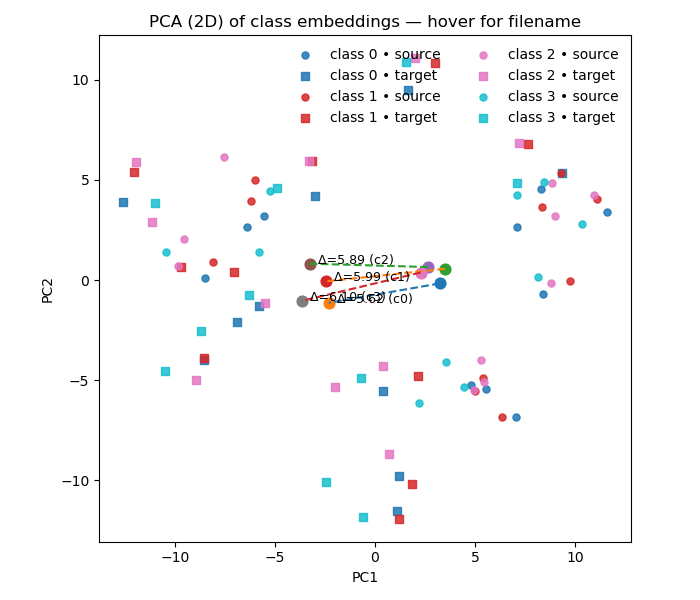

In [78]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import mplcursors

# feats: (20, 4, 256)
N, C, D = output_feats.shape
domain = np.array([0]*10 + [1]*10)   # 0=source (first 10), 1=target (last 10)

# --- flatten samples × classes ---
X = output_feats.reshape(-1, D)             # (N*C, 256)
y_class = np.tile(np.arange(C), N)      # cycle classes fastest
print(y_class)
y_dom   = np.repeat(domain, C)     # domain per row
print(y_dom)
# --- standardize globally (fit on source only to avoid leakage) ---
src_rows = (y_dom == 0)
scaler = StandardScaler().fit(X)
Xz = scaler.transform(X)

# --- PCA to 2D (fit on source only), then transform all ---
pca = PCA(n_components=2, random_state=0).fit(Xz)
Z = pca.transform(Xz)                 # (N*C, 2)

# --- reshape back to (N, 4, 2) ---
feats_pca = Z.reshape(N, C, 2)

# ---------- Plot: color=class, marker=domain ----------
cmap = plt.cm.get_cmap('tab10', C)
markers = {0:'o', 1:'s'}
labels_dom = {0:'source', 1:'target'}


if len(file_names) == N:
    labels_all = np.repeat(np.array(file_names), C)
elif len(file_names) == N * C:
    labels_all = np.array(file_names)
else:
    raise ValueError(f"'file_names' must be length N ({N}) or N*C ({N*C}), got {len(file_names)}")


print(labels_all.shape)
fig, ax = plt.subplots(figsize=(7,6))

scatters = []              # store PathCollections for points
indices_per_scatter = []   # store the global indices in Z for each artist

for c in range(C):
    for d in (0, 1):
        idx = (y_class == c) & (y_dom == d)
        if idx.any():
            sc_pts = ax.scatter(Z[idx, 0], Z[idx, 1], s=26, alpha=0.85,
                                c=[cmap(c)], marker=markers[d],
                                label=f'class {c} • {labels_dom[d]}')
            scatters.append(sc_pts)
            indices_per_scatter.append(np.flatnonzero(idx))

# centroid arrows: source -> target per class (keep these, but don't attach cursor to them)
for c in range(C):
    src_idx = (y_class==c) & (y_dom==0)
    tgt_idx = (y_class==c) & (y_dom==1)
    if src_idx.any() and tgt_idx.any():
        mu_s = Z[src_idx].mean(axis=0)
        mu_t = Z[tgt_idx].mean(axis=0)
        ax.plot([mu_s[0], mu_t[0]], [mu_s[1], mu_t[1]], linestyle='--')
        ax.scatter(*mu_s, s=60)
        ax.scatter(*mu_t, s=60)
        ax.text(mu_t[0], mu_t[1], f'  Δ={np.linalg.norm(mu_t-mu_s):.2f} (c{c})', fontsize=9)

# --- Hover tooltips on only the point scatters ---
cursor = mplcursors.cursor(
    scatters,
    hover=True,
    annotation_kwargs=dict(arrowprops=None)  # <- no arrow
)

@cursor.connect("add")
def on_add(sel):
    k = scatters.index(sel.artist)
    i_global = indices_per_scatter[k][sel.index]
    print(i_global)
    sel.annotation.set_text(
        f"{labels_all[i_global]}\n"
        f"class {int(y_class[i_global])} • "
        f"{'source' if y_dom[i_global]==0 else 'target'}"
    )
        # If running older Matplotlib where bbox may be missing, set it defensively:
    if sel.annotation.get_bbox_patch() is None:
        sel.annotation.set_bbox(dict(boxstyle="round", fc="w", ec="0.5", alpha=0.9))
    # sel.annotation.get_bbox_patch().set(alpha=0.9)


ax.set_aspect('equal', 'box')
h, l = ax.get_legend_handles_labels()
uniq = dict(zip(l, h))
ax.legend(uniq.values(), uniq.keys(), frameon=False, ncol=2)
ax.set_title('PCA (2D) of class embeddings — hover for filename')
ax.set_xlabel('PC1'); ax.set_ylabel('PC2')
plt.tight_layout(); plt.show()

In [17]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

def to_numpy_mask(m):
    if isinstance(m, torch.Tensor):
        m = m.detach().cpu().numpy()
    if m.ndim == 3 and (m.shape[0] == 1 or m.shape[-1] == 1):
        m = np.squeeze(m)
    if not np.issubdtype(m.dtype, np.integer):
        m = m.astype(np.int32)
    return m

def visualize_feats_singlemap(
    dataset,
    pred_path,
    pca_temp,                 # pre-fitted PCA (n_components >= 2). We'll use the first 2 dims.
    title="Decoder feature PCA: GT vs Pred",
    max_points=20000,         # downsample total points for speed/clarity
    class_names=None,
    rng_seed=0,
):
    """
    For each sample in `dataset`, loads decoder features and GT/Pred masks,
    normalizes features using GT stats, projects with `pca_temp`, and plots
    a single 2D scatter where:
      - color = class (discrete),
      - marker = source (circle=GT, square=Pred).
    """
    # assert pred_path2 is not None, "pred_path2 is required for predicted label maps."

    rng = np.random.default_rng(rng_seed)

    # Collect all projected points + labels across the dataset
    Z_all = []
    y_cls_all = []
    y_src_all = []   # 0 = GT, 1 = Pred

    for i in range(len(dataset)):
        fig = None  # we only create one figure at the end; no per-sample plots

        # Unpack dataset item
        idx, img, label_name, box, points, frames, label = dataset[i]

        # ---- load per-pixel features: pred: [C_feat, H, W] -> (H*W, C_feat)
        read_path = os.path.join(pred_path, f"{img[:-8]}.npy")
        pred = np.load(read_path).squeeze(0)                     # [C_feat, H, W]
        pred_fit = pred.reshape(pred.shape[0], -1).T             # (H*W, C_feat)

        # ---- build Pred label map (collapse one-hot channels to id 1..K, 0=bg)
        # pred_label_path = os.path.join(pred_path2, f"{img[:-8]}.npy")
        # pred_label = np.load(pred_label_path)[1:, :, :, frames]  # drop bg channel
        # torch_pred_label = torch.from_numpy(pred_label)
        # torch_pred_label = torch.nn.functional.interpolate(
        #     torch_pred_label.unsqueeze(0).float(),
        #     size=pred.shape[1:],
        #     mode='nearest'
        # ).squeeze(0).long()
        # pred_label = to_numpy_mask(torch_pred_label)             # [K, H, W]
        # pred_label_map = np.zeros((pred_label.shape[1], pred_label.shape[2]), dtype=np.uint8)
        # for c in range(pred_label.shape[0]):
        #     pred_label_map[pred_label[c] > 0] = c + 1
        # pred_flat = pred_label_map.flatten()
        # pred_keep = pred_flat != 0
        # pred_lb = pred_flat[pred_keep]                           # (N_pred_kept,)

        # ---- build GT label map (same collapse)
        gt = np.array(label[1:, :, :, frames])                   # drop bg
        torch_gt = torch.from_numpy(gt)
        torch_gt = torch.nn.functional.interpolate(
            torch_gt.unsqueeze(0).float(),
            size=pred.shape[1:],
            mode='nearest'
        ).squeeze(0).long()
        gt = to_numpy_mask(torch_gt)                             # [K, H, W]
        gt_label_map = np.zeros((gt.shape[1], gt.shape[2]), dtype=np.uint8)
        for c in range(gt.shape[0]):
            gt_label_map[gt[c] > 0] = c + 1
        gt_flat = gt_label_map.flatten()
        gt_keep = gt_flat != 0
        gt_lb = gt_flat[gt_keep]                                 # (N_gt_kept,)

        # ---- select corresponding features
        X_gt = pred_fit[gt_keep]                                 # (N_gt_kept, C_feat)
        # X_pr = pred_fit[pred_keep]                               # (N_pred_kept, C_feat)

        # ---- normalize BOTH using GT stats only (comparable space)
        if X_gt.shape[0] == 0:
            continue
        mu = X_gt.mean(axis=0, keepdims=True)
        sigma = X_gt.std(axis=0, keepdims=True) + 1e-8

        X_gt_z = (X_gt - mu) / sigma
        # X_pr_z = (X_pr - mu) / sigma

        # optional per-row L2 norm (can help PCA stability); keep it since your code had it
        X_gt_n = X_gt_z / (np.linalg.norm(X_gt_z, axis=1, keepdims=True) + 1e-8)
        # X_pr_n = X_pr_z / (np.linalg.norm(X_pr_z, axis=1, keepdims=True) + 1e-8)

        # ---- project with given PCA (use first 2 components)
        Z_gt = pca_temp.transform(X_gt_n)[:, :2]
        # Z_pr = pca_temp.transform(X_pr_n)[:, :2]

        # ---- append
        Z_all.append(Z_gt)
        y_cls_all.append(gt_lb)
        y_src_all.append(np.zeros_like(gt_lb, dtype=np.uint8))   # 0=GT

        # if Z_pr.shape[0] > 0:
        #     Z_all.append(Z_pr)
        #     y_cls_all.append(pred_lb)
        #     y_src_all.append(np.ones_like(pred_lb, dtype=np.uint8))  # 1=Pred

    # ---- concatenate across dataset
    if len(Z_all) == 0:
        print("No points to plot (no labeled pixels?).")
        return
    Z_all = np.concatenate(Z_all, axis=0)        # (N_points, 2)
    y_cls_all = np.concatenate(y_cls_all, axis=0)
    y_src_all = np.concatenate(y_src_all, axis=0)

    # ---- optional downsampling (stratified by source to keep balance)
    total = Z_all.shape[0]
    if max_points is not None and total > max_points:
        # stratify by source (GT/Pred)
        idxs = []
        for src_val in (0, 1):
            src_idx = np.where(y_src_all == src_val)[0]
            k = int(max_points * (len(src_idx) / total))
            if k > 0:
                idxs.append(rng.choice(src_idx, size=k, replace=False))
        idxs = np.concatenate(idxs) if len(idxs) else np.arange(total)
        Z_all = Z_all[idxs]
        y_cls_all = y_cls_all[idxs]
        y_src_all = y_src_all[idxs]

    # ---- build plot on ONE map
    C = int(y_cls_all.max()) + 1
    cmap = plt.cm.get_cmap('tab10', max(C, 3))  # discrete

    fig, ax = plt.subplots(figsize=(8, 7))

    # plot GT and Pred separately to get different markers
    dom_colors = {0: "#1f77b4", 1: "#ff7f0e"}  # 0=GT blue, 1=Pred orange

    for src_val, marker, src_name in [(0, 'o', 'GT'), (1, 's', 'Pred')]:
        mask = (y_src_all == src_val)
        if not np.any(mask):
            continue
        ax.scatter(
            Z_all[mask, 0], Z_all[mask, 1],
            s=8, alpha=0.7, marker=marker,
            c=dom_colors[src_val],   # <-- color by source
            linewidths=0)

    # ---- legends (classes + sources)
    class_handles = []
    for c in range(1, C):  # classes start from 1 in your maps
        name = class_names[c] if (class_names and c < len(class_names)) else f"class {c}"
        class_handles.append(Patch(color=cmap(c), label=name))
    source_handles = [
        Line2D([0],[0], marker='o', color='w', label='GT', markerfacecolor='k', markersize=6),
        Line2D([0],[0], marker='s', color='w', label='Pred', markerfacecolor='k', markersize=6),
    ]
    leg1 = ax.legend(handles=class_handles, title="Classes", frameon=False, loc='upper right')
    ax.add_artist(leg1)
    ax.legend(handles=source_handles, title="Source", frameon=False, loc='lower right')

    ax.set_title(title)
    ax.set_xlabel("PC1"); ax.set_ylabel("PC2")
    ax.set_aspect('equal', 'box')
    plt.tight_layout()
    plt.show()


In [156]:
src_fit1, src_files = merge_feats('/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/extracted_feats/decoder_feats')

In [157]:
src_fit = src_fit1.reshape(-1, 32)
src_fit.shape

(327680, 32)

[0.8911154  0.03497579 0.02905654]


/tmp/ipykernel_27426/3648459974.py:142: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', max(C, 3))  # discrete


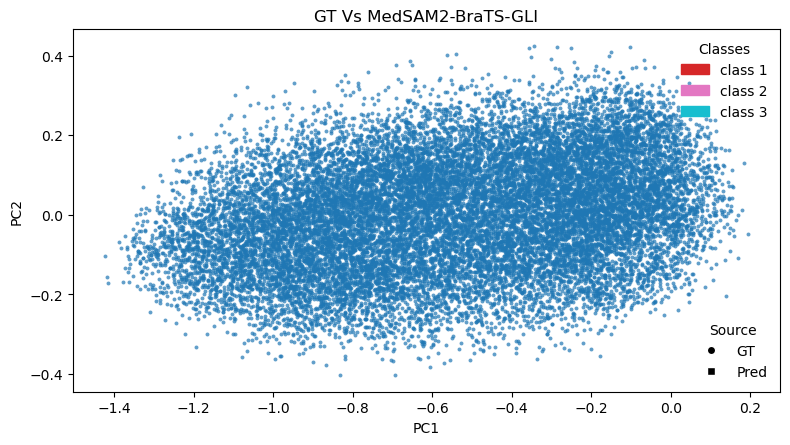

In [159]:

# pca_decoder_fit = np.load("/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/extracted_feats/decoder_feats/BraTS-GLI-00336-000.npy", allow_pickle=True).squeeze(0)
# pca_decoder_fit = pca_decoder_fit.reshape(-1, pca_decoder_fit.shape[0])
# print(pca_decoder_fit.shape)

pca_decoder = PCA(n_components=3, random_state=42).fit(src_fit)
print(pca_decoder.explained_variance_ratio_)
SSA_video_path = "/scratch_net/ken/radjoe/BraTS_SSA/Feature_extraction/images_UNN"
SSA_label_path = "/scratch_net/ken/radjoe/BraTS_SSA/Feature_extraction/labels_UNN"
dataset = MRIDataset(SSA_video_path, SSA_label_path)
pred_path = "/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/extracted_feats/decoder_feats"
title = 'GT Vs MedSAM2-BraTS-GLI'
path_img = SSA_video_path
pred_path2 = "/scratch-second/FYP/Validation/labels_UNN"

visualize_feats_singlemap(dataset, pred_path, pca_decoder, title)


(1024, 256)
[0.6006665  0.05528453 0.04375348]
BraTS-GLI-00008-000-stk.npy
[[ 78. 151.  80. 152.]]
pred.shape (1024, 256)
pred_label.shape (3, 32, 32)
pred_keep:(1024,)
label.shape (3, 32, 32)
label_map.shape (32, 32)
Keep:[False False False ... False False False]
pred.shape (1024, 256)


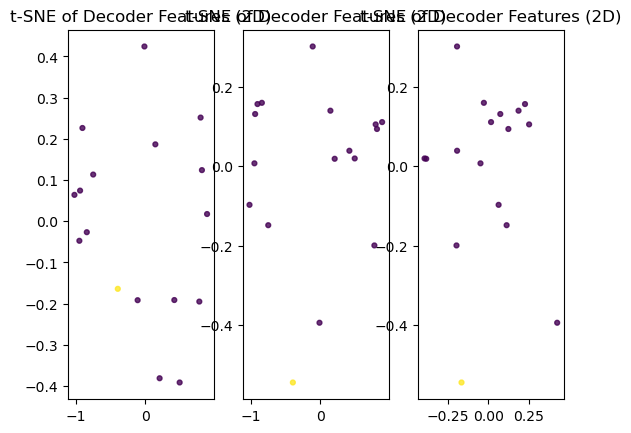

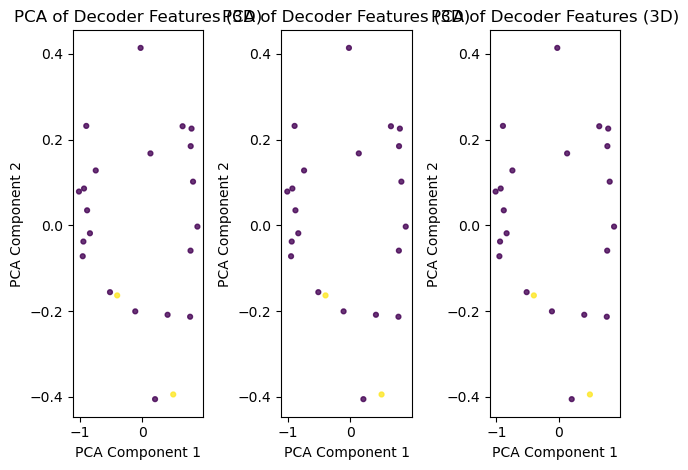

BraTS-GLI-00043-000-stk.npy
[[108.  43. 131.  60.]]
pred.shape (1024, 256)
pred_label.shape (3, 32, 32)
pred_keep:(1024,)
label.shape (3, 32, 32)
label_map.shape (32, 32)
Keep:[False False False ... False False False]
pred.shape (1024, 256)


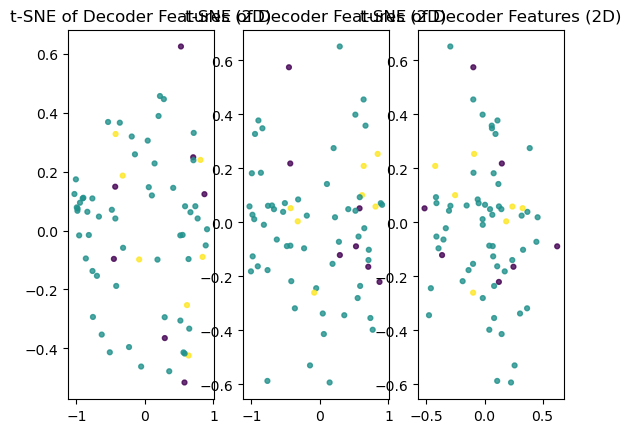

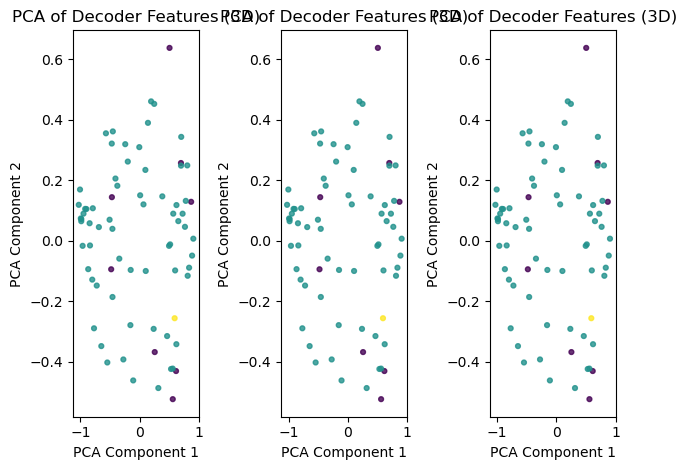

BraTS-GLI-00095-001-stk.npy
[[113.  89. 172. 142.]]
pred.shape (1024, 256)
pred_label.shape (3, 32, 32)
pred_keep:(1024,)
label.shape (3, 32, 32)
label_map.shape (32, 32)
Keep:[False False False ... False False False]
pred.shape (1024, 256)


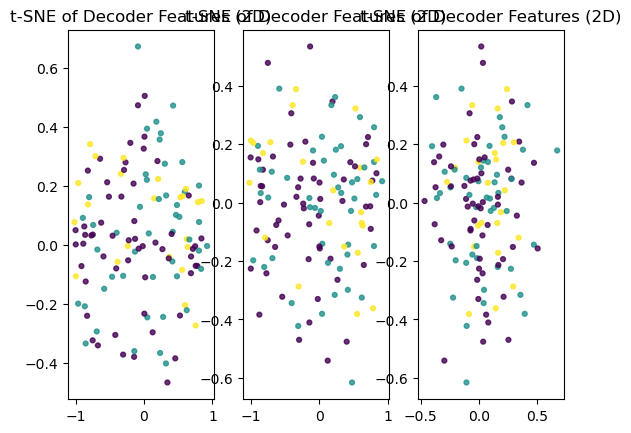

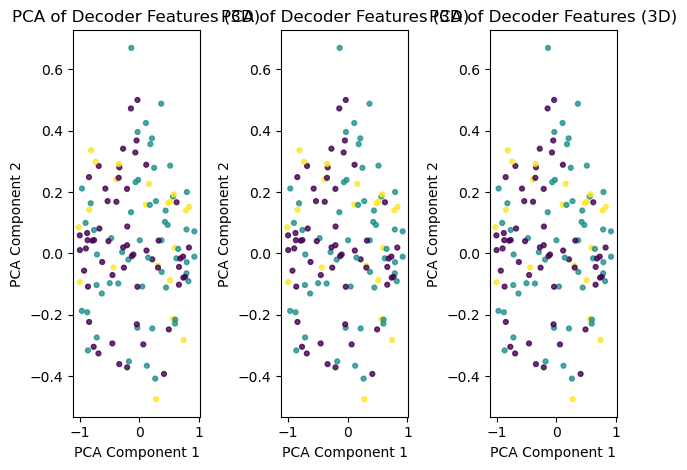

BraTS-GLI-00172-000-stk.npy
[[ 62.  33. 110.  59.]]
pred.shape (1024, 256)
pred_label.shape (3, 32, 32)
pred_keep:(1024,)
label.shape (3, 32, 32)
label_map.shape (32, 32)
Keep:[False False False ... False False False]
pred.shape (1024, 256)


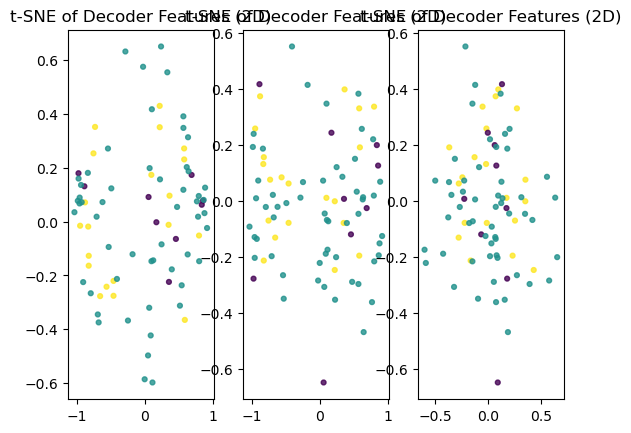

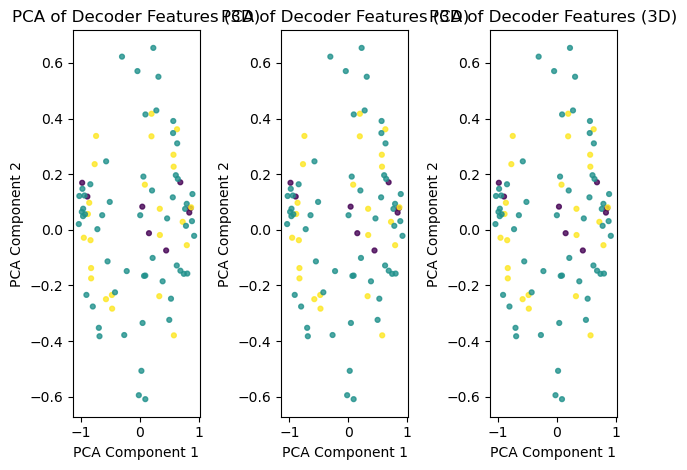

BraTS-GLI-00259-000-stk.npy
[[43. 69. 69. 90.]]
pred.shape (1024, 256)
pred_label.shape (3, 32, 32)
pred_keep:(1024,)
label.shape (3, 32, 32)
label_map.shape (32, 32)
Keep:[False False False ... False False False]
pred.shape (1024, 256)


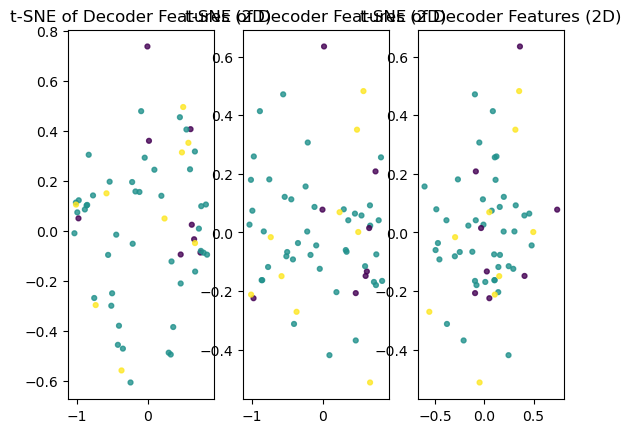

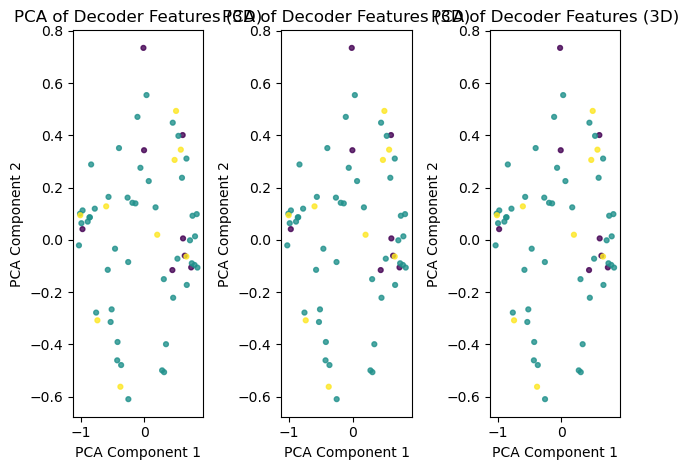

BraTS-GLI-00289-000-stk.npy
[[86. 63. 87. 65.]]
pred.shape (1024, 256)
pred_label.shape (3, 32, 32)
pred_keep:(1024,)
label.shape (3, 32, 32)
label_map.shape (32, 32)
Keep:[False False False ... False False False]
pred.shape (1024, 256)


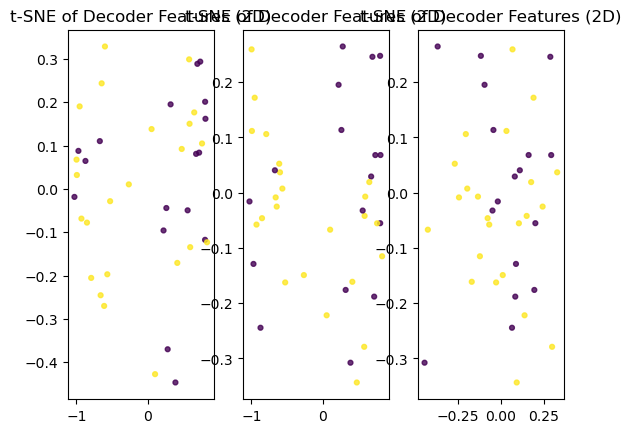

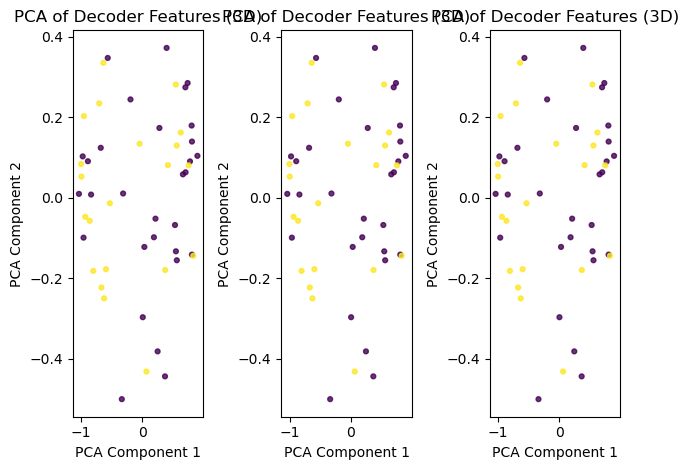

BraTS-GLI-00336-000-stk.npy
[[144.  56. 176.  81.]]
pred.shape (1024, 256)
pred_label.shape (3, 32, 32)
pred_keep:(1024,)
label.shape (3, 32, 32)
label_map.shape (32, 32)
Keep:[False False False ... False False False]
pred.shape (1024, 256)


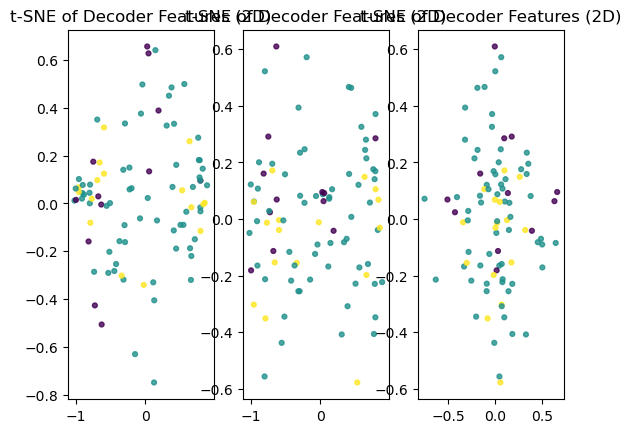

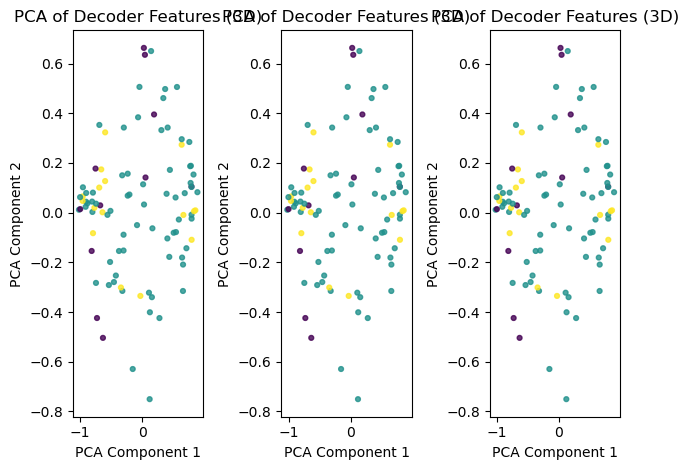

BraTS-GLI-00523-000-stk.npy
[[ 91. 126.  92. 129.]]
pred.shape (1024, 256)
pred_label.shape (3, 32, 32)
pred_keep:(1024,)
label.shape (3, 32, 32)
label_map.shape (32, 32)
Keep:[False False False ... False False False]
pred.shape (1024, 256)


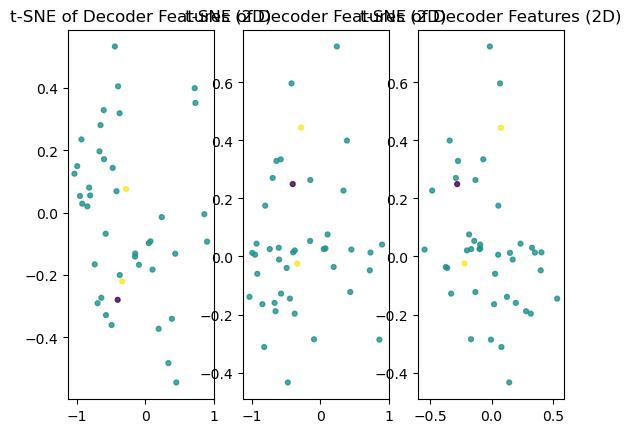

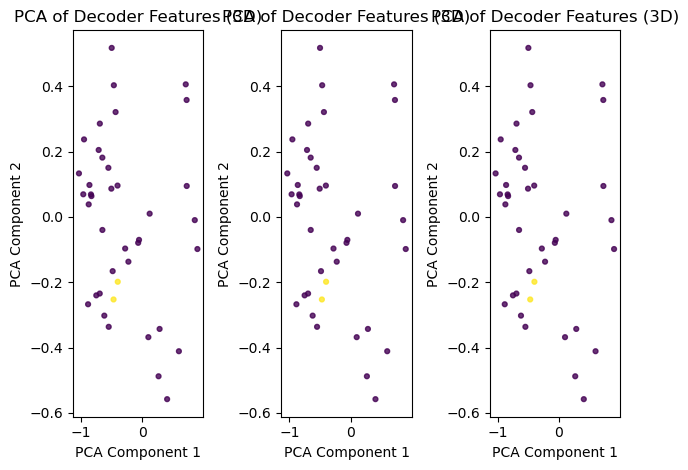

BraTS-GLI-00548-001-stk.npy
[[103. 117. 127. 143.]]
pred.shape (1024, 256)
pred_label.shape (3, 32, 32)
pred_keep:(1024,)
label.shape (3, 32, 32)
label_map.shape (32, 32)
Keep:[False False False ... False False False]
pred.shape (1024, 256)


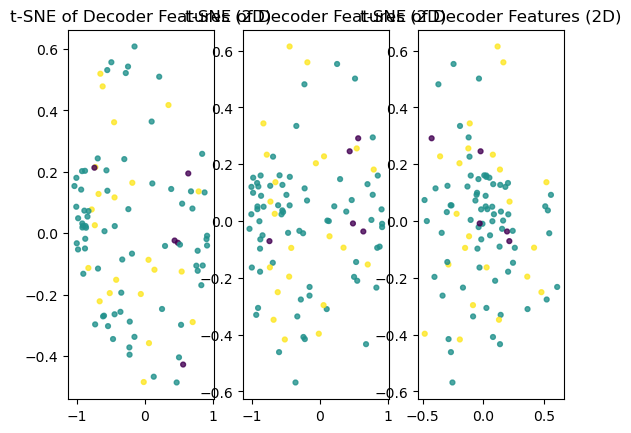

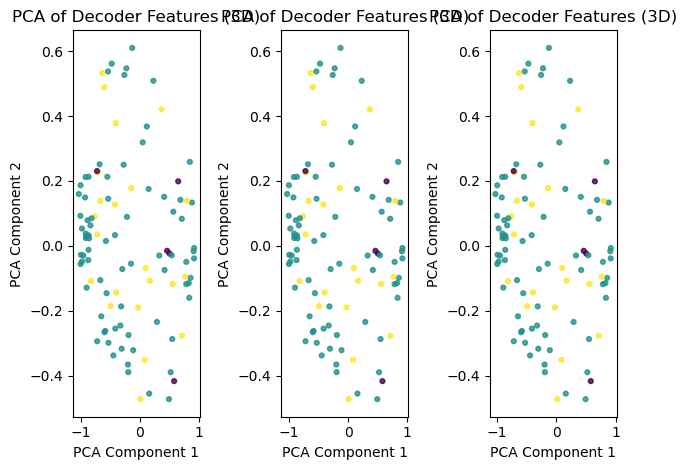

BraTS-GLI-00692-001-stk.npy
[[ 74. 108. 108. 120.]]
pred.shape (1024, 256)
pred_label.shape (3, 32, 32)
pred_keep:(1024,)
label.shape (3, 32, 32)
label_map.shape (32, 32)
Keep:[False False False ... False False False]
pred.shape (1024, 256)


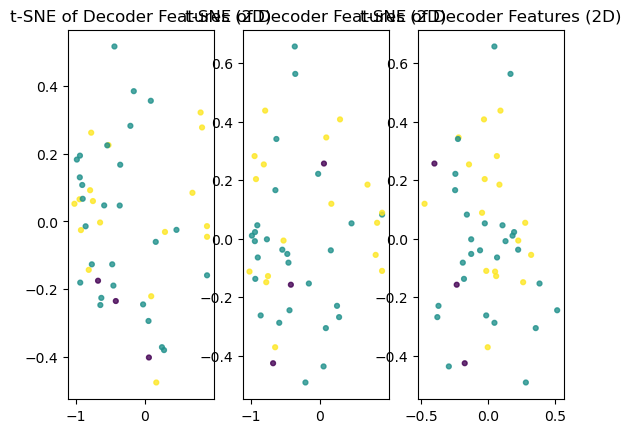

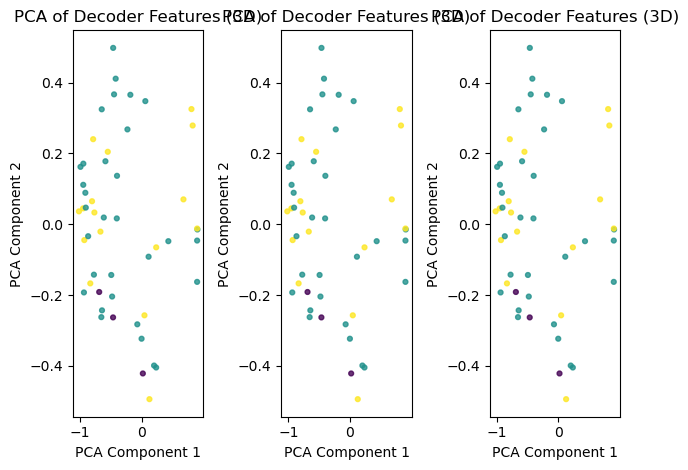

BraTS-SSA-00002-000-stk.npy
[[ 94. 116. 101. 125.]]
pred.shape (1024, 256)
pred_label.shape (3, 32, 32)
pred_keep:(1024,)
label.shape (3, 32, 32)
label_map.shape (32, 32)
Keep:[False False False ... False False False]
pred.shape (1024, 256)


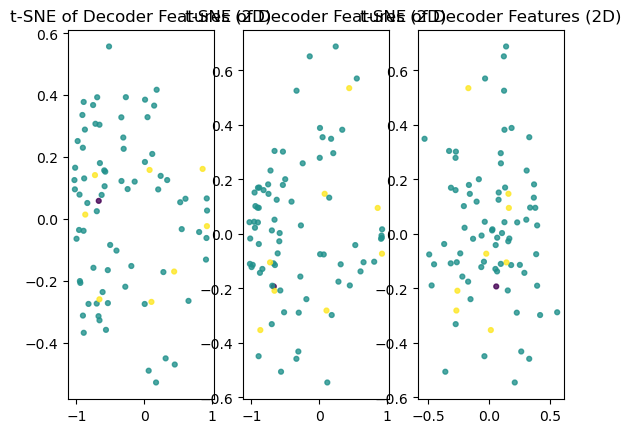

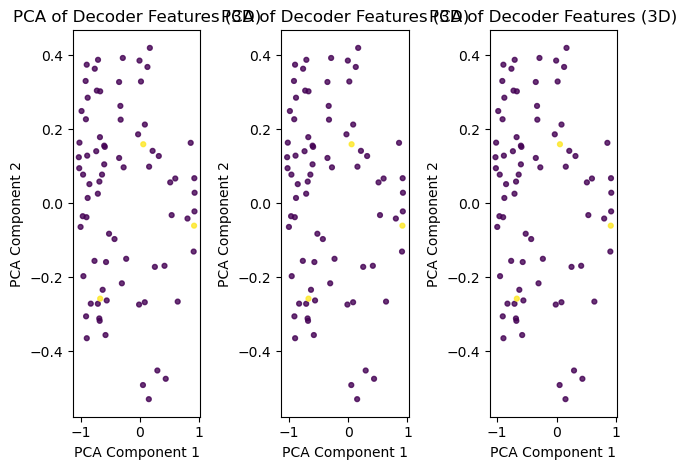

BraTS-SSA-00012-000-stk.npy
[[ 88. 114. 120. 138.]]
pred.shape (1024, 256)
pred_label.shape (3, 32, 32)
pred_keep:(1024,)
label.shape (3, 32, 32)
label_map.shape (32, 32)
Keep:[False False False ... False False False]
pred.shape (1024, 256)


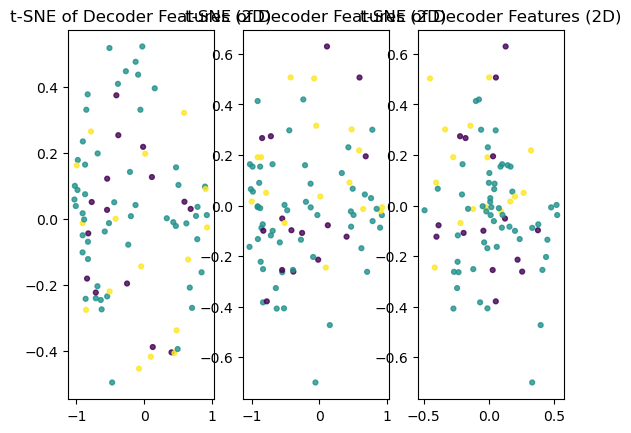

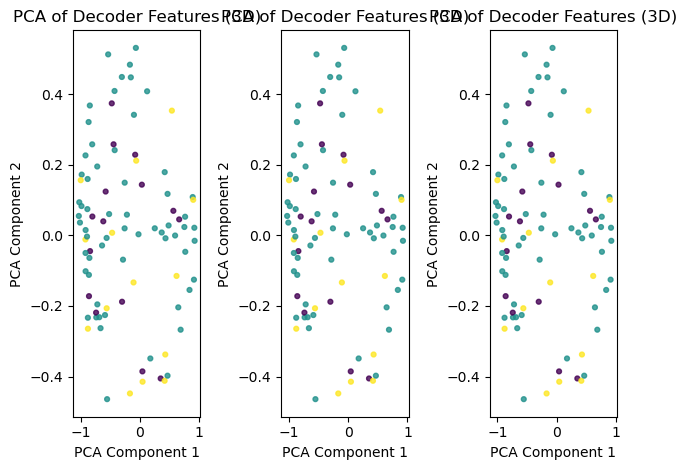

BraTS-SSA-00046-000-stk.npy
[[0. 0. 0. 0.]]
pred.shape (1024, 256)
pred_label.shape (3, 32, 32)
pred_keep:(1024,)
label.shape (3, 32, 32)
label_map.shape (32, 32)
Keep:[False False False ... False False False]
pred.shape (1024, 256)


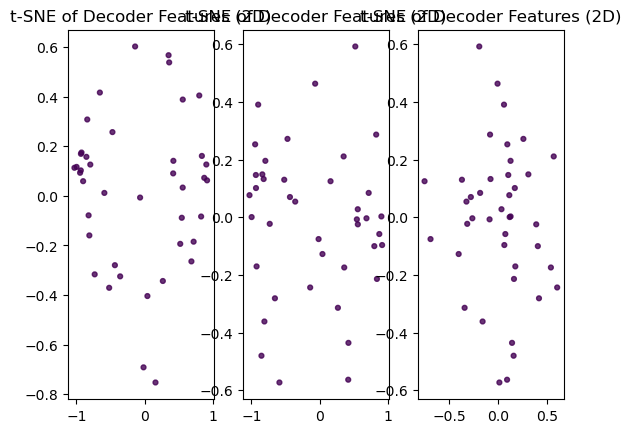

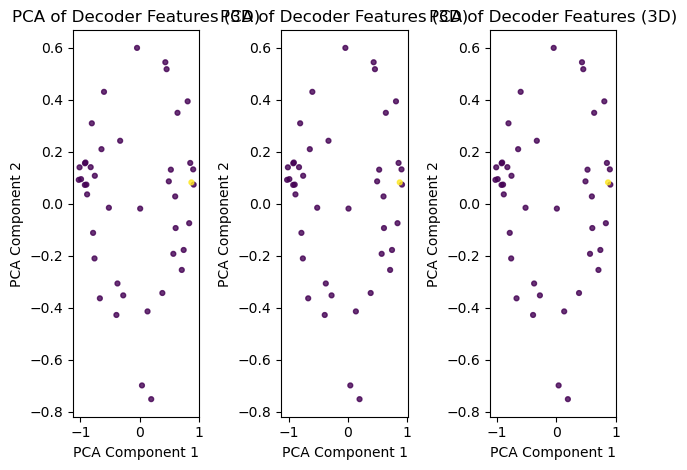

BraTS-SSA-00049-000-stk.npy
[[63. 52. 92. 80.]]
pred.shape (1024, 256)
pred_label.shape (3, 32, 32)
pred_keep:(1024,)
label.shape (3, 32, 32)
label_map.shape (32, 32)
Keep:[False False False ... False False False]
pred.shape (1024, 256)


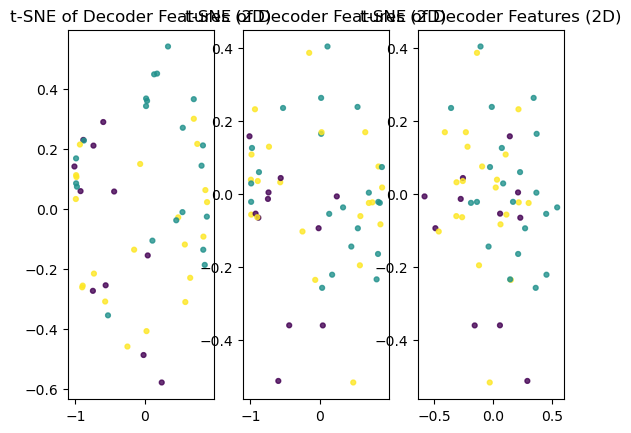

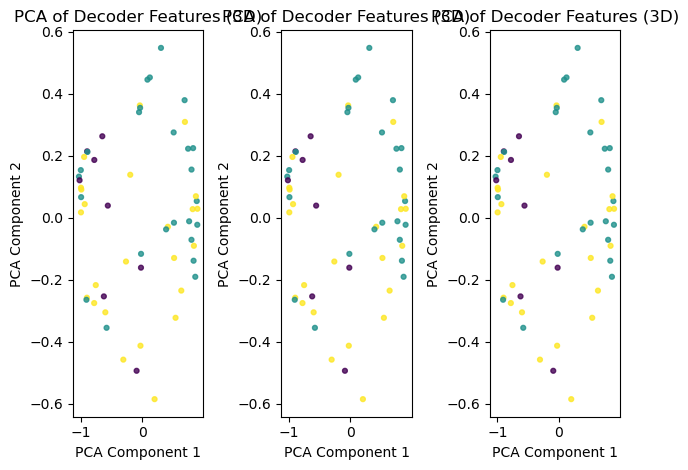

BraTS-SSA-00096-000-stk.npy
[[ 77.  39. 130. 110.]]
pred.shape (1024, 256)
pred_label.shape (3, 32, 32)
pred_keep:(1024,)
label.shape (3, 32, 32)
label_map.shape (32, 32)
Keep:[False False False ... False False False]
pred.shape (1024, 256)


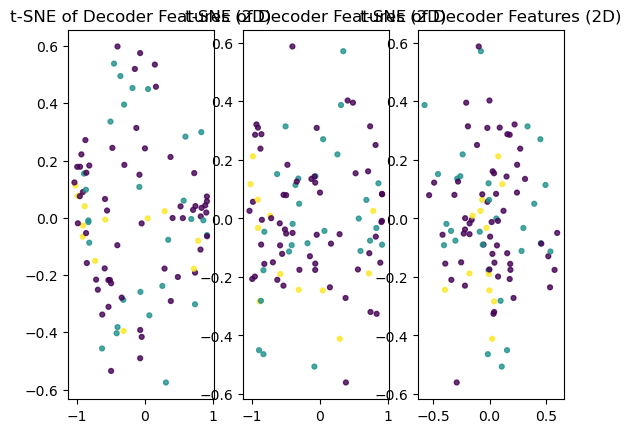

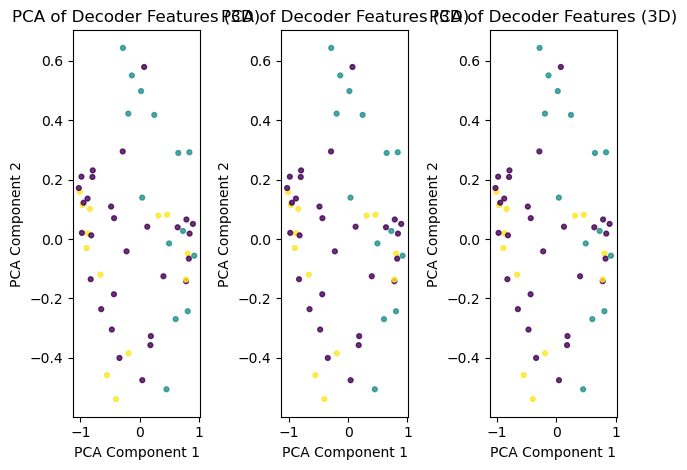

BraTS-SSA-00113-000-stk.npy
[[ 74. 100. 125. 159.]]
pred.shape (1024, 256)
pred_label.shape (3, 32, 32)
pred_keep:(1024,)
label.shape (3, 32, 32)
label_map.shape (32, 32)
Keep:[False False False ... False False False]
pred.shape (1024, 256)


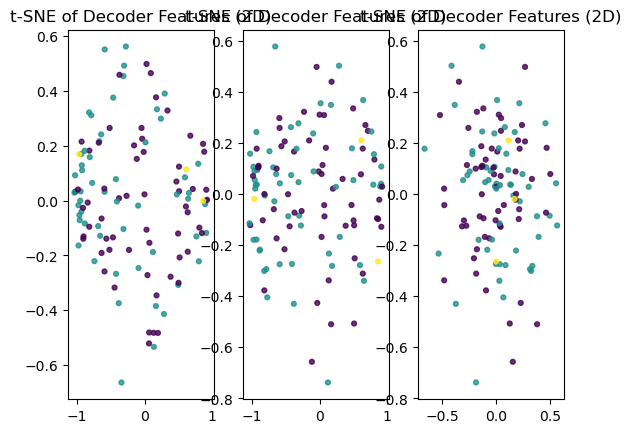

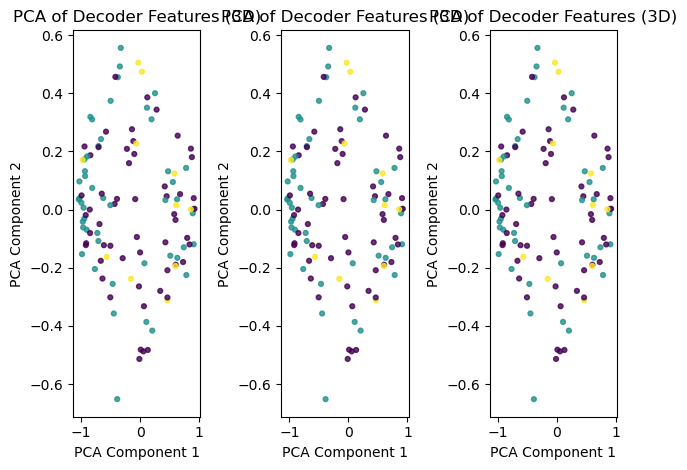

BraTS-SSA-00115-000-stk.npy
[[105.  41. 163. 122.]]
pred.shape (1024, 256)
pred_label.shape (3, 32, 32)
pred_keep:(1024,)
label.shape (3, 32, 32)
label_map.shape (32, 32)
Keep:[False False False ... False False False]
pred.shape (1024, 256)


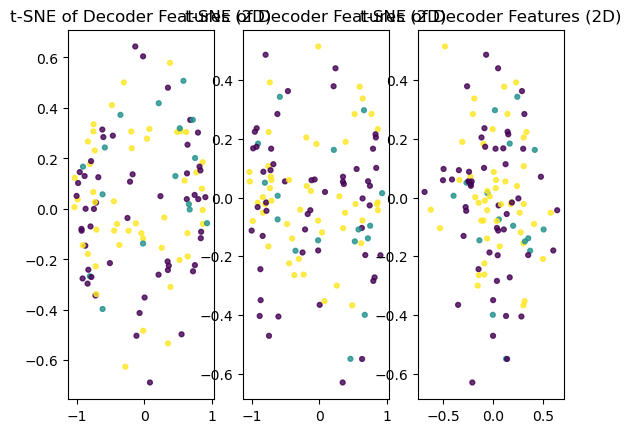

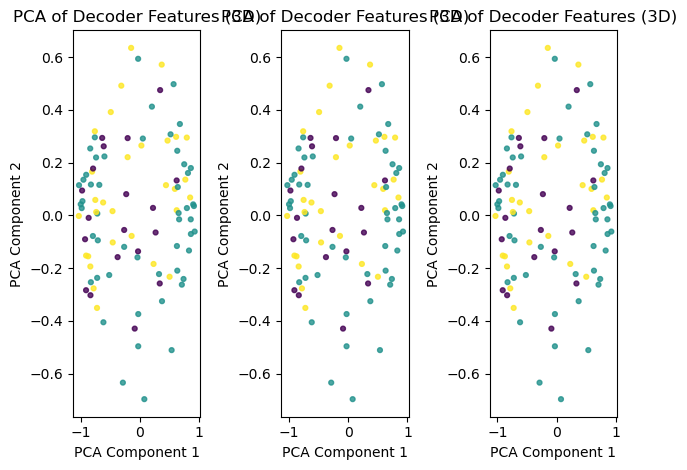

BraTS-SSA-00119-000-stk.npy
[[124. 106. 129. 111.]]
pred.shape (1024, 256)
pred_label.shape (3, 32, 32)
pred_keep:(1024,)
label.shape (3, 32, 32)
label_map.shape (32, 32)
Keep:[False False False ... False False False]
pred.shape (1024, 256)


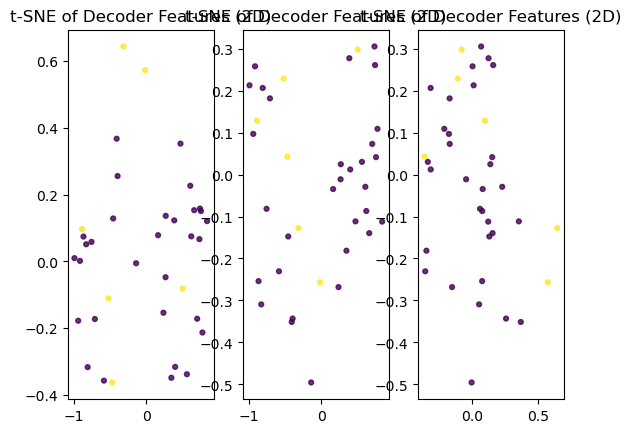

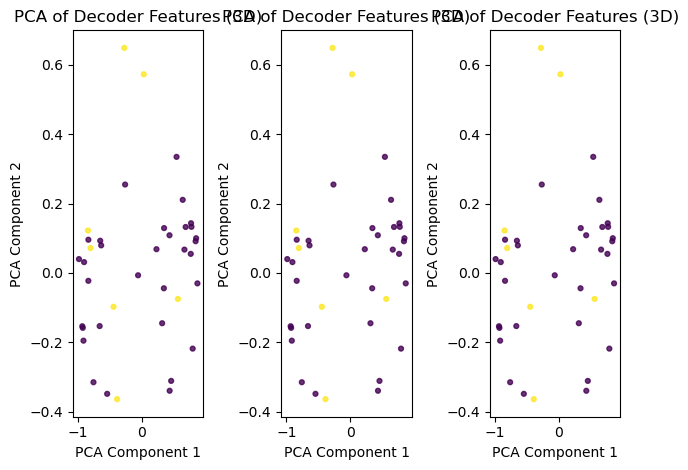

BraTS-SSA-00152-000-stk.npy
[[ 81.  95. 147. 145.]]
pred.shape (1024, 256)
pred_label.shape (3, 32, 32)
pred_keep:(1024,)
label.shape (3, 32, 32)
label_map.shape (32, 32)
Keep:[False False False ... False False False]
pred.shape (1024, 256)


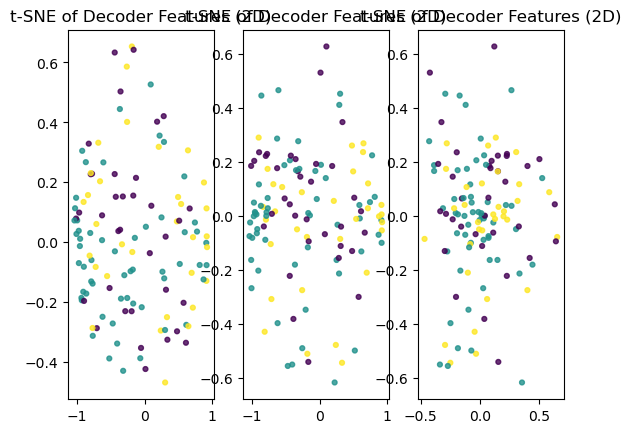

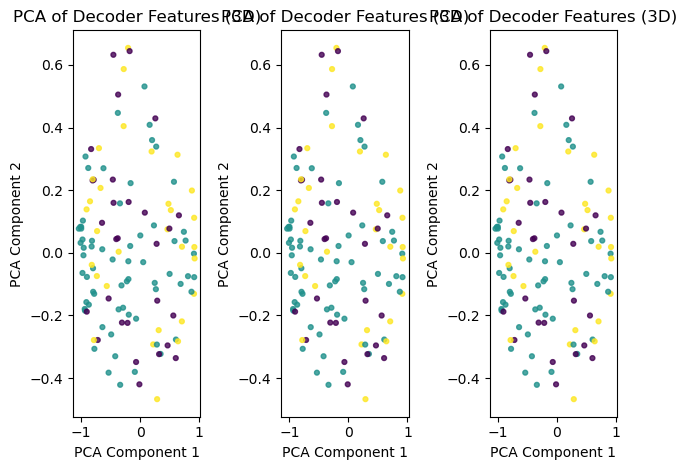

BraTS-SSA-00223-000-stk.npy
[[ 84.  63. 104.  95.]]
pred.shape (1024, 256)
pred_label.shape (3, 32, 32)
pred_keep:(1024,)
label.shape (3, 32, 32)
label_map.shape (32, 32)
Keep:[False False False ... False False False]
pred.shape (1024, 256)


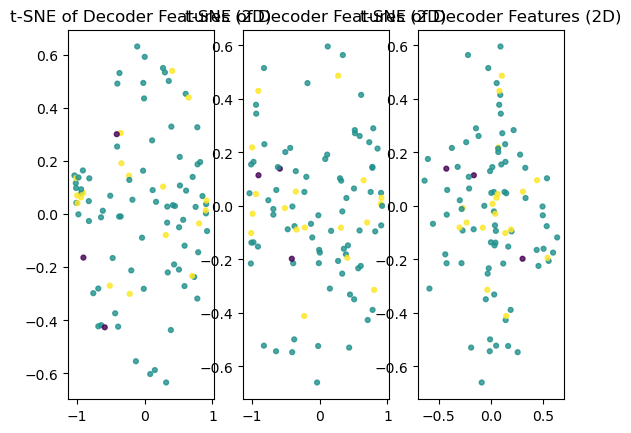

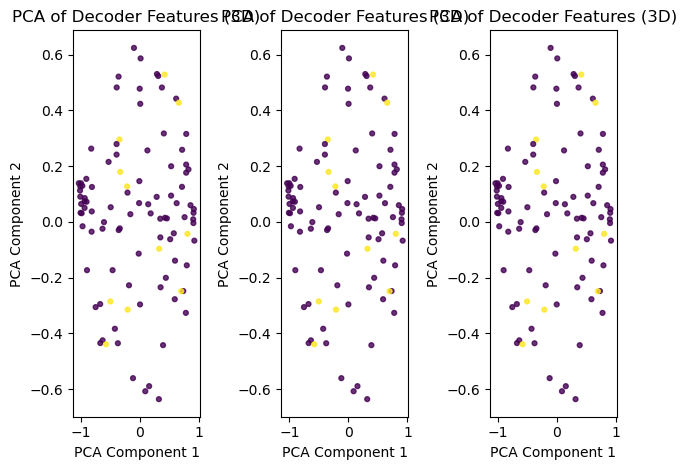

In [ ]:
pca_encoder_fit = np.load("/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/extracted_feats/vision_feats/BraTS-GLI-00336-000.npy", allow_pickle=True).squeeze(0)
pca_encoder_fit = pca_encoder_fit.reshape(-1, pca_encoder_fit.shape[0])
print(pca_encoder_fit.shape)

pca_encoder = PCA(n_components=3, random_state=42).fit(pca_encoder_fit)
print(pca_encoder.explained_variance_ratio_)
SSA_video_path = "/scratch_net/ken/radjoe/BraTS_SSA/Feature_extraction/images_UNN"
SSA_label_path = "/scratch_net/ken/radjoe/BraTS_SSA/Feature_extraction/labels_UNN"
dataset = MRIDataset(SSA_video_path, SSA_label_path)
pred_path = "/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/extracted_feats/vision_feats"
title = 'GT Vs MedSAM2-BraTS-GLI'
path_img = SSA_video_path
pred_path2 = "/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/results/Feat_extraction/boxes"

visualize_feats(dataset, pred_path, pca_encoder, title, path_img, pred_path2 = pred_path2)

### Quantifiable Things
- Class Separation
- Class variance
- Feature Disentangle ment

In [ ]:

def to_numpy_mask(m):
    # torch -> numpy, squeeze channel if present
    if isinstance(m, torch.Tensor):
        m = m.detach().cpu().numpy()
    # drop singleton dims to get [H, W]
    if m.ndim == 3 and (m.shape[0] == 1 or m.shape[-1] == 1):
        m = np.squeeze(m)
    # ensure integer type for masks
    if not np.issubdtype(m.dtype, np.integer):
        m = m.astype(np.int32)
    return m

def visualize_class_centroids(dataset, pred_path, pca_temp, title, path_img, pred_path2=None):
    for i in range(len(dataset)):
        # fig1, ax1 = plt.subplots(1, 3)
        # fig2, ax2 = plt.subplots(1, 3)
        # print(len(ax))
        idx, img, label_name, box, points, frames, label = dataset[i]
        print(img)
        # b1 = preprocess_bbox(bbox=box[0])
        # # b2 = preprocess_bbox(bbox=box[1])
        # # b3 = preprocess_bbox(bbox=box[2])
        # b = [b1,b1, b1]
        
        read_path = os.path.join(pred_path, f'{img[:-8]}.npy')
        # print(read_path)
        pred = np.load(read_path).squeeze(0)
        pred_fit = pred.reshape(-1, pred.shape[0])

        print(f"pred.shape {pred_fit.shape}")


        # Reduce dimensions with PCA


        # pred = np.transpose(pred, (3,0,1,2))
        pred_label = os.path.join(pred_path2, f'{img[:-8]}.npy')
        pred_label = np.load(pred_label)[1:, :, :, frames]
        torch_pred_label = torch.from_numpy(pred_label)
        torch_pred_label = torch.nn.functional.interpolate(torch_pred_label.unsqueeze(0).float(), size=pred.shape[1:], mode='nearest').squeeze(0).long()
        pred_label = to_numpy_mask(torch_pred_label)
        pred_label_map = np.zeros((pred_label.shape[1], pred_label.shape[2]), dtype=np.uint8)
        for c in range(pred_label.shape[0]):
            pred_label_map[pred_label[c] > 0] = c + 1   # <-- +1 so class 0 channel becomes id 1 (not 0)
        print(f"pred_label.shape {pred_label.shape}")

        pred_keep = pred_label_map.flatten() != 0
        pred_lb = pred_label_map.flatten()[pred_keep]
        print(f"pred_keep:{pred_keep.shape}")
        label = np.array(label[1:, :, :, frames])
        torch_label = torch.from_numpy(label)
        torch_label = torch.nn.functional.interpolate(torch_label.unsqueeze(0).float(), size=pred.shape[1:], mode='nearest').squeeze(0).long()

        label = to_numpy_mask(torch_label)
        label_map = np.zeros((label.shape[1], label.shape[2]), dtype=np.uint8)
        for c in range(label.shape[0]):
            label_map[label[c] > 0] = c + 1   # <-- +1 so class 0 channel becomes id 1 (not 0)
        print(f"label.shape {label.shape}")
        print(f'label_map.shape {label_map.shape}')

        keep = label_map.flatten() != 0
        lb = label_map.flatten()[keep]
        print(f"Keep:{keep}")
        X = pred_fit[keep]
        Xp = pred_fit[pred_keep]

        mu = X.mean(axis=0, keepdims=True)
        sigma = X.std(axis=0, keepdims=True) + 1e-8
        Xz = (X - mu) / sigma
        Xn = Xz / (np.linalg.norm(Xz, axis=1, keepdims=True) + 1e-8)

        mu_p = Xp.mean(axis=0, keepdims=True)
        sigma_p = Xp.std(axis=0, keepdims=True) + 1e-8
        Xz_p = (Xp - mu_p) / sigma_p
        Xn_p = Xz_p / (np.linalg.norm(Xz_p, axis=1, keepdims=True) + 1e-8)
        Xn = pca_temp.transform(Xn)
        if len(Xn_p) > 0:
            Xn_p = pca_temp.transform(Xn_p)
            centroids_Xn_p = class_centroids(Xn_p, pred_lb)
            print(f"centroids_Xn_p {centroids_Xn_p}")
            D_euc_p = pairwise_euclidean(centroids_Xn_p[1])
            D_cos_p = pairwise_cosine(centroids_Xn_p[1])
        print("Euclidean Distance Matrix between Class Centroids:\n", D_euc_p)
        print("Cosine Distance Matrix between Class Centroids:\n", D_cos_p)
        # Z2_tsne = TSNE(n_components=3, perplexity=50, learning_rate='auto', init='pca', n_iter=500, random_state=0).fit_transform(Xn)
        print(f"pred.shape {pred_fit.shape}")

        centroids_Xn = class_centroids(Xn, lb)
        D_euc = pairwise_euclidean(centroids_Xn[1])
        D_cos = pairwise_cosine(centroids_Xn[1])
        print("Euclidean Distance Matrix between Class Centroids:\n", D_euc)
        print("Cosine Distance Matrix between Class Centroids:\n", D_cos)

        plot_matrix(D_euc, "Inter-class Euclidean distances", class_names=['NCR', 'ED', 'ET'])

        plt.show()

# X: (N, D) embeddings; y: (N,) integer class labels 0..K-1
def class_centroids(X, y):
    classes = np.unique(y)
    centroids = np.stack([X[y == c][:1].mean(axis=0) for c in classes], axis=0)  # (K, D)
    return classes, centroids

def pairwise_euclidean(A):
    # A: (K, D) -> (K, K)
    print(A)
    aa = (A**2).sum(axis=1, keepdims=True)
    d2 = aa + aa.T - 2 * A @ A.T
    d2 = np.maximum(d2, 0.0)
    return np.sqrt(d2)

def pairwise_cosine(A, eps=1e-8):
    A_n = A / (np.linalg.norm(A, axis=1, keepdims=True) + eps)
    sim = A_n @ A_n.T
    # Convert similarity to distance in [0,2]
    return 1.0 - sim

def plot_matrix(M, title="", class_names=None):
    plt.figure(figsize=(6,5))
    plt.imshow(M, interpolation="nearest")
    plt.title(title)
    plt.colorbar()
    if class_names is not None:
        plt.xticks(range(len(class_names)), class_names, rotation=45, ha="right")
        plt.yticks(range(len(class_names)), class_names)
    plt.tight_layout()
    plt.show()


BraTS-GLI-00008-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]
centroids_Xn_p (array([2, 3], dtype=uint8), array([[-1.535224  , -0.01939758, -0.15461726],
       [-1.5075347 , -0.24622963, -0.03804335]], dtype=float32))
[[-1.535224   -0.01939758 -0.15461726]
 [-1.5075347  -0.24622963 -0.03804335]]
Euclidean Distance Matrix between Class Centroids:
 [[0.        0.2565322]
 [0.2565322 0.       ]]
Cosine Distance Matrix between Class Centroids:
 [[-1.1920929e-07  1.3906717e-02]
 [ 1.3906717e-02  0.0000000e+00]]
pred.shape (16384, 32)
[[-1.5246248  -0.06494773 -0.13097113]
 [-1.5336705  -0.0264219  -0.16817175]
 [-1.5059607  -0.2508447  -0.03356723]]
Euclidean Distance Matrix between Class Centroids:
 [[0.         0.05431128 0.21069661]
 [0.05431128 0.         0.26315778]
 [0.21069661 0.26315778 0.        ]]
Cosine Distance Matrix between Class Centroids

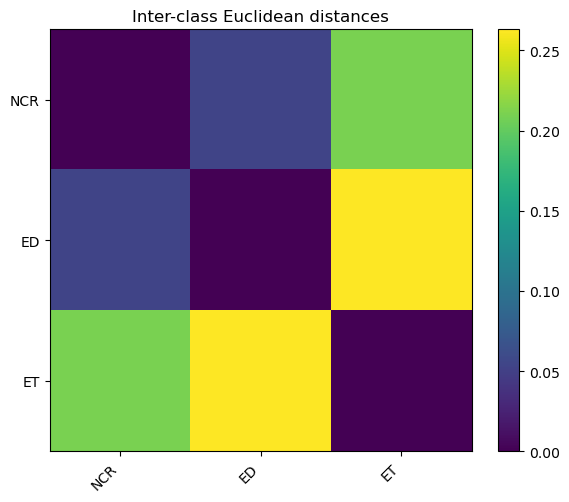

BraTS-GLI-00043-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]
centroids_Xn_p (array([1, 2, 3], dtype=uint8), array([[-0.20974714, -0.08794801,  0.8480671 ],
       [ 0.20391798, -0.34259582, -0.42931816],
       [ 0.443533  , -0.01669719, -0.13137165]], dtype=float32))
[[-0.20974714 -0.08794801  0.8480671 ]
 [ 0.20391798 -0.34259582 -0.42931816]
 [ 0.443533   -0.01669719 -0.13137165]]
Euclidean Distance Matrix between Class Centroids:
 [[3.4526698e-04 1.3666300e+00 1.1794710e+00]
 [1.3666300e+00 0.0000000e+00 5.0239170e-01]
 [1.1794710e+00 5.0239170e-01 0.0000000e+00]]
Cosine Distance Matrix between Class Centroids:
 [[ 0.0000000e+00  1.7323227e+00  1.4994102e+00]
 [ 1.7323227e+00 -1.1920929e-07  4.3744045e-01]
 [ 1.4994102e+00  4.3744045e-01  0.0000000e+00]]
pred.shape (16384, 32)
[[-1.1837871   0.51886004  0.43476966]
 [ 0.05502403 -0.40071318 -0.

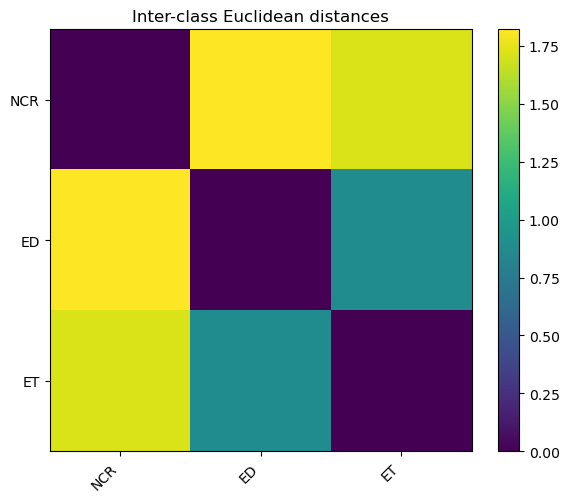

BraTS-GLI-00095-001-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]
centroids_Xn_p (array([1, 2, 3], dtype=uint8), array([[-1.5118649 , -0.15727587,  0.15483953],
       [ 0.22961366,  0.20080765,  0.13735232],
       [-1.2405546 , -0.47439814, -0.15986098]], dtype=float32))
[[-1.5118649  -0.15727587  0.15483953]
 [ 0.22961366  0.20080765  0.13735232]
 [-1.2405546  -0.47439814 -0.15986098]]
Euclidean Distance Matrix between Class Centroids:
 [[0.         1.7779981  0.52269703]
 [1.7779981  0.         1.6448809 ]
 [0.52269703 1.6448809  0.        ]]
Cosine Distance Matrix between Class Centroids:
 [[-1.1920929e-07  1.6993538e+00  5.7990968e-02]
 [ 1.6993538e+00 -1.1920929e-07  1.8984332e+00]
 [ 5.7990968e-02  1.8984332e+00 -1.1920929e-07]]
pred.shape (16384, 32)
[[-1.5433257  -0.01309701  0.0575764 ]
 [ 0.35250366 -0.23458874  0.14712414]
 [-1.2338814  -0.

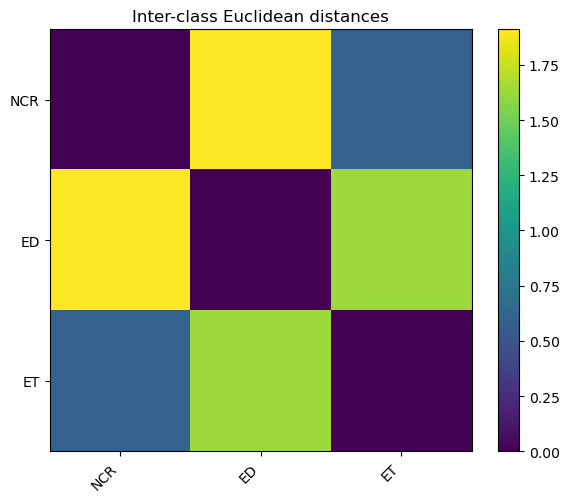

BraTS-GLI-00172-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]
centroids_Xn_p (array([1, 2, 3], dtype=uint8), array([[-0.9664174 , -0.7723365 ,  0.039179  ],
       [-1.5367957 , -0.00323239,  0.04289382],
       [ 0.43940794, -0.03211205, -0.11254683]], dtype=float32))
[[-0.9664174  -0.7723365   0.039179  ]
 [-1.5367957  -0.00323239  0.04289382]
 [ 0.43940794 -0.03211205 -0.11254683]]
Euclidean Distance Matrix between Class Centroids:
 [[0.         0.95753133 1.5960255 ]
 [0.95753133 0.         1.9825178 ]
 [1.5960255  1.9825178  0.        ]]
Cosine Distance Matrix between Class Centroids:
 [[0.         0.21731883 1.7182562 ]
 [0.21731883 0.         1.9726887 ]
 [1.7182562  1.9726887  0.        ]]
pred.shape (16384, 32)
[[-1.5382724  -0.03753488  0.05132475]
 [-0.7984778  -0.81373936 -0.00970887]
 [ 0.12846619  0.09910542 -0.04132154]]
Euclidean Dis

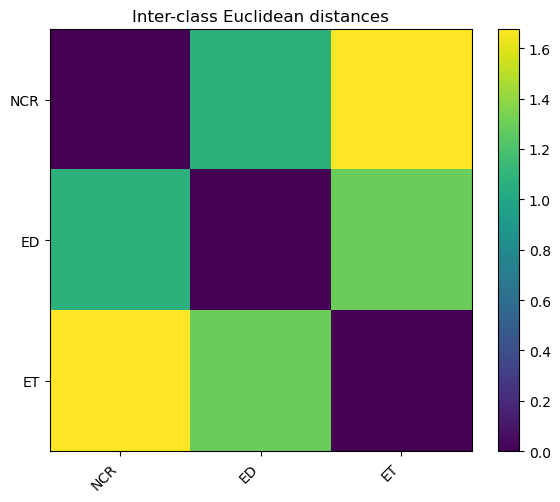

BraTS-GLI-00259-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]
centroids_Xn_p (array([1, 2, 3], dtype=uint8), array([[ 0.2347492 ,  0.36082906, -0.37220275],
       [-1.3547808 ,  0.18544467,  0.4534152 ],
       [ 0.13023067,  0.25272042, -0.6693951 ]], dtype=float32))
[[ 0.2347492   0.36082906 -0.37220275]
 [-1.3547808   0.18544467  0.4534152 ]
 [ 0.13023067  0.25272042 -0.6693951 ]]
Euclidean Distance Matrix between Class Centroids:
 [[0.         1.799725   0.33306885]
 [1.799725   0.         1.8629246 ]
 [0.33306885 1.8629246  0.        ]]
Cosine Distance Matrix between Class Centroids:
 [[ 0.0000000e+00  1.5121663e+00  1.0378778e-01]
 [ 1.5121663e+00  5.9604645e-08  1.4133565e+00]
 [ 1.0378778e-01  1.4133565e+00 -1.1920929e-07]]
pred.shape (16384, 32)
[[ 0.22338068  0.37717825 -0.19967991]
 [ 0.33283544  0.02742564  0.3472338 ]
 [ 0.0974946   0.

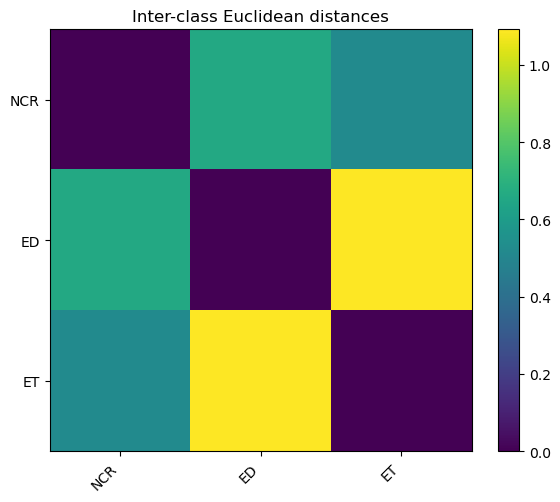

BraTS-GLI-00289-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]
centroids_Xn_p (array([1, 2, 3], dtype=uint8), array([[-0.13113528,  0.7815172 , -0.0582953 ],
       [ 0.11426193, -0.0448382 ,  0.5200691 ],
       [-1.5379109 , -0.06666861,  0.08729187]], dtype=float32))
[[-0.13113528  0.7815172  -0.0582953 ]
 [ 0.11426193 -0.0448382   0.5200691 ]
 [-1.5379109  -0.06666861  0.08729187]]
Euclidean Distance Matrix between Class Centroids:
 [[0.0000000e+00 1.0380696e+00 1.6491308e+00]
 [1.0380696e+00 2.4414062e-04 1.7080538e+00]
 [1.6491308e+00 1.7080538e+00 0.0000000e+00]]
Cosine Distance Matrix between Class Centroids:
 [[1.1920929e-07 1.1892244e+00 8.8206547e-01]
 [1.1892244e+00 1.1920929e-07 1.1545569e+00]
 [8.8206547e-01 1.1545569e+00 0.0000000e+00]]
pred.shape (16384, 32)
[[ 4.48912501e-01 -2.93718185e-04 -1.04243144e-01]
 [-8.34272265e-01 -2.21875

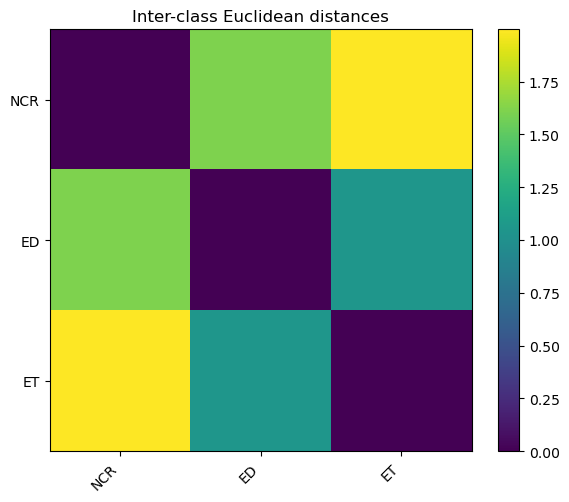

BraTS-GLI-00336-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]
centroids_Xn_p (array([1, 2, 3], dtype=uint8), array([[-1.4792957 , -0.00161563,  0.16312155],
       [ 0.30680835,  0.30672827, -0.13452579],
       [ 0.4144898 ,  0.03846891, -0.13748984]], dtype=float32))
[[-1.4792957  -0.00161563  0.16312155]
 [ 0.30680835  0.30672827 -0.13452579]
 [ 0.4144898   0.03846891 -0.13748984]]
Euclidean Distance Matrix between Class Centroids:
 [[0.0000000e+00 1.8368009e+00 1.9179149e+00]
 [1.8368009e+00 0.0000000e+00 2.8907987e-01]
 [1.9179149e+00 2.8907987e-01 1.7263349e-04]]
Cosine Distance Matrix between Class Centroids:
 [[5.9604645e-08 1.7045953e+00 1.9742568e+00]
 [1.7045953e+00 0.0000000e+00 2.0920950e-01]
 [1.9742568e+00 2.0920950e-01 1.1920929e-07]]
pred.shape (16384, 32)
[[-1.4833348  -0.0035393   0.15920049]
 [ 0.30354738  0.30989444 -0.13757665]

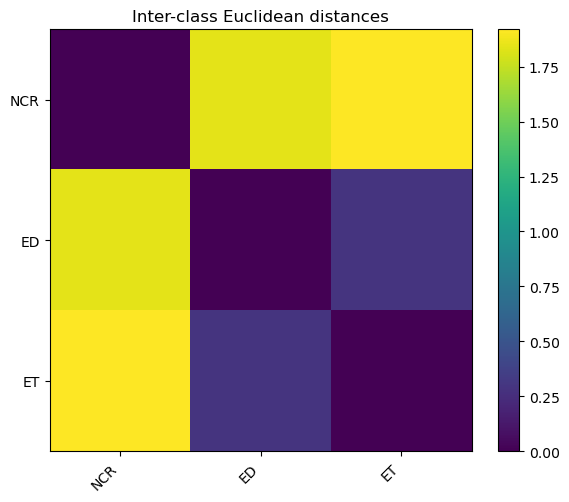

BraTS-GLI-00523-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]
centroids_Xn_p (array([2, 3], dtype=uint8), array([[-1.5361037 , -0.04385032,  0.04471787],
       [-0.14195856, -0.08104193, -0.00690516]], dtype=float32))
[[-1.5361037  -0.04385032  0.04471787]
 [-0.14195856 -0.08104193 -0.00690516]]
Euclidean Distance Matrix between Class Centroids:
 [[0.        1.3955963]
 [1.3955963 0.       ]]
Cosine Distance Matrix between Class Centroids:
 [[5.9604645e-08 1.2014669e-01]
 [1.2014669e-01 1.7881393e-07]]
pred.shape (16384, 32)
[[-1.5424991  -0.01131323  0.06183748]
 [-1.5371641   0.00390733  0.09859611]
 [-0.08082315 -0.07553704  0.12258696]]
Euclidean Distance Matrix between Class Centroids:
 [[0.         0.04014016 1.4643469 ]
 [0.04014016 0.         1.4587036 ]
 [1.4643469  1.4587036  0.        ]]
Cosine Distance Matrix between Class Centroids:
 [

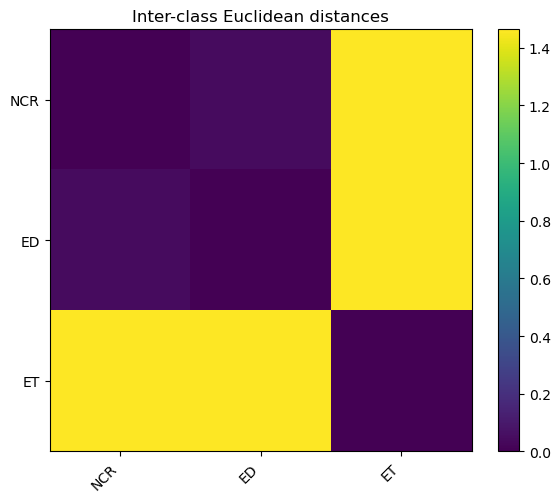

BraTS-GLI-00548-001-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]
centroids_Xn_p (array([1, 2, 3], dtype=uint8), array([[-1.5413674 , -0.05504707, -0.07144199],
       [-1.5442841 , -0.00710053, -0.05920609],
       [ 0.28191084,  0.02777002, -0.55859673]], dtype=float32))
[[-1.5413674  -0.05504707 -0.07144199]
 [-1.5442841  -0.00710053 -0.05920609]
 [ 0.28191084  0.02777002 -0.55859673]]
Euclidean Distance Matrix between Class Centroids:
 [[0.0000000e+00 4.9574375e-02 1.8890531e+00]
 [4.9574375e-02 0.0000000e+00 1.8935667e+00]
 [1.8890531e+00 1.8935667e+00 2.4414062e-04]]
Cosine Distance Matrix between Class Centroids:
 [[-1.1920929e-07  5.1444769e-04  1.4096524e+00]
 [ 5.1444769e-04  5.9604645e-08  1.4158082e+00]
 [ 1.4096524e+00  1.4158082e+00  0.0000000e+00]]
pred.shape (16384, 32)
[[-1.5262148  -0.18150903 -0.08050419]
 [-1.5442436  -0.00492646 -0.

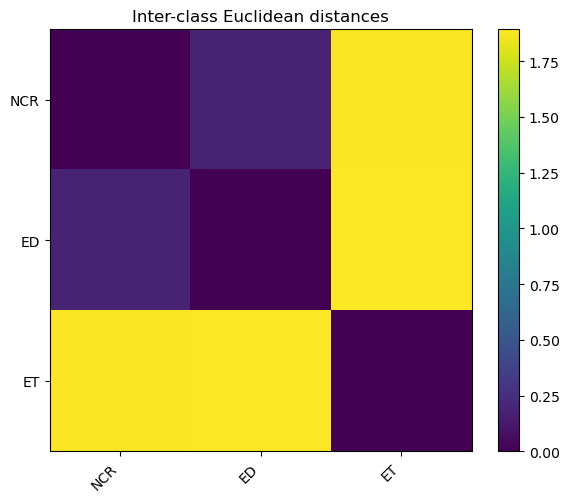

BraTS-GLI-00692-001-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]
centroids_Xn_p (array([1, 2, 3], dtype=uint8), array([[-1.1314172 ,  0.19545527,  0.4351971 ],
       [-1.5438633 , -0.0176029 ,  0.05007589],
       [ 0.29206932,  0.30518553, -0.29090267]], dtype=float32))
[[-1.1314172   0.19545527  0.4351971 ]
 [-1.5438633  -0.0176029   0.05007589]
 [ 0.29206932  0.30518553 -0.29090267]]
Euclidean Distance Matrix between Class Centroids:
 [[0.        0.6031784 1.6017413]
 [0.6031784 0.        1.8950217]
 [1.6017413 1.8950217 0.       ]]
Cosine Distance Matrix between Class Centroids:
 [[-1.1920929e-07  6.9433808e-02  1.6310139e+00]
 [ 6.9433808e-02  1.1920929e-07  1.5942758e+00]
 [ 1.6310139e+00  1.5942758e+00  5.9604645e-08]]
pred.shape (16384, 32)
[[ 0.39277554 -0.07631324  0.25170925]
 [-1.5439664  -0.0073906   0.04428701]
 [ 0.31344825 -0.08683239 

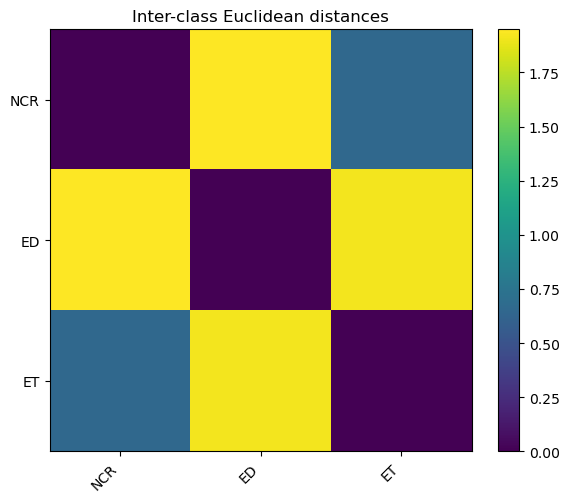

BraTS-SSA-00002-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]
centroids_Xn_p (array([1, 2, 3], dtype=uint8), array([[-1.5119355 ,  0.23383914, -0.03335292],
       [-1.4764718 ,  0.22024632,  0.23809555],
       [-1.541475  , -0.04114564,  0.05846348]], dtype=float32))
[[-1.5119355   0.23383914 -0.03335292]
 [-1.4764718   0.22024632  0.23809555]
 [-1.541475   -0.04114564  0.05846348]]
Euclidean Distance Matrix between Class Centroids:
 [[0.         0.27409327 0.29141024]
 [0.27409327 0.         0.32375735]
 [0.29141024 0.32375735 0.        ]]
Cosine Distance Matrix between Class Centroids:
 [[0.         0.01616335 0.01794565]
 [0.01616335 0.         0.02225494]
 [0.01794565 0.02225494 0.        ]]
pred.shape (16384, 32)
[[-1.5131174   0.22955346 -0.03102222]
 [-1.380337    0.336305    0.36698344]
 [-1.5440946  -0.03376991  0.03851749]]
Euclidean Dis

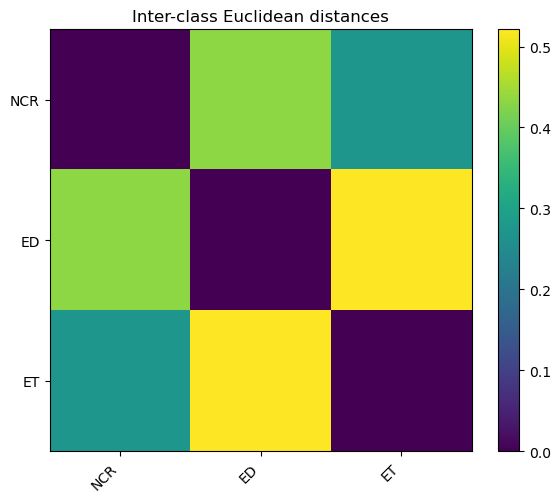

BraTS-SSA-00012-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]
centroids_Xn_p (array([1, 2, 3], dtype=uint8), array([[-1.5412698 , -0.01570644, -0.10109664],
       [-1.54578   , -0.00791919, -0.01959676],
       [ 0.40762514, -0.0558733 ,  0.15252753]], dtype=float32))
[[-1.5412698  -0.01570644 -0.10109664]
 [-1.54578    -0.00791919 -0.01959676]
 [ 0.40762514 -0.0558733   0.15252753]]
Euclidean Distance Matrix between Class Centroids:
 [[0.         0.08199346 1.965739  ]
 [0.08199346 0.         1.96156   ]
 [1.965739   1.96156    0.        ]]
Cosine Distance Matrix between Class Centroids:
 [[5.9604645e-08 1.4075041e-03 1.9483714e+00]
 [1.4075041e-03 0.0000000e+00 1.9326231e+00]
 [1.9483714e+00 1.9326231e+00 5.9604645e-08]]
pred.shape (16384, 32)
[[-1.5412099  -0.0157784  -0.10208143]
 [-1.5454514  -0.02165037 -0.04338747]
 [ 0.1468389  -0.02253675 

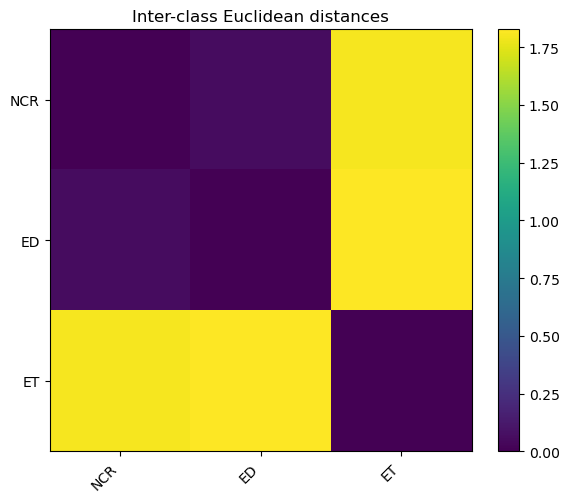

BraTS-SSA-00046-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]
centroids_Xn_p (array([2, 3], dtype=uint8), array([[-1.2528305 ,  0.20375754,  0.6457729 ],
       [-1.3959236 , -0.01479047,  0.3726771 ]], dtype=float32))
[[-1.2528305   0.20375754  0.6457729 ]
 [-1.3959236  -0.01479047  0.3726771 ]]
Euclidean Distance Matrix between Class Centroids:
 [[0.        0.3779155]
 [0.3779155 0.       ]]
Cosine Distance Matrix between Class Centroids:
 [[0.         0.03459901]
 [0.03459901 0.        ]]
pred.shape (16384, 32)
[[-1.3681216  -0.15680674  0.44919848]
 [ 0.31938595  0.36819407 -0.10225906]]
Euclidean Distance Matrix between Class Centroids:
 [[0.        1.8513273]
 [1.8513273 0.       ]]
Cosine Distance Matrix between Class Centroids:
 [[-1.1920929e-07  1.7494287e+00]
 [ 1.7494287e+00 -1.1920929e-07]]


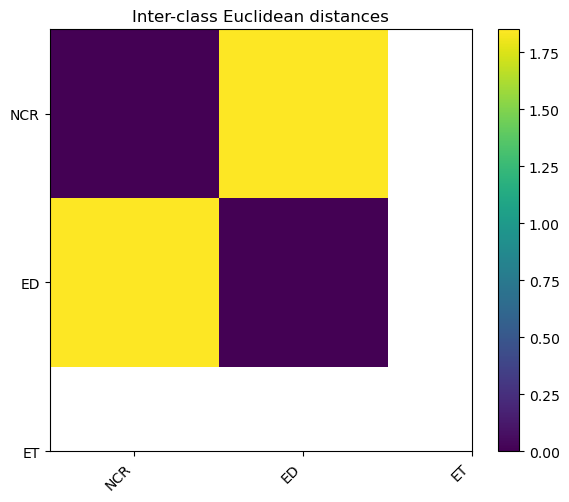

BraTS-SSA-00049-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]
centroids_Xn_p (array([1, 2, 3], dtype=uint8), array([[-1.5360808 , -0.03543058,  0.11680282],
       [ 0.34623033, -0.16224276,  0.35355017],
       [-0.39455682,  0.6259386 ,  0.6047444 ]], dtype=float32))
[[-1.5360808  -0.03543058  0.11680282]
 [ 0.34623033 -0.16224276  0.35355017]
 [-0.39455682  0.6259386   0.6047444 ]]
Euclidean Distance Matrix between Class Centroids:
 [[0.0000000e+00 1.9013747e+00 1.4066176e+00]
 [1.9013747e+00 2.4414062e-04 1.1104476e+00]
 [1.4066176e+00 1.1104476e+00 3.4526698e-04]]
Cosine Distance Matrix between Class Centroids:
 [[-2.3841858e-07  1.6041360e+00  5.5550385e-01]
 [ 1.6041360e+00  5.9604645e-08  1.0489383e+00]
 [ 5.5550385e-01  1.0489383e+00  0.0000000e+00]]
pred.shape (16384, 32)
[[ 0.43278366 -0.07542685 -0.17516619]
 [-1.5061042   0.04576546  0.

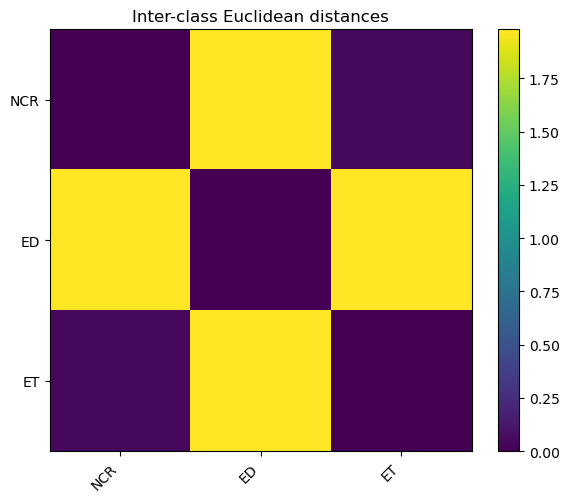

BraTS-SSA-00096-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]
centroids_Xn_p (array([1, 2, 3], dtype=uint8), array([[ 0.44060808, -0.02230222,  0.08853448],
       [ 0.45143622,  0.01145736,  0.03624098],
       [ 0.37868088, -0.00312457, -0.14238763]], dtype=float32))
[[ 0.44060808 -0.02230222  0.08853448]
 [ 0.45143622  0.01145736  0.03624098]
 [ 0.37868088 -0.00312457 -0.14238763]]
Euclidean Distance Matrix between Class Centroids:
 [[0.         0.06317867 0.2398495 ]
 [0.06317867 0.         0.19342734]
 [0.2398495  0.19342734 0.        ]]
Cosine Distance Matrix between Class Centroids:
 [[ 5.9604645e-08  9.7673535e-03  1.5234387e-01]
 [ 9.7673535e-03 -1.1920929e-07  9.5659077e-02]
 [ 1.5234387e-01  9.5659077e-02  5.9604645e-08]]
pred.shape (16384, 32)
[[ 0.43917078 -0.02104074  0.11381318]
 [ 0.27041137  0.01193214  0.35515574]
 [ 0.42226732  0.

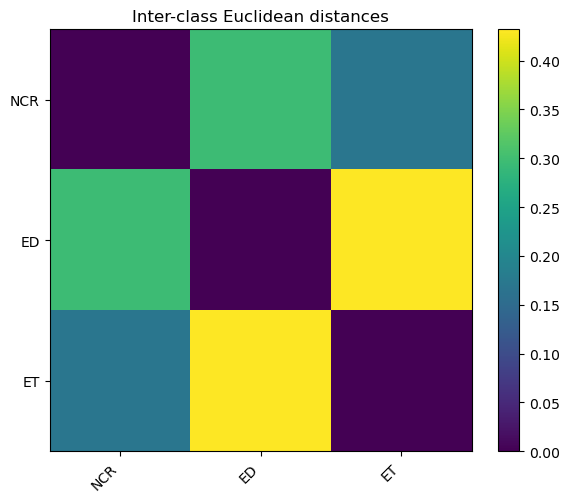

BraTS-SSA-00113-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]
centroids_Xn_p (array([1, 2, 3], dtype=uint8), array([[ 0.07245559, -0.09054035, -0.79315245],
       [-1.5458615 , -0.00437349, -0.00795514],
       [ 0.43731862, -0.07745799, -0.17963377]], dtype=float32))
[[ 0.07245559 -0.09054035 -0.79315245]
 [-1.5458615  -0.00437349 -0.00795514]
 [ 0.43731862 -0.07745799 -0.17963377]]
Euclidean Distance Matrix between Class Centroids:
 [[0.        1.800808  0.7139337]
 [1.800808  0.        1.9919384]
 [0.7139337 1.9919384 0.       ]]
Cosine Distance Matrix between Class Centroids:
 [[0.0000000e+00 1.0849774e+00 5.2821338e-01]
 [1.0849774e+00 0.0000000e+00 1.9104314e+00]
 [5.2821338e-01 1.9104314e+00 5.9604645e-08]]
pred.shape (16384, 32)
[[-1.5457009  -0.00877852 -0.0391987 ]
 [-1.5417109   0.03753413  0.04759876]
 [ 0.42794847 -0.02668263 -0.040121

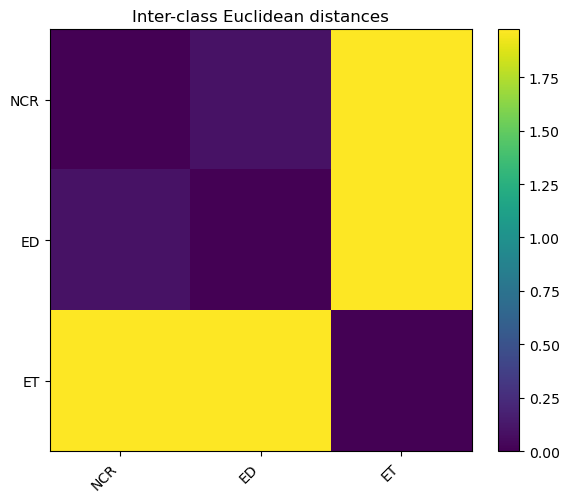

BraTS-SSA-00115-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]
centroids_Xn_p (array([1, 2, 3], dtype=uint8), array([[-0.4557592 ,  0.59945714, -0.05475789],
       [-0.5461635 , -0.40853035,  0.03523337],
       [ 0.42019618, -0.00148007,  0.04033937]], dtype=float32))
[[-0.4557592   0.59945714 -0.05475789]
 [-0.5461635  -0.40853035  0.03523337]
 [ 0.42019618 -0.00148007  0.04033937]]
Euclidean Distance Matrix between Class Centroids:
 [[0.        1.0160266 1.0665209]
 [1.0160266 0.        1.0486023]
 [1.0665209 1.0486023 0.       ]]
Cosine Distance Matrix between Class Centroids:
 [[0.0000000e+00 9.9594051e-01 1.6105821e+00]
 [9.9594051e-01 5.9604645e-08 1.7890097e+00]
 [1.6105821e+00 1.7890097e+00 5.9604645e-08]]
pred.shape (16384, 32)
[[ 0.39638805  0.089147    0.27732292]
 [-0.40169394 -0.15353692  0.21185341]
 [ 0.3690781   0.21861976 -0.064919

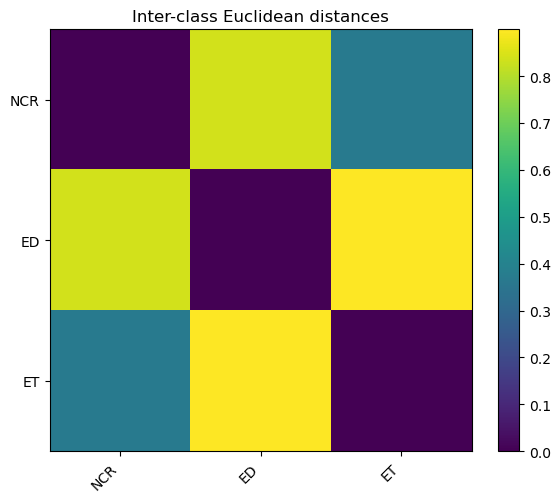

BraTS-SSA-00119-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]
centroids_Xn_p (array([2, 3], dtype=uint8), array([[ 0.41667682,  0.21490845,  0.04730249],
       [ 0.2051866 , -0.06325892, -0.66436386]], dtype=float32))
[[ 0.41667682  0.21490845  0.04730249]
 [ 0.2051866  -0.06325892 -0.66436386]]
Euclidean Distance Matrix between Class Centroids:
 [[0.        0.7928268]
 [0.7928268 0.       ]]
Cosine Distance Matrix between Class Centroids:
 [[-1.1920929e-07  8.7697452e-01]
 [ 8.7697452e-01  0.0000000e+00]]
pred.shape (16384, 32)
[[ 0.45251405  0.00859558  0.0172983 ]
 [-1.5442216  -0.02850107  0.03379615]
 [-1.5446153  -0.00838065  0.02811027]]
Euclidean Distance Matrix between Class Centroids:
 [[0.         1.9971484  1.9972308 ]
 [1.9971484  0.         0.02089935]
 [1.9972308  0.02089935 0.        ]]
Cosine Distance Matrix between Class Centroids

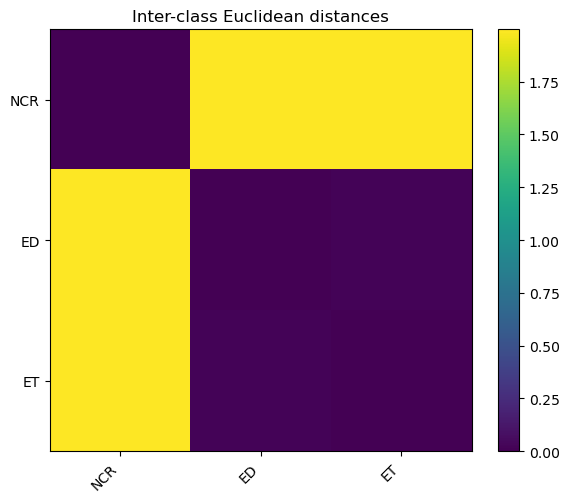

BraTS-SSA-00152-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]
centroids_Xn_p (array([1, 2, 3], dtype=uint8), array([[ 0.18611073,  0.0041049 , -0.69303095],
       [-1.4191272 ,  0.07606257, -0.4846838 ],
       [-1.4145693 , -0.11388142, -0.05071963]], dtype=float32))
[[ 0.18611073  0.0041049  -0.69303095]
 [-1.4191272   0.07606257 -0.4846838 ]
 [-1.4145693  -0.11388142 -0.05071963]]
Euclidean Distance Matrix between Class Centroids:
 [[0.        1.6203009 1.7287744]
 [1.6203009 0.        0.4737345]
 [1.7287744 0.4737345 0.       ]]
Cosine Distance Matrix between Class Centroids:
 [[1.1920929e-07 9.3308759e-01 1.2243160e+00]
 [9.3308759e-01 0.0000000e+00 5.1068664e-02]
 [1.2243160e+00 5.1068664e-02 5.9604645e-08]]
pred.shape (16384, 32)
[[-1.5442524  -0.01068973  0.00532018]
 [-1.5191692   0.12765178 -0.1096452 ]
 [-1.5350735  -0.08825409 -0.010940

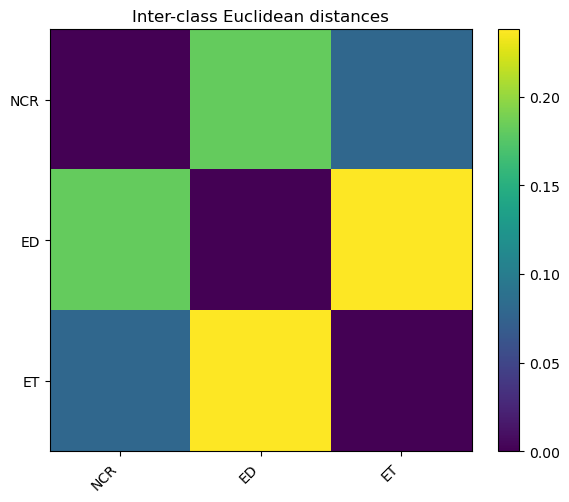

BraTS-SSA-00223-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]
centroids_Xn_p (array([1, 2, 3], dtype=uint8), array([[ 0.1063931 ,  0.5815753 ,  0.2558626 ],
       [-1.2147458 ,  0.54946864,  0.06296387],
       [ 0.39458156, -0.06081929, -0.167805  ]], dtype=float32))
[[ 0.1063931   0.5815753   0.2558626 ]
 [-1.2147458   0.54946864  0.06296387]
 [ 0.39458156 -0.06081929 -0.167805  ]]
Euclidean Distance Matrix between Class Centroids:
 [[0.         1.335533   0.82171625]
 [1.335533   0.         1.7365597 ]
 [0.82171625 1.7365597  0.        ]]
Cosine Distance Matrix between Class Centroids:
 [[ 0.0000000e+00  7.5992715e-01  1.1302015e+00]
 [ 7.5992715e-01 -1.1920929e-07  1.9053127e+00]
 [ 1.1302015e+00  1.9053127e+00  0.0000000e+00]]
pred.shape (16384, 32)
[[ 0.3055066   0.23774612  0.08726119]
 [-1.2141721   0.55152345  0.05533054]
 [-1.5408597  -0.

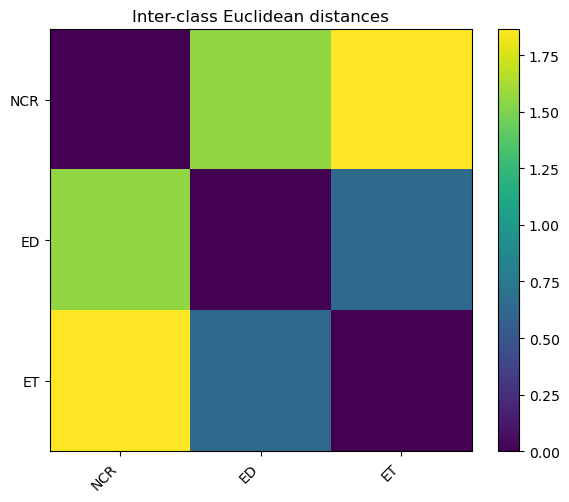

In [ ]:
visualize_class_centroids(dataset, pred_path, pca_decoder, title, path_img, pred_path2 = pred_path2)

In [ ]:
# !pip install seaborn

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt



In [ ]:

def to_numpy_mask(m):
    # torch -> numpy, squeeze channel if present
    if isinstance(m, torch.Tensor):
        m = m.detach().cpu().numpy()
    # drop singleton dims to get [H, W]
    if m.ndim == 3 and (m.shape[0] == 1 or m.shape[-1] == 1):
        m = np.squeeze(m)
    # ensure integer type for masks
    if not np.issubdtype(m.dtype, np.integer):
        m = m.astype(np.int32)
    return m

def visualize_KDE(dataset, pred_path, pca_temp, title, path_img, pred_path2=None):
    for i in range(len(dataset)):

        idx, img, label_name, box, points, frames, label = dataset[i]
        print(img)

        read_path = os.path.join(pred_path, f'{img[:-8]}.npy')
        # print(read_path)
        pred = np.load(read_path).squeeze(0)
        pred_fit = pred.reshape(-1, pred.shape[0])

        print(f"pred.shape {pred_fit.shape}")

        pred_label = os.path.join(pred_path2, f'{img[:-8]}.npy')
        pred_label = np.load(pred_label)[1:, :, :, frames]
        torch_pred_label = torch.from_numpy(pred_label)
        torch_pred_label = torch.nn.functional.interpolate(torch_pred_label.unsqueeze(0).float(), size=pred.shape[1:], mode='nearest').squeeze(0).long()
        pred_label = to_numpy_mask(torch_pred_label)
        pred_label_map = np.zeros((pred_label.shape[1], pred_label.shape[2]), dtype=np.uint8)
        for c in range(pred_label.shape[0]):
            pred_label_map[pred_label[c] > 0] = c + 1   # <-- +1 so class 0 channel becomes id 1 (not 0)
        print(f"pred_label.shape {pred_label.shape}")

        pred_keep = pred_label_map.flatten() != 0
        pred_lb = pred_label_map.flatten()[pred_keep]
        print(f"pred_keep:{pred_keep.shape}")
        label = np.array(label[1:, :, :, frames])
        torch_label = torch.from_numpy(label)
        torch_label = torch.nn.functional.interpolate(torch_label.unsqueeze(0).float(), size=pred.shape[1:], mode='nearest').squeeze(0).long()

        label = to_numpy_mask(torch_label)
        label_map = np.zeros((label.shape[1], label.shape[2]), dtype=np.uint8)
        for c in range(label.shape[0]):
            label_map[label[c] > 0] = c + 1   # <-- +1 so class 0 channel becomes id 1 (not 0)
        print(f"label.shape {label.shape}")
        print(f'label_map.shape {label_map.shape}')

        keep = label_map.flatten() != 0
        lb = label_map.flatten()[keep]
        print(f"Keep:{keep}")
        X = pred_fit[keep]
        Xp = pred_fit[pred_keep]

        mu = X.mean(axis=0, keepdims=True)
        sigma = X.std(axis=0, keepdims=True) + 1e-8
        Xz = (X - mu) / sigma
        Xn = Xz / (np.linalg.norm(Xz, axis=1, keepdims=True) + 1e-8)

        mu_p = Xp.mean(axis=0, keepdims=True)
        sigma_p = Xp.std(axis=0, keepdims=True) + 1e-8
        Xz_p = (Xp - mu_p) / sigma_p
        Xn_p = Xz_p / (np.linalg.norm(Xz_p, axis=1, keepdims=True) + 1e-8)
        Xn = pca_temp.transform(Xn)

        classes_p = np.unique(pred_lb)
        classes = np.unique(lb)
        if len(Xn_p) > 0:
            Xn_p = pca_temp.transform(Xn_p)
            centroids_p = np.stack([Xn_p[pred_lb== c].mean(axis=0) for c in classes_p])
            centroids = np.stack([Xn[lb == c].mean(axis=0) for c in classes])

        # Compute distance of each sample to its own class centroid
        distances_p = np.zeros_like(pred_lb, dtype=float)
        distances = np.zeros_like(lb, dtype=float)
        if len(Xn_p) > 0:
            for i, c in enumerate(classes_p):
                diff_p = Xn_p[pred_lb == c] - centroids_p[i]
                dist_p = np.linalg.norm(diff_p, axis=1)
                distances_p[pred_lb == c] = dist_p

        if len(Xn) > 0:
            for i, c in enumerate(classes):
                diff = Xn[lb == c] - centroids[i]
                dist = np.linalg.norm(diff, axis=1)
                distances[lb == c] = dist

        plt.figure(figsize=(6, 4))
        for c in classes:
            sns.kdeplot(distances[lb == c], label=f"class {c}", fill=True)
        plt.title("KDE of distances to class centroids")
        plt.xlabel("Distance")
        plt.ylabel("Density")
        plt.legend()
        plt.show()


        plt.figure(figsize=(6, 4))
        for c in classes:
            sns.kdeplot(distances_p[pred_lb == c], label=f"class {c}", fill=True)
        plt.title("KDE of distances to class centroids")
        plt.xlabel("Distance")
        plt.ylabel("Density")
        plt.legend()
        plt.show()



BraTS-GLI-00008-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]


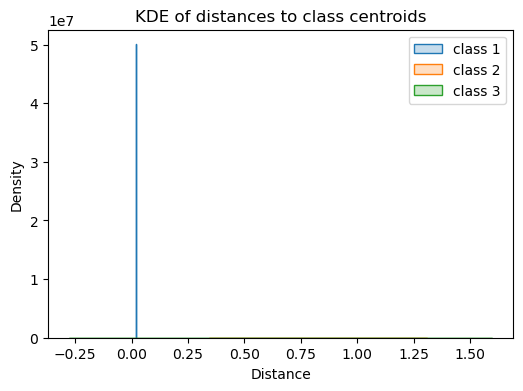

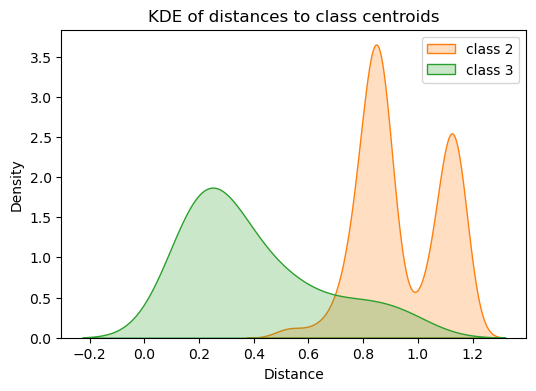

BraTS-GLI-00043-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]


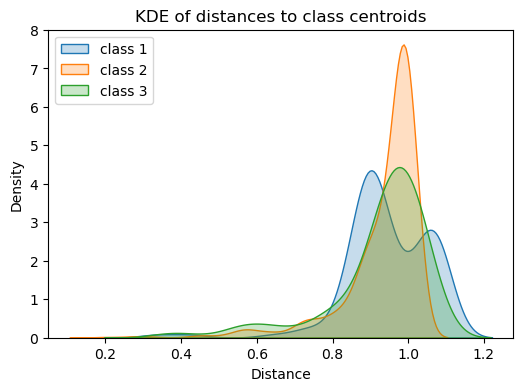

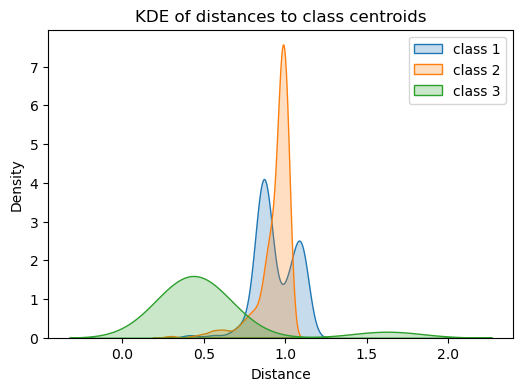

BraTS-GLI-00095-001-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]


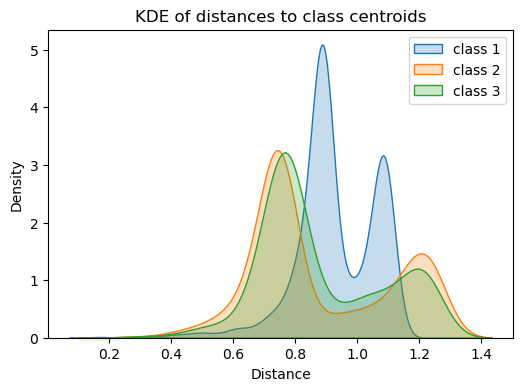

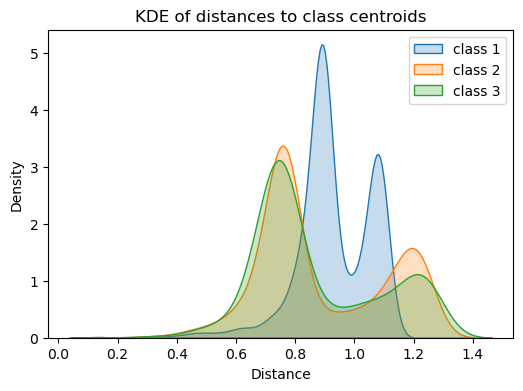

BraTS-GLI-00172-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]


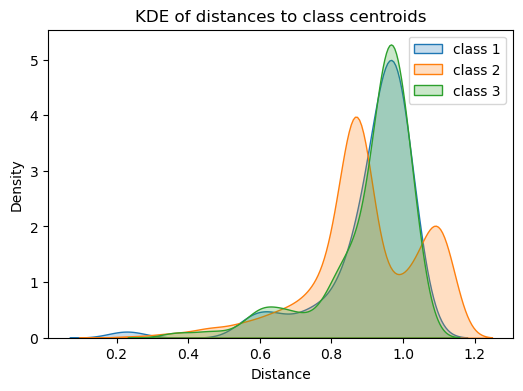

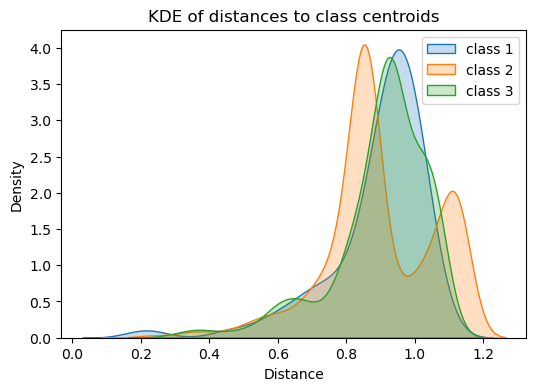

BraTS-GLI-00259-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]


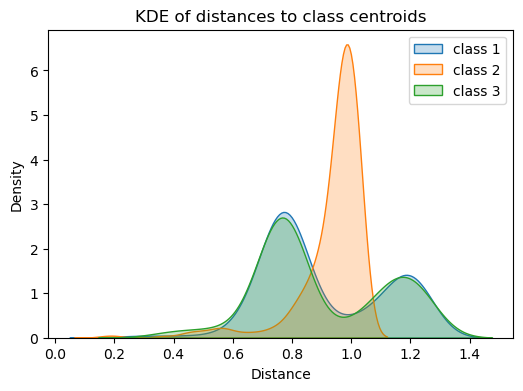

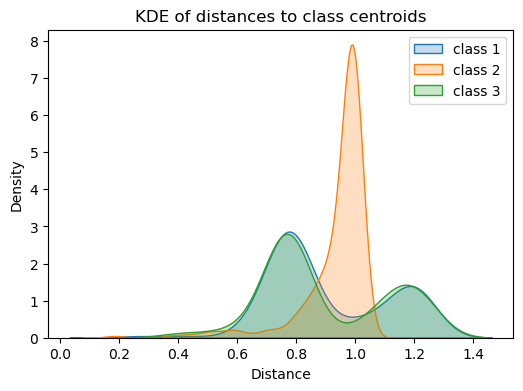

BraTS-GLI-00289-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]


/tmp/ipykernel_10462/2678722425.py:91: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(distances[lb == c], label=f"class {c}", fill=True)


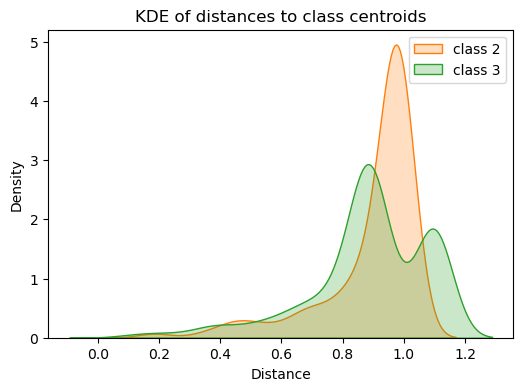

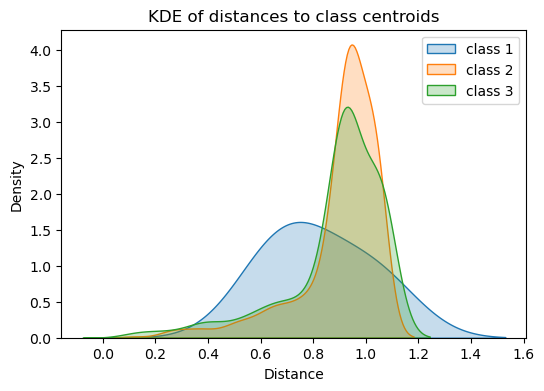

BraTS-GLI-00336-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]


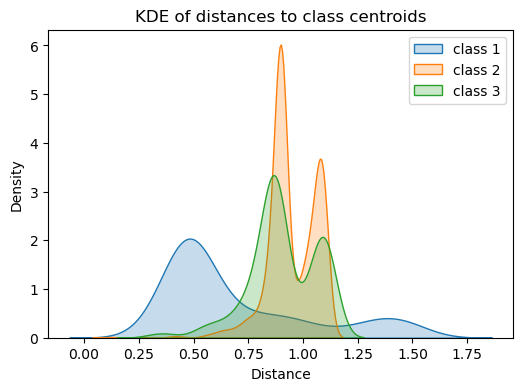

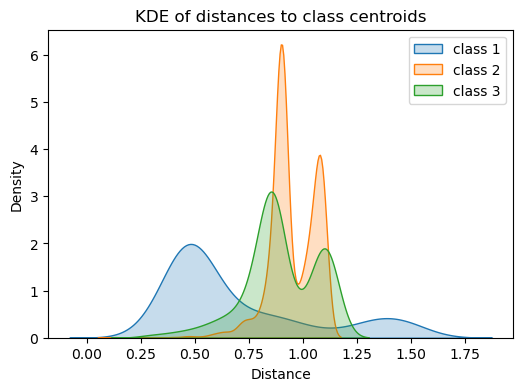

BraTS-GLI-00523-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]


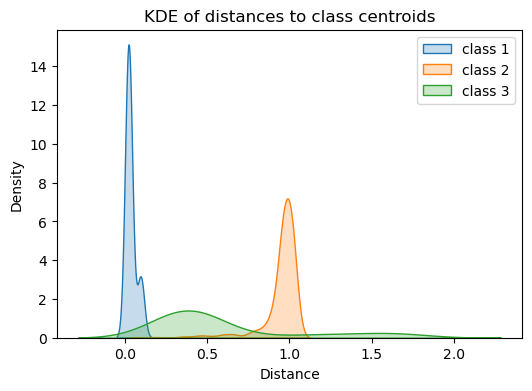

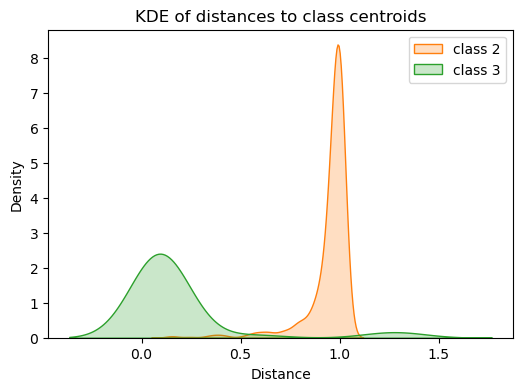

BraTS-GLI-00548-001-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]


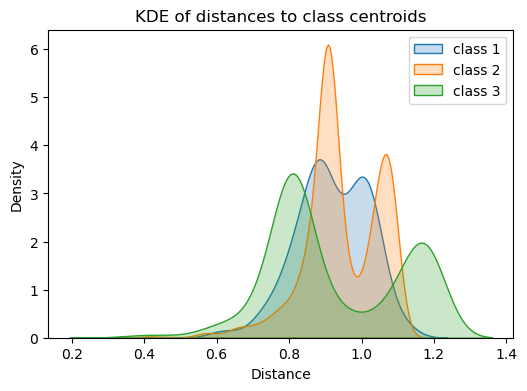

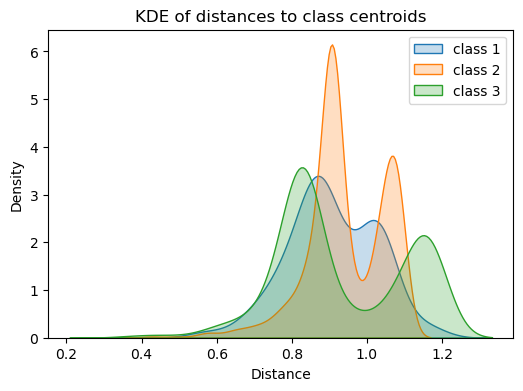

BraTS-GLI-00692-001-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]


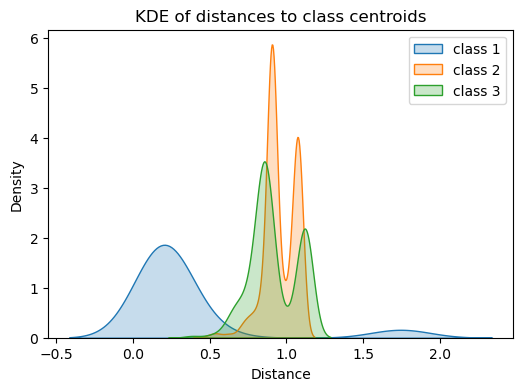

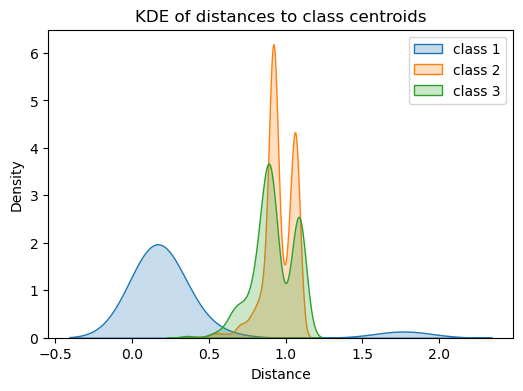

BraTS-SSA-00002-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]


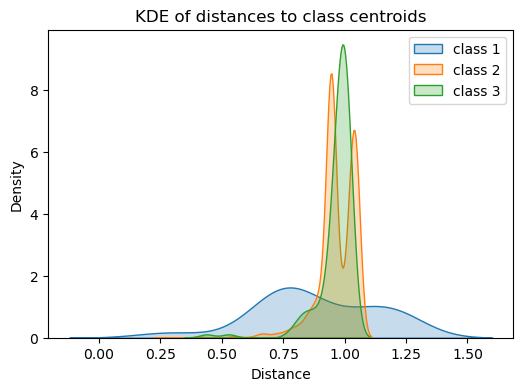

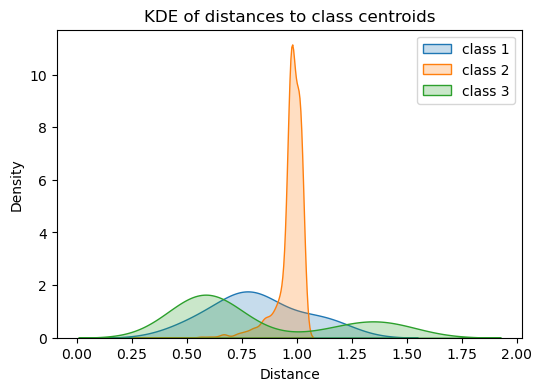

BraTS-SSA-00012-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]


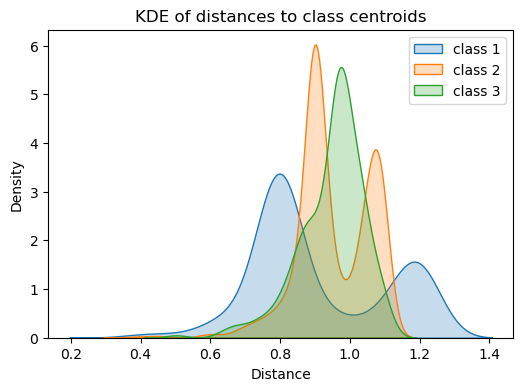

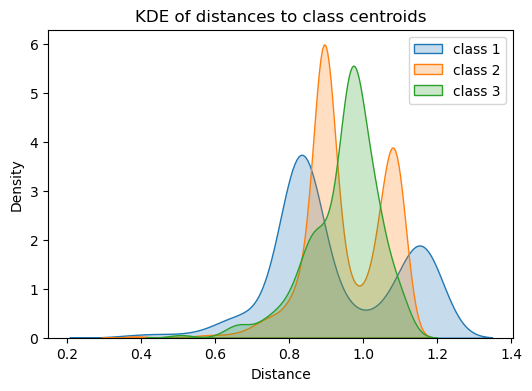

BraTS-SSA-00046-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]


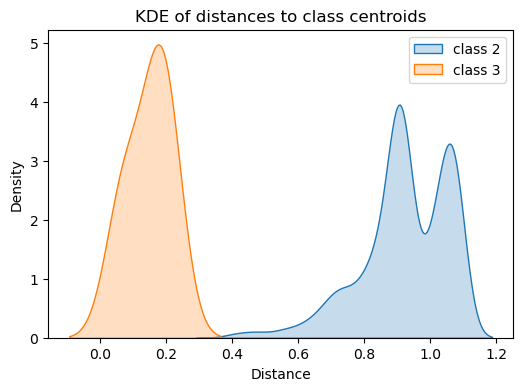

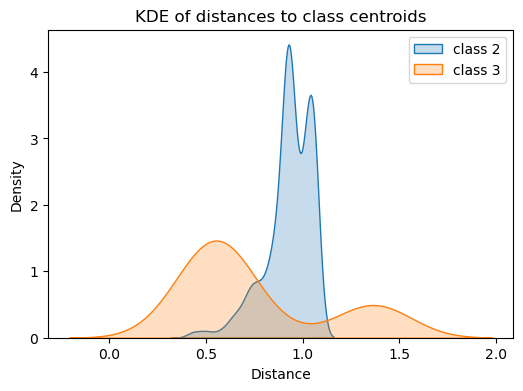

BraTS-SSA-00049-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]


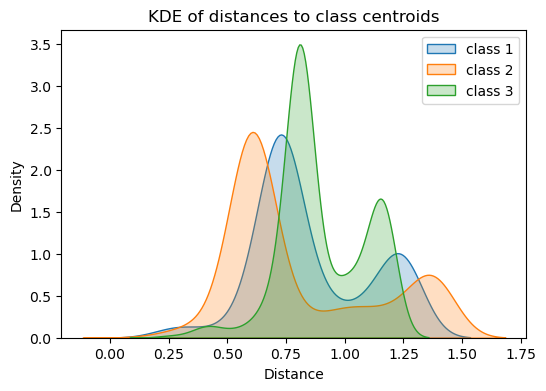

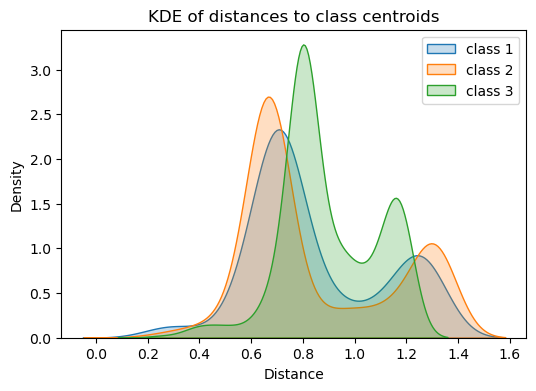

BraTS-SSA-00096-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]


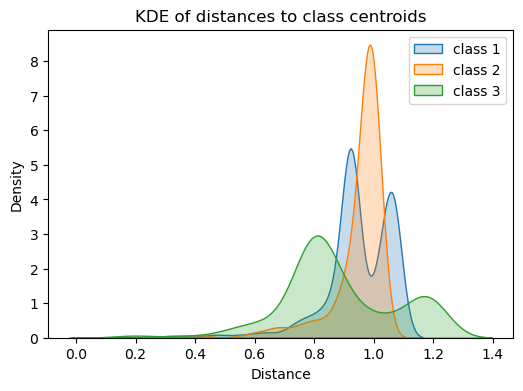

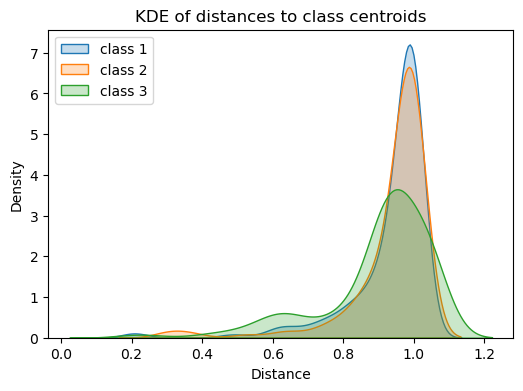

BraTS-SSA-00113-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]


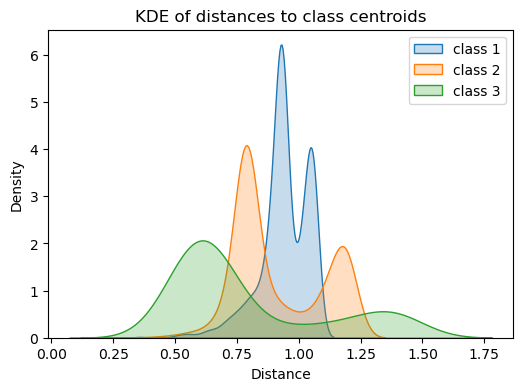

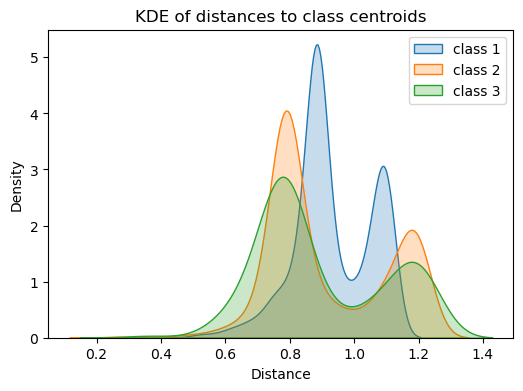

BraTS-SSA-00115-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]


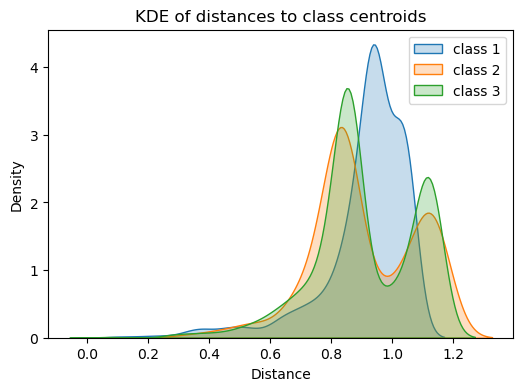

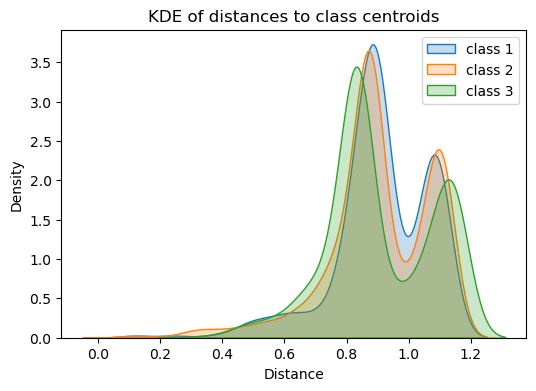

BraTS-SSA-00119-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]


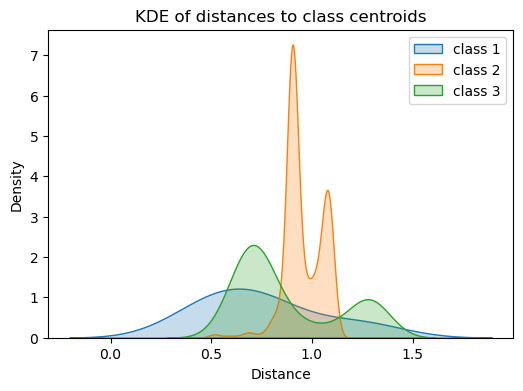

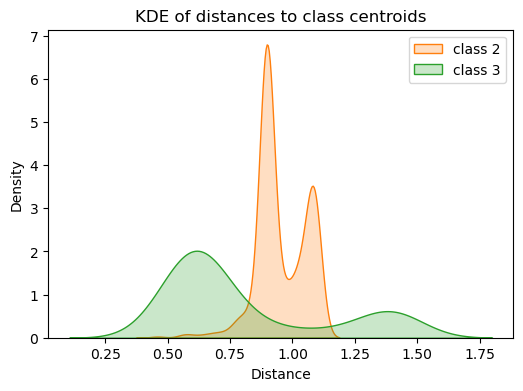

BraTS-SSA-00152-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]


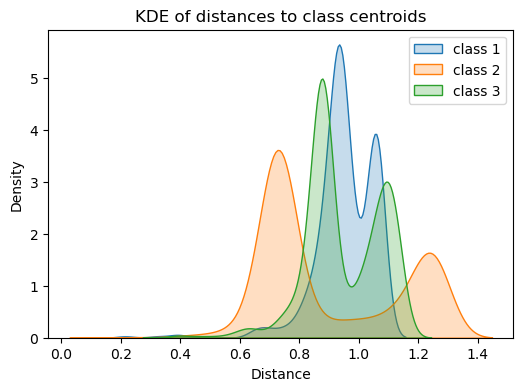

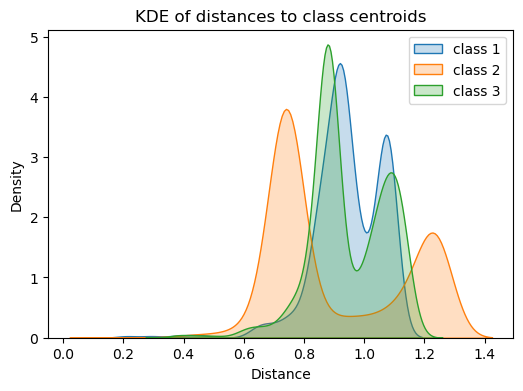

BraTS-SSA-00223-000-stk.npy
pred.shape (16384, 32)
pred_label.shape (3, 128, 128)
pred_keep:(16384,)
label.shape (3, 128, 128)
label_map.shape (128, 128)
Keep:[False False False ... False False False]


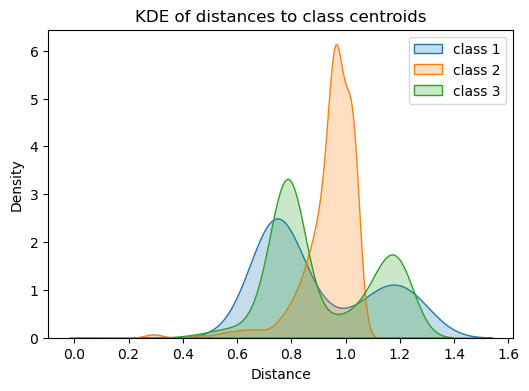

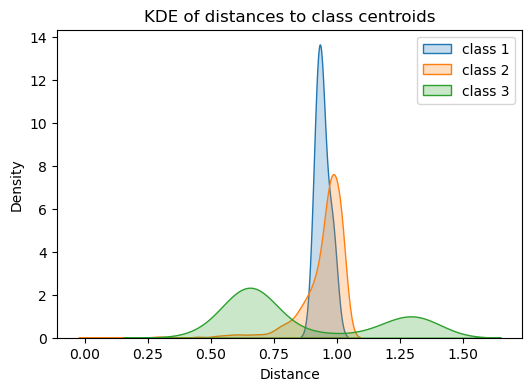

In [ ]:
visualize_KDE(dataset, pred_path, pca_decoder, title, path_img, pred_path2=pred_path2)

# Interpretation

Compactness:
Well - Classfied

Not Well Classified

BraTS 

BraTS - Africa


Breadth of Curve:

Right-shifted curve:

Heavy tails / multiple peaks (Outliers of subclusters) :

Overlap between classes’ curves → classes have similar spread; not bad by itself, but if many points of one class sit far from 0, they’re more likely to be confused.

## Earlier within. Do both of these differ significantly?

In [28]:
sample = np.load('/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/extracted_feats/save_k/BraTS-GLI-00008-000.npy')
sample.shape

(1, 1024, 256)

In [29]:
sample = np.load('/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/extracted_feats/save_q/BraTS-GLI-00008-000.npy')
sample.shape

(1, 10, 256)

In [30]:
token = sample[:, 1 + 1 : (1 + 1 + 4), :]

In [31]:
token.shape

(1, 4, 256)

In [34]:
def merge_feats_token(path, pattern_suffix=".npy"):
    files = sorted([f for f in os.listdir(path) if f.endswith(pattern_suffix)])
    if not files:
        raise ValueError(f"No {pattern_suffix} files found in {path}")

    arrays = []
    ref_shape = None
    for f in files:
        a = np.load(os.path.join(path, f))
        a = a[:, 1 + 1 : (1 + 1 + 4), :]
        a = a.squeeze(0)
        if ref_shape is None:
            ref_shape = a.shape
        elif a.shape != ref_shape:
            raise ValueError(f"Shape mismatch: {f} has {a.shape}, expected {ref_shape}")
        arrays.append(a)

    return np.stack(arrays, axis=0) , files

In [71]:
path = '/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/extracted_feats/save_q'
output_feats, file_names = merge_feats_token(path)
file_names = file_names
output_feats.shape


(20, 4, 256)

(80, 256)
[0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0
 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1
 2 3 0 1 2 3]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1]
(80,)
(2,)
(2,)
(2,)
(2,)


/tmp/ipykernel_20717/1243924221.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', C)


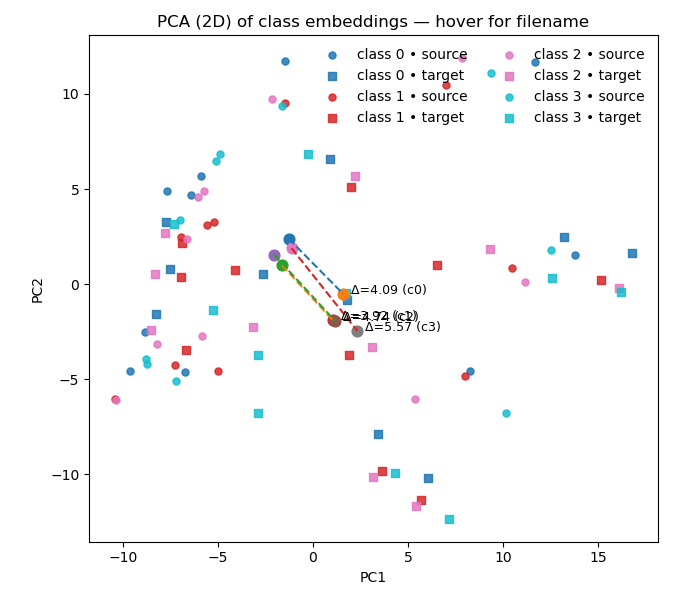

In [72]:
# feats: (20, 4, 256)
N, C, D = output_feats.shape
domain = np.array([0]*10 + [1]*10) # 0=source (first 10), 1=target (last 10)

# --- flatten samples × classes ---
X = output_feats.reshape(-1, D)            # (N*C, 256)
print(X.shape)
# N = 10
y_class = np.tile(np.arange(C), N)      # cycle classes fastest
print(y_class)
y_dom   = np.repeat(domain, C)     # domain per row
print(y_dom)
# --- standardize globally (fit on source only to avoid leakage) ---
src_rows = (y_dom == 0)
scaler = StandardScaler().fit(X)
Xz = scaler.transform(X)

# --- PCA to 2D (fit on source only), then transform all ---
pca = PCA(n_components=2, random_state=0).fit(Xz)
Z = pca.transform(Xz)                 # (N*C, 2)

# --- reshape back to (N, 4, 2) ---
feats_pca = Z.reshape(N, C, 2)

# ---------- Plot: color=class, marker=domain ----------
cmap = plt.cm.get_cmap('tab10', C)
markers = {0:'o', 1:'s'}
labels_dom = {0:'source', 1:'target'}


if len(file_names) == N:
    labels_all = np.repeat(np.array(file_names), C)
elif len(file_names) == N * C:
    labels_all = np.array(file_names)
else:
    raise ValueError(f"'file_names' must be length N ({N}) or N*C ({N*C}), got {len(file_names)}")


print(labels_all.shape)
fig, ax = plt.subplots(figsize=(7,6))

scatters = []              # store PathCollections for points
indices_per_scatter = []   # store the global indices in Z for each artist

for c in range(C):
    for d in (0, 1):
        idx = (y_class == c) & (y_dom == d)
        if idx.any():
            sc_pts = ax.scatter(Z[idx, 0], Z[idx, 1], s=26, alpha=0.85,
                                c=[cmap(c)], marker=markers[d],
                                label=f'class {c} • {labels_dom[d]}')
            scatters.append(sc_pts)
            indices_per_scatter.append(np.flatnonzero(idx))

# centroid arrows: source -> target per class (keep these, but don't attach cursor to them)
for c in range(C):
    src_idx = (y_class==c) & (y_dom==0)
    tgt_idx = (y_class==c) & (y_dom==1)
    if src_idx.any() and tgt_idx.any():
        mu_s = Z[src_idx].mean(axis=0)
        mu_t = Z[tgt_idx].mean(axis=0)
        print(mu_s.shape)
        ax.plot([mu_s[0], mu_t[0]], [mu_s[1], mu_t[1]], linestyle='--')
        ax.scatter(*mu_s, s=60)
        ax.scatter(*mu_t, s=60)
        ax.text(mu_t[0], mu_t[1], f'  Δ={np.linalg.norm(mu_t-mu_s):.2f} (c{c})', fontsize=9)

# --- Hover tooltips on only the point scatters ---
cursor = mplcursors.cursor(
    scatters,
    hover=True,
    annotation_kwargs=dict(arrowprops=None)  # <- no arrow
)

@cursor.connect("add")
def on_add(sel):
    k = scatters.index(sel.artist)
    i_global = indices_per_scatter[k][sel.index]
    print(i_global)
    sel.annotation.set_text(
        f"{labels_all[i_global]}\n"
        f"class {int(y_class[i_global])} • "
        f"{'source' if y_dom[i_global]==0 else 'target'}"
    )
        # If running older Matplotlib where bbox may be missing, set it defensively:
    if sel.annotation.get_bbox_patch() is None:
        sel.annotation.set_bbox(dict(boxstyle="round", fc="w", ec="0.5", alpha=0.9))
    # sel.annotation.get_bbox_patch().set(alpha=0.9)


ax.set_aspect('equal', 'box')
h, l = ax.get_legend_handles_labels()
uniq = dict(zip(l, h))
ax.legend(uniq.values(), uniq.keys(), frameon=False, ncol=2)
ax.set_title('PCA (2D) of class embeddings — hover for filename')
ax.set_xlabel('PC1'); ax.set_ylabel('PC2')
plt.tight_layout(); plt.show()

# Image Embeddings

In [48]:
def merge_feats_reshape(path, pattern_suffix=".npy"):
    files = sorted([f for f in os.listdir(path) if f.endswith(pattern_suffix)])
    if not files:
        raise ValueError(f"No {pattern_suffix} files found in {path}")

    arrays = []
    ref_shape = None
    for f in files:
        a = np.load(os.path.join(path, f))
        a = a.squeeze(0)
        a = a.reshape(-1)
        if ref_shape is None:
            ref_shape = a.shape
        elif a.shape != ref_shape:
            raise ValueError(f"Shape mismatch: {f} has {a.shape}, expected {ref_shape}")
        arrays.append(a)

    return np.stack(arrays, axis=0) , files

[0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0
 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1 2 3 0 1
 2 3 0 1 2 3]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1]
(80,)
(2,)
(2,)
(2,)
(2,)


/tmp/ipykernel_20717/709770944.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', C)


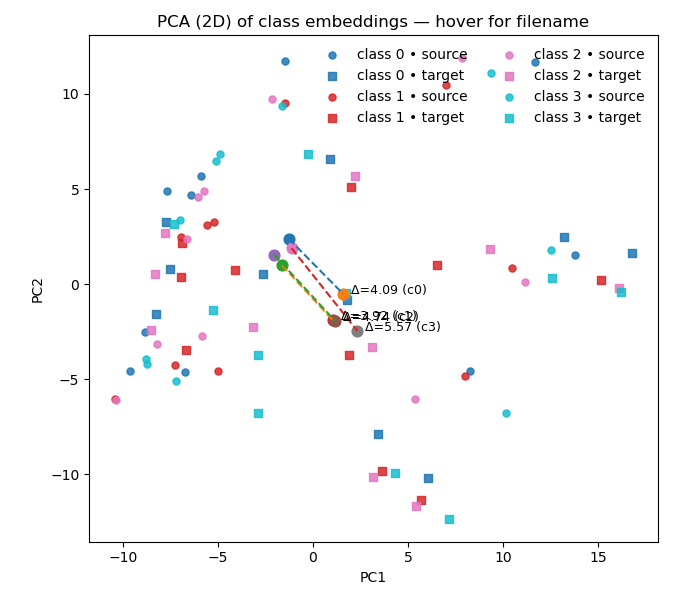

ValueError: <matplotlib.collections.PathCollection object at 0x7fecd5b4afe0> is not in list

ValueError: <matplotlib.collections.PathCollection object at 0x7fecd5a571c0> is not in list

ValueError: <matplotlib.collections.PathCollection object at 0x7fecd5b4ab90> is not in list

ValueError: <matplotlib.collections.PathCollection object at 0x7fecd5b4ab90> is not in list

ValueError: <matplotlib.collections.PathCollection object at 0x7fecd5a37880> is not in list

ValueError: <matplotlib.collections.PathCollection object at 0x7fecd5aa8850> is not in list

ValueError: <matplotlib.collections.PathCollection object at 0x7fecd5a571c0> is not in list

ValueError: <matplotlib.collections.PathCollection object at 0x7fecd5a37880> is not in list

ValueError: <matplotlib.collections.PathCollection object at 0x7fecd5aa8850> is not in list

ValueError: <matplotlib.collections.PathCollection object at 0x7fecd5a571c0> is not in list

In [48]:
# feats: (20, 4, 256)
N, C, D = output_feats.shape
domain = np.array([0]*10 + [1]*10)   # 0=source (first 10), 1=target (last 10)

# --- flatten samples × classes ---
X = output_feats.reshape(-1, D)             # (N*C, 256)
y_class = np.tile(np.arange(C), N)      # cycle classes fastest
print(y_class)
y_dom   = np.repeat(domain, C)     # domain per row
print(y_dom)
# --- standardize globally (fit on source only to avoid leakage) ---
src_rows = (y_dom == 0)
scaler = StandardScaler().fit(X)
Xz = scaler.transform(X)

# --- PCA to 2D (fit on source only), then transform all ---
pca = PCA(n_components=2, random_state=0).fit(Xz)
Z = pca.transform(Xz)                 # (N*C, 2)

# --- reshape back to (N, 4, 2) ---
feats_pca = Z.reshape(N, C, 2)

# ---------- Plot: color=class, marker=domain ----------
cmap = plt.cm.get_cmap('tab10', C)
markers = {0:'o', 1:'s'}
labels_dom = {0:'source', 1:'target'}


if len(file_names) == N:
    labels_all = np.repeat(np.array(file_names), C)
elif len(file_names) == N * C:
    labels_all = np.array(file_names)
else:
    raise ValueError(f"'file_names' must be length N ({N}) or N*C ({N*C}), got {len(file_names)}")


print(labels_all.shape)
fig, ax = plt.subplots(figsize=(7,6))

scatters = []              # store PathCollections for points
indices_per_scatter = []   # store the global indices in Z for each artist

for c in range(C):
    for d in (0, 1):
        idx = (y_class == c) & (y_dom == d)
        if idx.any():
            sc_pts = ax.scatter(Z[idx, 0], Z[idx, 1], s=26, alpha=0.85,
                                c=[cmap(c)], marker=markers[d],
                                label=f'class {c} • {labels_dom[d]}')
            scatters.append(sc_pts)
            indices_per_scatter.append(np.flatnonzero(idx))

# centroid arrows: source -> target per class (keep these, but don't attach cursor to them)
for c in range(C):
    src_idx = (y_class==c) & (y_dom==0)
    tgt_idx = (y_class==c) & (y_dom==1)
    if src_idx.any() and tgt_idx.any():
        mu_s = Z[src_idx].mean(axis=0)
        mu_t = Z[tgt_idx].mean(axis=0)
        print(mu_s.shape)
        ax.plot([mu_s[0], mu_t[0]], [mu_s[1], mu_t[1]], linestyle='--')
        ax.scatter(*mu_s, s=60)
        ax.scatter(*mu_t, s=60)
        ax.text(mu_t[0], mu_t[1], f'  Δ={np.linalg.norm(mu_t-mu_s):.2f} (c{c})', fontsize=9)

# --- Hover tooltips on only the point scatters ---
cursor = mplcursors.cursor(
    scatters,
    hover=True,
    annotation_kwargs=dict(arrowprops=None)  # <- no arrow
)

@cursor.connect("add")
def on_add(sel):
    k = scatters.index(sel.artist)
    i_global = indices_per_scatter[k][sel.index]
    print(i_global)
    sel.annotation.set_text(
        f"{labels_all[i_global]}\n"
        f"class {int(y_class[i_global])} • "
        f"{'source' if y_dom[i_global]==0 else 'target'}"
    )
        # If running older Matplotlib where bbox may be missing, set it defensively:
    if sel.annotation.get_bbox_patch() is None:
        sel.annotation.set_bbox(dict(boxstyle="round", fc="w", ec="0.5", alpha=0.9))
    # sel.annotation.get_bbox_patch().set(alpha=0.9)


ax.set_aspect('equal', 'box')
h, l = ax.get_legend_handles_labels()
uniq = dict(zip(l, h))
ax.legend(uniq.values(), uniq.keys(), frameon=False, ncol=2)
ax.set_title('PCA (2D) of class embeddings — hover for filename')
ax.set_xlabel('PC1'); ax.set_ylabel('PC2')
plt.tight_layout(); plt.show()

In [49]:
# Load Image Embeddings
path_to_image_embeddings = '/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/extracted_feats/vision_feats'
image_embs, files = merge_feats_reshape(path_to_image_embeddings)

In [50]:
image_embs.shape

(20, 262144)

In [125]:
# PCA dimension reduction
domain = np.array([0]*10 + [1]*10)   # 0=source (first 10), 1=target (last 10



src_rows = (domain == 0)
scaler = StandardScaler().fit(image_embs)
IE = scaler.transform(image_embs)


pca = PCA(n_components=6, random_state=0).fit(IE)
ZIE = pca.transform(IE)                 # (N*C, 2)


In [126]:
ZIE.shape

(20, 6)

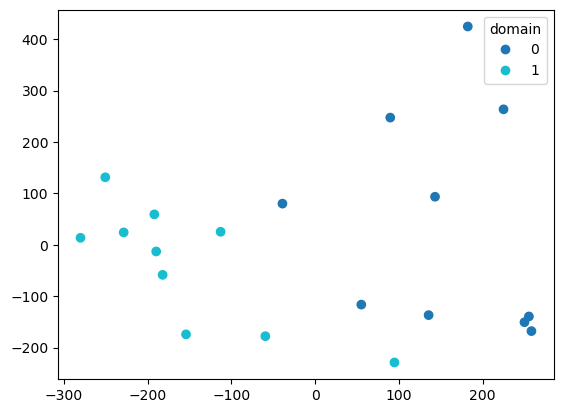

In [127]:
cats, dom_idx = np.unique(domain, return_inverse=True)  # map labels → 0..K-1
sc = plt.scatter(ZIE[:,0], ZIE[:,1], c=dom_idx, cmap='tab10')

# Make a legend with proper label→color mapping
handles = [plt.Line2D([], [], marker='o', linestyle='',
                      color=sc.cmap(sc.norm(i)), label=cat)
           for i, cat in enumerate(cats)]
plt.legend(handles=handles, title='domain')

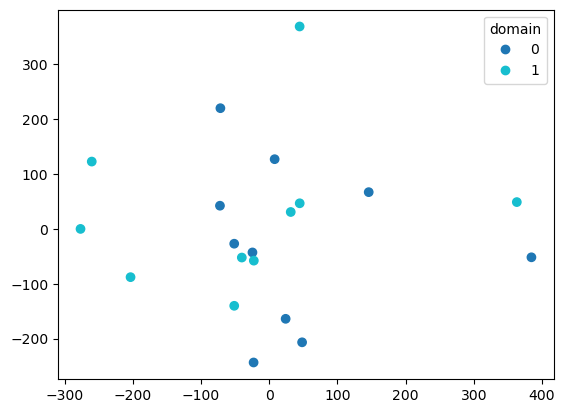

In [128]:
cats, dom_idx = np.unique(domain, return_inverse=True)  # map labels → 0..K-1
sc = plt.scatter(ZIE[:,2], ZIE[:,4], c=dom_idx, cmap='tab10')

# Make a legend with proper label→color mapping
handles = [plt.Line2D([], [], marker='o', linestyle='',
                      color=sc.cmap(sc.norm(i)), label=cat)
           for i, cat in enumerate(cats)]
plt.legend(handles=handles, title='domain')

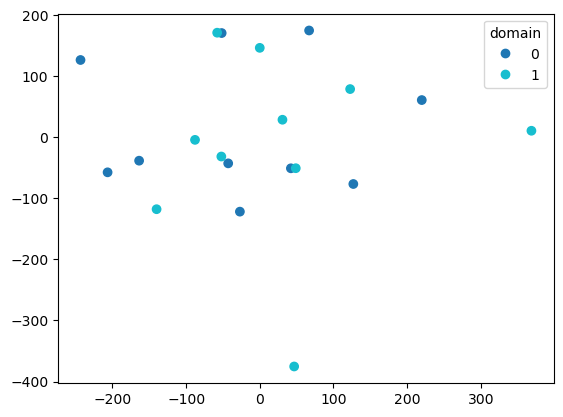

In [129]:
cats, dom_idx = np.unique(domain, return_inverse=True)  # map labels → 0..K-1
sc = plt.scatter(ZIE[:,4], ZIE[:,5], c=dom_idx, cmap='tab10')

# Make a legend with proper label→color mapping
handles = [plt.Line2D([], [], marker='o', linestyle='',
                      color=sc.cmap(sc.norm(i)), label=cat)
           for i, cat in enumerate(cats)]
plt.legend(handles=handles, title='domain')

In [70]:
from scipy.stats import entropy

kl_A_to_B = entropy(image_embs[:10], image_embs[10:])              # KL(P||Q)
kl_B_to_A = entropy(image_embs[:10], image_embs[10:])

In [74]:
print(kl_A_to_B[:20].mean())
print(kl_B_to_A[:20].mean())

0.042417217
0.042417217


Image embeddings not so much.

## refined

In [132]:
ref_imemb_path = '/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/extracted_feats/save_k'
ima_embs, files = merge_feats(ref_imemb_path)

In [134]:
ref_imemb_path = '/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/extracted_feats/save_k'
ima_embs, files = merge_feats(ref_imemb_path)
ima_embs = ima_embs.reshape(20, -1)
ima_embs.shape

(20, 262144)

In [135]:
domain = np.array([0]*10 + [1]*10)   # 0=source (first 10), 1=target (last 10



src_rows = (domain == 0)
scaler = StandardScaler().fit(ima_embs)
RIE = scaler.transform(ima_embs)


pca = PCA(n_components=6, random_state=0).fit(RIE)
RZIE = pca.transform(RIE)                 # (N*C, 2)


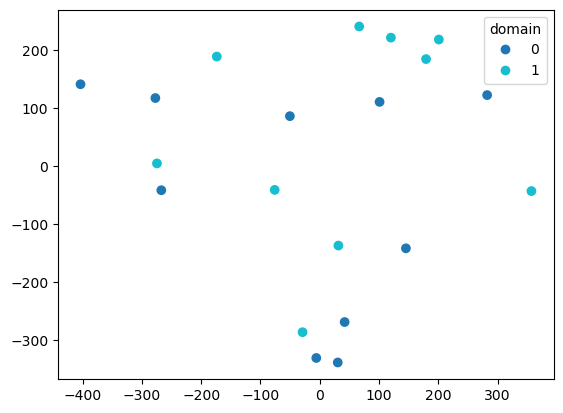

In [136]:
cats, dom_idx = np.unique(domain, return_inverse=True)  # map labels → 0..K-1
sc = plt.scatter(RZIE[:,0], RZIE[:,1], c=dom_idx, cmap='tab10')

# Make a legend with proper label→color mapping
handles = [plt.Line2D([], [], marker='o', linestyle='',
                      color=sc.cmap(sc.norm(i)), label=cat)
           for i, cat in enumerate(cats)]
plt.legend(handles=handles, title='domain')

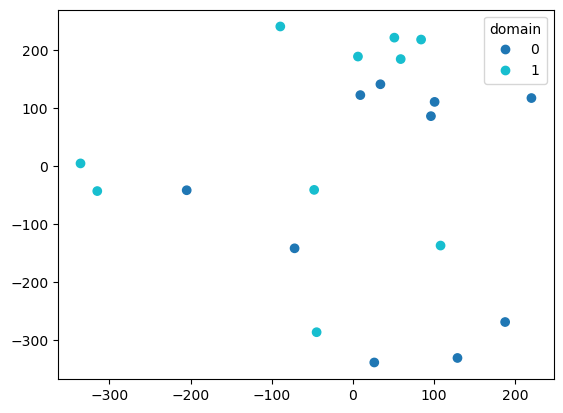

In [139]:
cats, dom_idx = np.unique(domain, return_inverse=True)  # map labels → 0..K-1
sc = plt.scatter(RZIE[:,2], RZIE[:,1], c=dom_idx, cmap='tab10')

# Make a legend with proper label→color mapping
handles = [plt.Line2D([], [], marker='o', linestyle='',
                      color=sc.cmap(sc.norm(i)), label=cat)
           for i, cat in enumerate(cats)]
plt.legend(handles=handles, title='domain')

In [140]:
ref_imemb_path = '/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/extracted_feats/save_q'
ima_embs, files = merge_feats(ref_imemb_path)
ima_embs = ima_embs.reshape(20, -1)
ima_embs.shape

domain = np.array([0]*10 + [1]*10)   # 0=source (first 10), 1=target (last 10



src_rows = (domain == 0)
scaler = StandardScaler().fit(ima_embs)
RIE = scaler.transform(ima_embs)


pca = PCA(n_components=6, random_state=0).fit(RIE)
RZIE = pca.transform(RIE)    

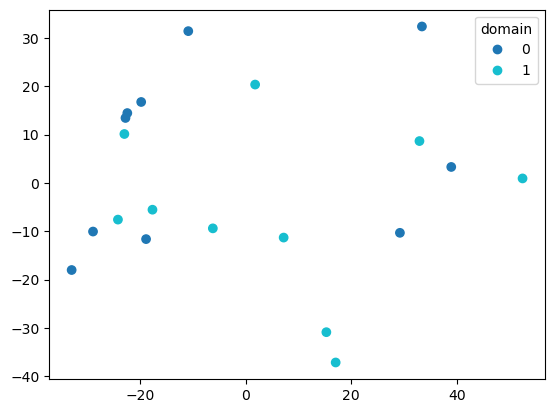

In [141]:
cats, dom_idx = np.unique(domain, return_inverse=True)  # map labels → 0..K-1
sc = plt.scatter(RZIE[:,0], RZIE[:,1], c=dom_idx, cmap='tab10')

# Make a legend with proper label→color mapping
handles = [plt.Line2D([], [], marker='o', linestyle='',
                      color=sc.cmap(sc.norm(i)), label=cat)
           for i, cat in enumerate(cats)]
plt.legend(handles=handles, title='domain')

## Decoder

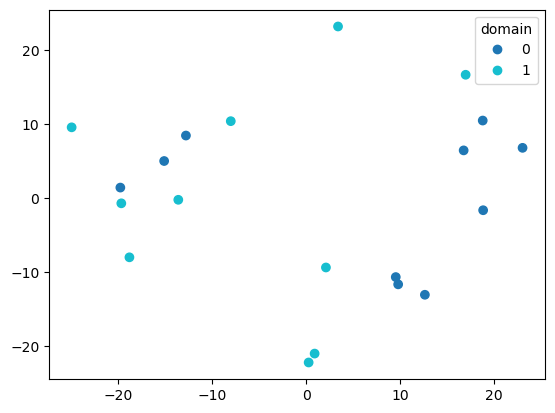

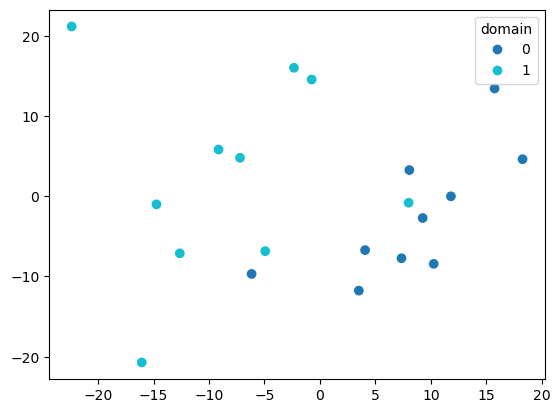

In [167]:
ref_imemb_path = '/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/extracted_feats/conditioned_feats'
ima_embs, files = merge_feats(ref_imemb_path)
ima_embs = ima_embs.reshape(20, -1)
ima_embs.shape

domain = np.array([0]*10 + [1]*10)   # 0=source (first 10), 1=target (last 10



src_rows = (domain == 0)
scaler = StandardScaler().fit(ima_embs)
RIE = scaler.transform(ima_embs)


pca = PCA(n_components=6, random_state=0).fit(RIE)
RZIE = pca.transform(RIE)  

cats, dom_idx = np.unique(domain, return_inverse=True)  # map labels → 0..K-1
sc = plt.scatter(RZIE[:,0], RZIE[:,1], c=dom_idx, cmap='tab10')

# Make a legend with proper label→color mapping
handles = [plt.Line2D([], [], marker='o', linestyle='',
                      color=sc.cmap(sc.norm(i)), label=cat)
           for i, cat in enumerate(cats)]
plt.legend(handles=handles, title='domain')
plt.show()

cats, dom_idx = np.unique(domain, return_inverse=True)  # map labels → 0..K-1
sc = plt.scatter(RZIE[:,2], RZIE[:,3], c=dom_idx, cmap='tab10')

# Make a legend with proper label→color mapping
handles = [plt.Line2D([], [], marker='o', linestyle='',
                      color=sc.cmap(sc.norm(i)), label=cat)
           for i, cat in enumerate(cats)]
plt.legend(handles=handles, title='domain')
plt.show()

(20, 32, 128, 128)


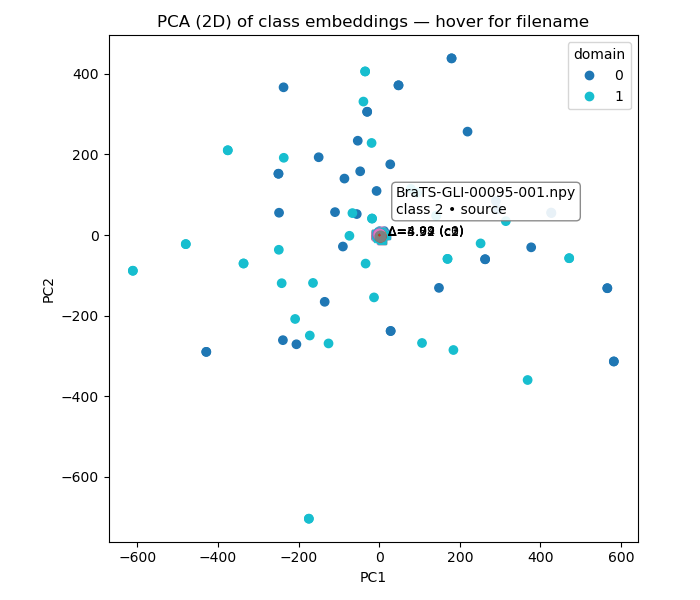

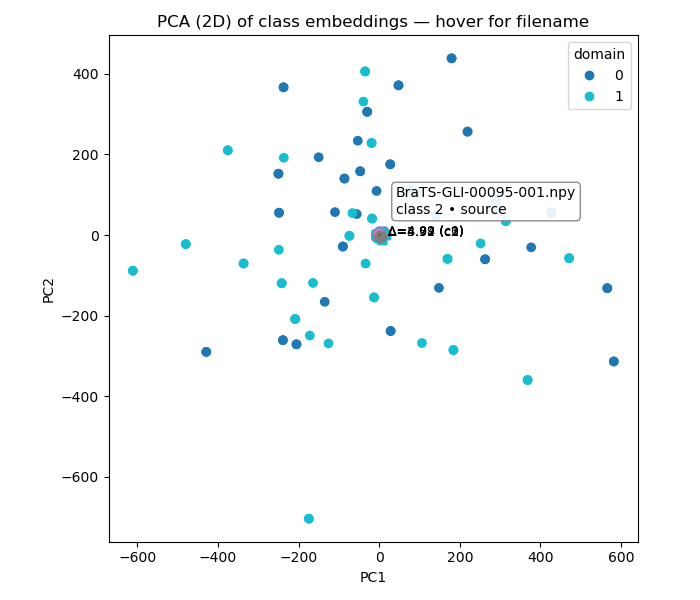

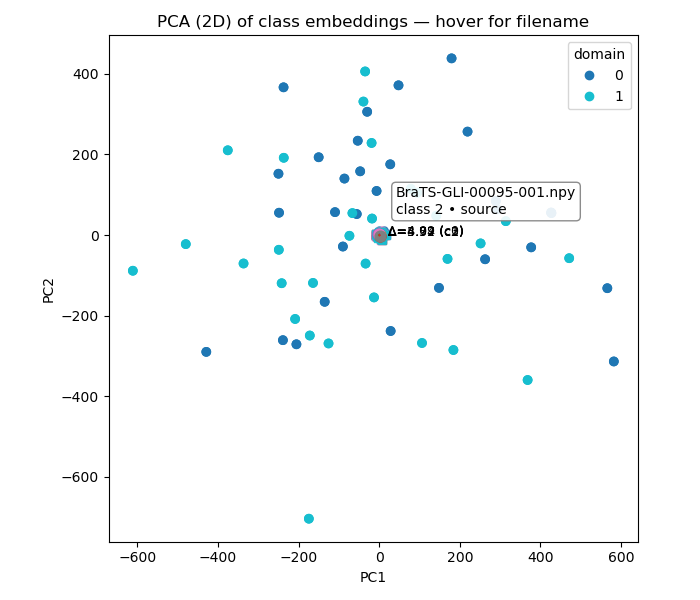

In [76]:
ref_imemb_path = '/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/extracted_feats/decoder_feats'
ima_embs, files = merge_feats(ref_imemb_path)
print(ima_embs.shape)
ima_embs = ima_embs.reshape(20, -1)
ima_embs.shape

domain = np.array([0]*10 + [1]*10)   # 0=source (first 10), 1=target (last 10



src_rows = (domain == 0)
scaler = StandardScaler().fit(ima_embs)
RIE = scaler.transform(ima_embs)


pca = PCA(n_components=6, random_state=0).fit(RIE)
RZIE = pca.transform(RIE)  

cats, dom_idx = np.unique(domain, return_inverse=True)  # map labels → 0..K-1
sc = plt.scatter(RZIE[:,0], RZIE[:,1], c=dom_idx, cmap='tab10')

# Make a legend with proper label→color mapping
handles = [plt.Line2D([], [], marker='o', linestyle='',
                      color=sc.cmap(sc.norm(i)), label=cat)
           for i, cat in enumerate(cats)]
plt.legend(handles=handles, title='domain')
plt.show()

cats, dom_idx = np.unique(domain, return_inverse=True)  # map labels → 0..K-1
sc = plt.scatter(RZIE[:,2], RZIE[:,3], c=dom_idx, cmap='tab10')

# Make a legend with proper label→color mapping
handles = [plt.Line2D([], [], marker='o', linestyle='',
                      color=sc.cmap(sc.norm(i)), label=cat)
           for i, cat in enumerate(cats)]
plt.legend(handles=handles, title='domain')
plt.show()

cats, dom_idx = np.unique(domain, return_inverse=True)  # map labels → 0..K-1
sc = plt.scatter(RZIE[:,4], RZIE[:,5], c=dom_idx, cmap='tab10')

# Make a legend with proper label→color mapping
handles = [plt.Line2D([], [], marker='o', linestyle='',
                      color=sc.cmap(sc.norm(i)), label=cat)
           for i, cat in enumerate(cats)]
plt.legend(handles=handles, title='domain')
plt.show()

Image embeddings introduce the domain shift into the decoder. During cross attention where the tokens are the queries and the image is the key and value, the tokens are more largely affected by domain shift. This domain shift lessens when image embedding is the querry why the tokens are the keys and values

## What makes them so different?

In [169]:
# Mainly the image embedding